In [1]:
%matplotlib inline
import sys
sys.path.append("../lib/")
import os
import string
import numpy as np
import pandas as pd
from pathlib import Path

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from sklearn.tree import plot_tree
import seaborn as sns
import graphviz
import shap

from raman_lib.visualization import (plot_spectra_peaks, 
                                     plot_qc_summary, 
                                     plot_confidence_scores, 
                                     plot_coefs, 
                                     plot_confusion_matrix, 
                                     plot_roc_curve, 
                                     plot_validation_curve,
                                     plot_roc_comparison,
                                     boxplot_comparison)

# Setup

In [2]:
dataset = "L_540_2022_C_E"

In [3]:
results_path = Path("../results/") / dataset
img_path = Path("../img/") / dataset

img_path.mkdir(parents=True, exist_ok=True)

In [4]:
data = pd.read_csv(results_path / (dataset + "_preprocessed.csv"))

y, y_key = pd.factorize(data.label)

In [5]:
rocs = {}
aucs = {}
p_vals = {}
accs = {}
f1_scores = {}
fit_times = {}
predict_times = {}

In [6]:
plt.style.use("seaborn-paper")
plt.rcParams["figure.figsize"] = (8,6)
plt.rcParams["figure.dpi"] = 200

plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["font.size"] = 10
plt.rcParams["axes.labelsize"] = 11
plt.rcParams["xtick.labelsize"] = 10
plt.rcParams["ytick.labelsize"] = 10
plt.rcParams["legend.fontsize"] = 10

# Quality Control

In [7]:
qc_results = pd.read_csv(results_path / (dataset + "_qc_scores.csv"))

qc_results.describe()

,Median Height,N Peaks
count,644.000000,644.000000
mean,499.795421,11.905280
std,409.446582,7.186823
min,0.000000,0.000000
25%,251.732071,5.750000
50%,377.522729,13.000000
75%,622.191017,18.000000
max,3384.882316,27.000000


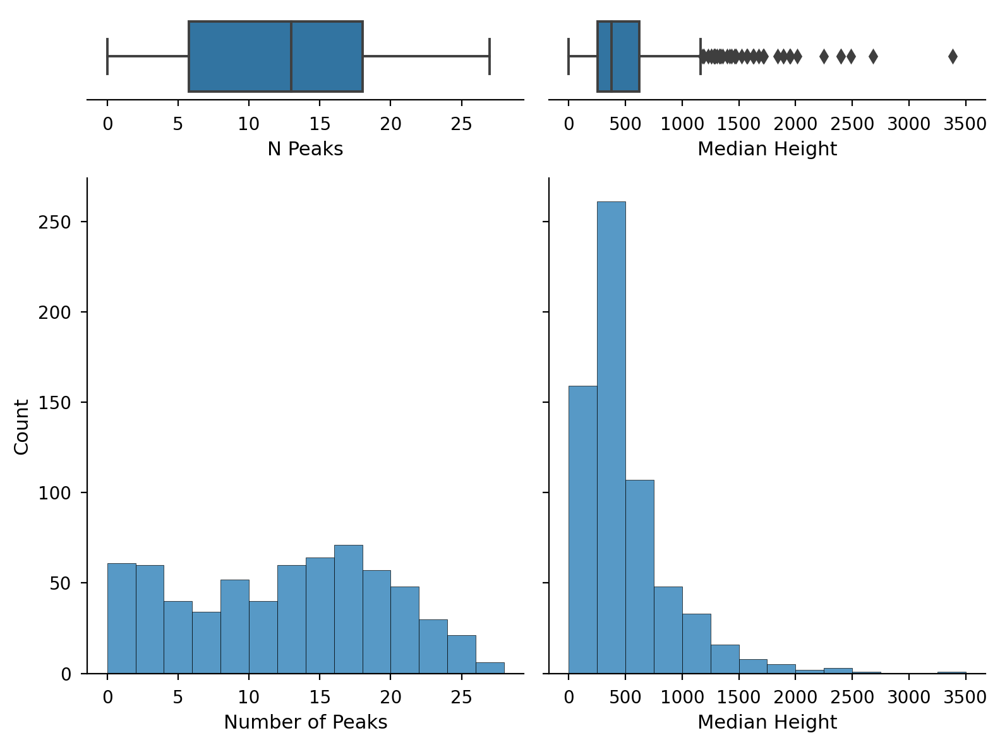

In [8]:
fig, ((ax_box1, ax_box2), (ax_hist1, ax_hist2)) = plt.subplots(
    2, 2, sharex="col", sharey="row", gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=qc_results.iloc[:,1], ax=ax_box1)
sns.boxplot(x=qc_results.iloc[:,0], ax=ax_box2)
sns.histplot(qc_results.iloc[:,1], ax=ax_hist1, binrange=None, binwidth=2)
sns.histplot(qc_results.iloc[:,0], ax=ax_hist2, binrange=None, binwidth=250)

ax_box1.set(yticks=[])
ax_box2.set(yticks=[])
sns.despine(ax=ax_hist1)
sns.despine(ax=ax_hist2)
sns.despine(ax=ax_box1, left=True)
sns.despine(ax=ax_box2, left=True)

ax_hist1.set_xlabel("Number of Peaks")
ax_hist2.set_xlabel(qc_results.columns[0])

#ax_hist1.set_ylim([None, ymax_peaks])
#ax_hist2.set_ylim([None, ymax_score])

ax_box1.tick_params(axis="x", labelbottom=True)
ax_box2.tick_params(axis="x", labelbottom=True)

fig.tight_layout()

# Dimensionality Reduction
## LDA
### Overview

In [9]:
current_path = results_path / "lda_dim_reduction/lda/"
name = "LDA"

ct_df = pd.read_csv(current_path / "ct_results.csv")

accs[name] = ct_df.test_accuracy
f1_scores[name] = ct_df.test_f1
fit_times[name] = ct_df.fit_time
predict_times[name] = ct_df.predict_time
p_vals[name] = ct_df.p_value

ct_df.describe()

,train_roc_auc,test_roc_auc,train_accuracy,test_accuracy,train_f1,test_f1,fit_time,predict_time,p_value
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,2.000000e+01
mean,1.000000,0.732783,0.999708,0.682667,0.999708,0.688352,0.431106,0.004809,6.088197e-09
std,0.000001,0.011817,0.000408,0.012036,0.000408,0.014791,0.029528,0.001650,1.602079e-08
min,0.999997,0.706222,0.998750,0.663333,0.998749,0.660353,0.381089,0.003217,2.829740e-12
25%,1.000000,0.725472,0.999479,0.677500,0.999479,0.678192,0.411980,0.003803,3.365343e-10
50%,1.000000,0.733778,1.000000,0.680000,1.000000,0.688791,0.420401,0.004039,1.018173e-09
75%,1.000000,0.739722,1.000000,0.688750,1.000000,0.698518,0.446635,0.005211,3.070974e-09
max,1.000000,0.753111,1.000000,0.706667,1.000000,0.716390,0.497931,0.008925,7.181610e-08


### Confidence scores by class

Text(0, 0.5, 'Confidence score (-)')

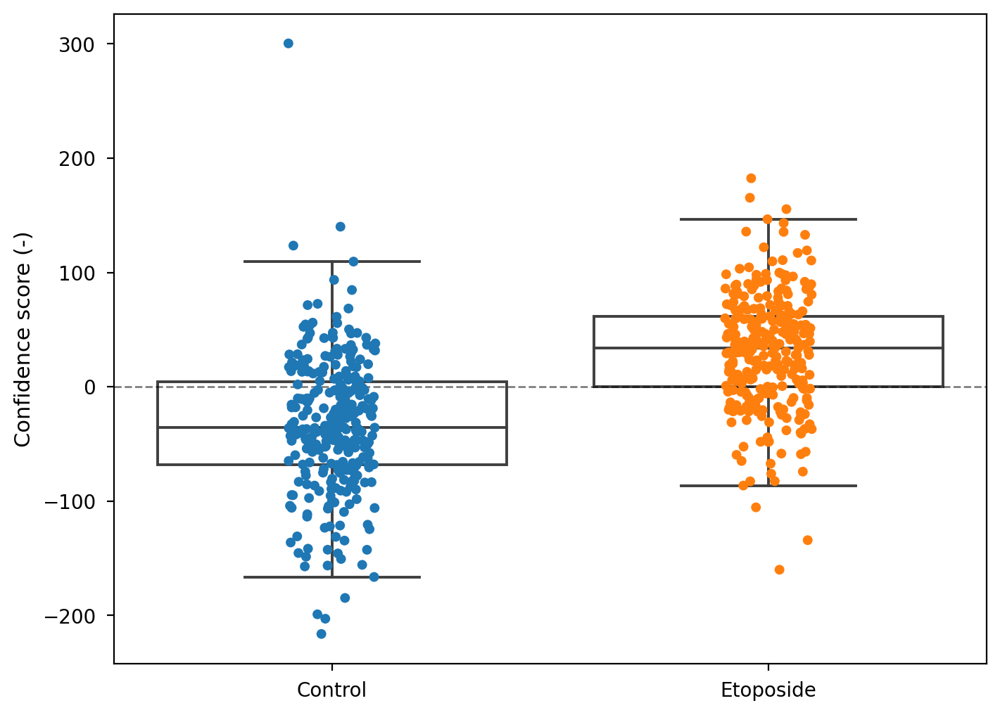

In [10]:
conf_score_df = pd.read_csv(current_path / "confidence_scores.csv", header=None)

fig, ax = plt.subplots()
ax.axhline(0, color="k", linestyle="--", linewidth=1, alpha=0.5)
plot_confidence_scores(conf_score_df, y_key[y], y_key, ax=ax)
ax.set_ylabel("Confidence score (-)")

### Model coefficients

Positive: Higher in Treated

Negative: Higher in Control

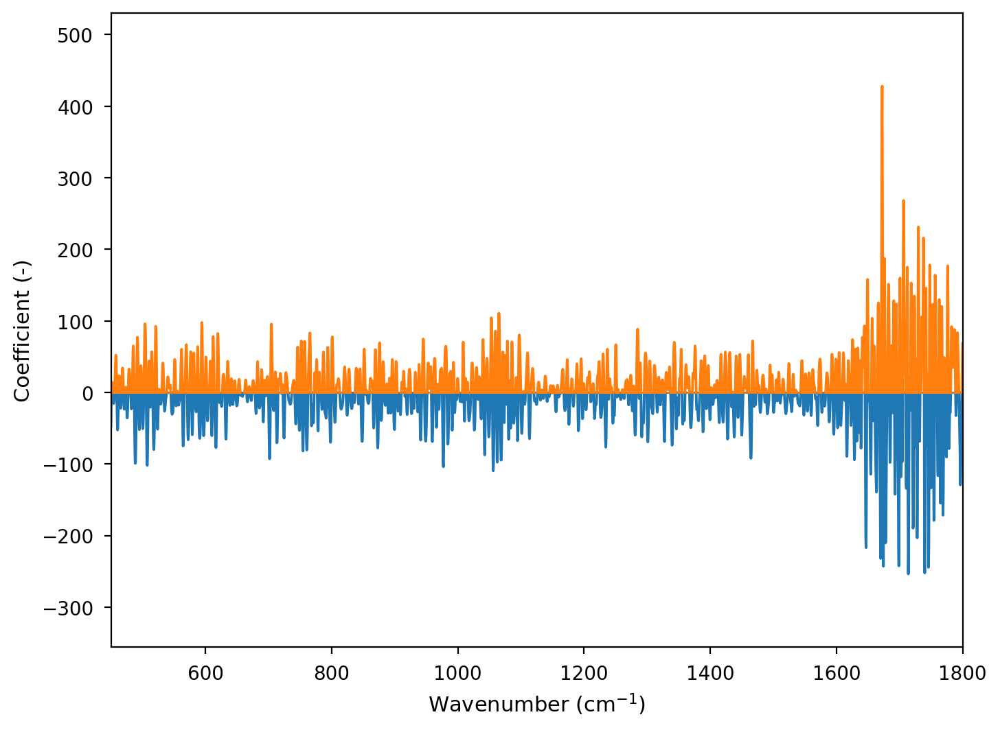

In [11]:
coef_df = pd.read_csv(current_path / "coefficients.csv")

fig, ax = plt.subplots()
plot_coefs(coef_df, ax=ax)

ax.set_xlabel("Wavenumber ($\mathregular{cm^{-1}}$)")
ax.set_ylabel("Coefficient (-)")
ax.margins(x=0, y=0.15)

### Confusion Matrix

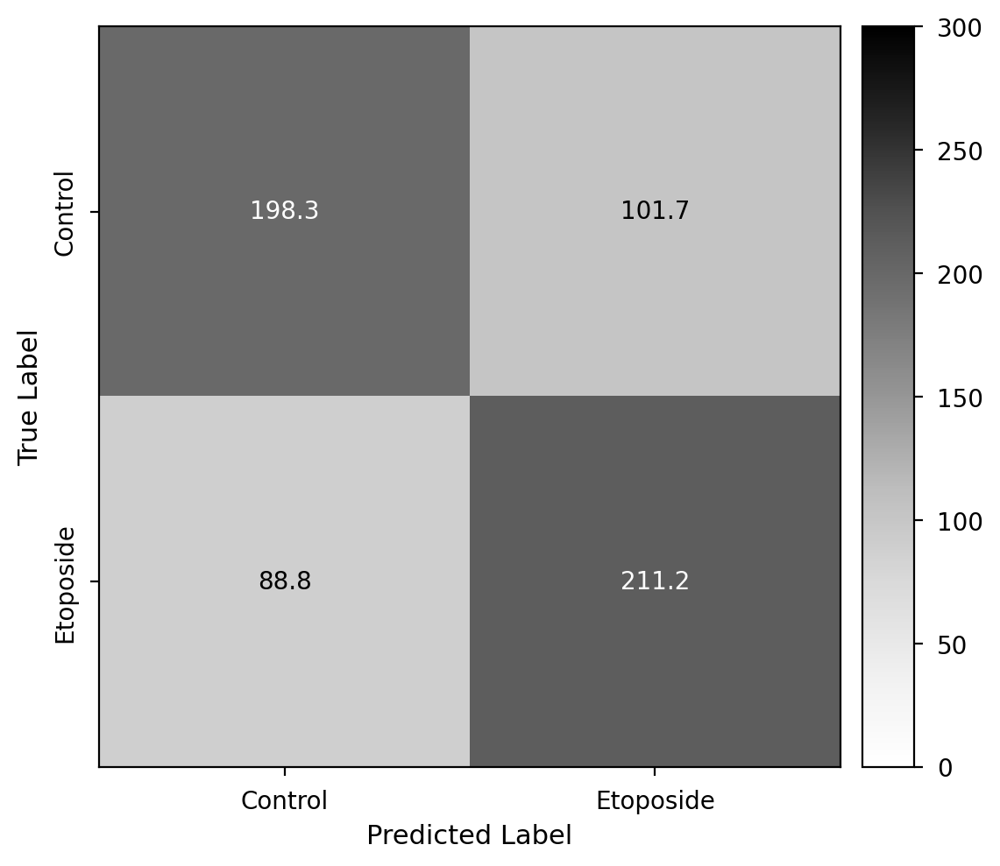

In [12]:
pred_df = pd.read_csv(current_path / "predictions.csv", header=None)

fig, ax = plt.subplots(figsize=(6,6))
plot_confusion_matrix(pred_df, y, labels=y_key, ax=ax, cmap="Greys", colorbar=True)

### ROC Curve

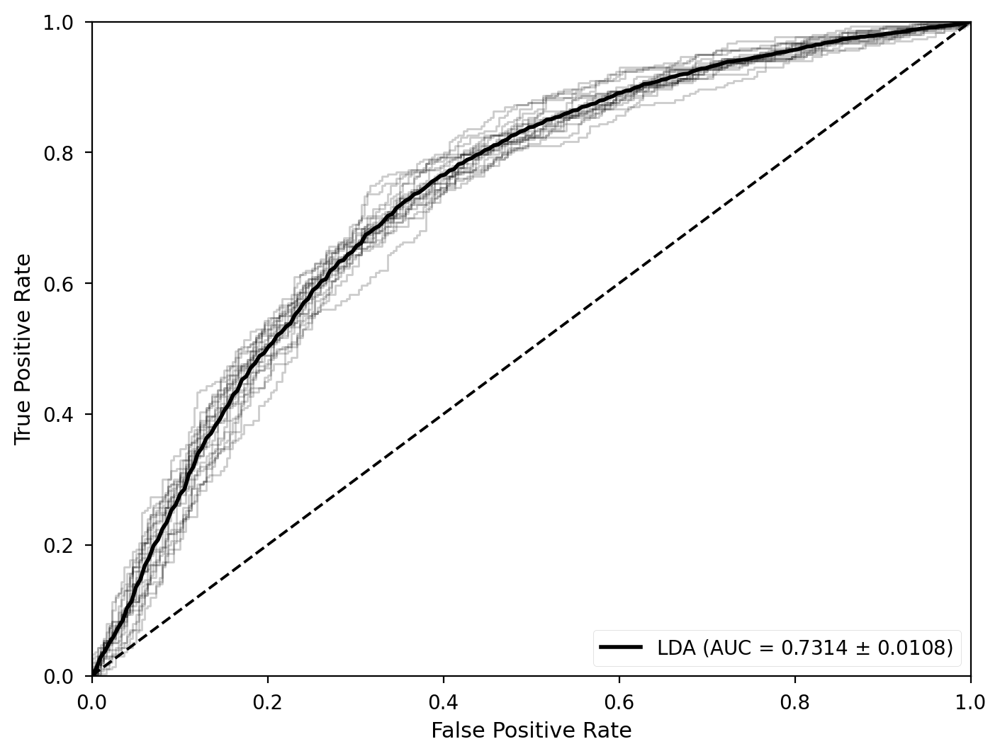

In [13]:
fig, ax = plt.subplots()
roc, auc = plot_roc_curve(conf_score_df, y, name, ax=ax)

ax.set_xlabel(f"False Positive Rate")
ax.set_ylabel(f"True Positive Rate")
ax.legend(loc="lower right")

rocs[name] = roc
aucs[name] = auc

## PCA-LDA
### Overview

In [15]:
current_path = results_path / "lda_dim_reduction/pca_lda/"
name = "PCA-LDA"

ct_df = pd.read_csv(current_path / "ct_results.csv")

accs[name] = ct_df.test_accuracy
f1_scores[name] = ct_df.test_f1
fit_times[name] = ct_df.fit_time
predict_times[name] = ct_df.predict_time
p_vals[name] = ct_df.p_value

ct_df.describe()

,train_roc_auc,test_roc_auc,train_accuracy,test_accuracy,train_f1,test_f1,fit_time,predict_time,p_value
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,2.000000e+01
mean,0.958504,0.943750,0.883833,0.864000,0.885411,0.865631,3.068046,0.009092,4.599636e-34
std,0.001519,0.004314,0.004242,0.006933,0.004131,0.007007,0.078677,0.001299,8.667799e-34
min,0.955531,0.936222,0.872083,0.851667,0.874380,0.852257,2.952521,0.007480,1.082349e-37
25%,0.957878,0.941694,0.882812,0.859583,0.884591,0.861926,3.006006,0.008487,4.515219e-36
50%,0.958510,0.943528,0.883958,0.865000,0.885654,0.865303,3.057002,0.008625,3.388190e-35
75%,0.959141,0.946903,0.885000,0.866667,0.886395,0.869514,3.133500,0.009461,3.040278e-34
max,0.962694,0.951889,0.892083,0.876667,0.893857,0.878561,3.230056,0.012986,2.742276e-33


### Validation Curve

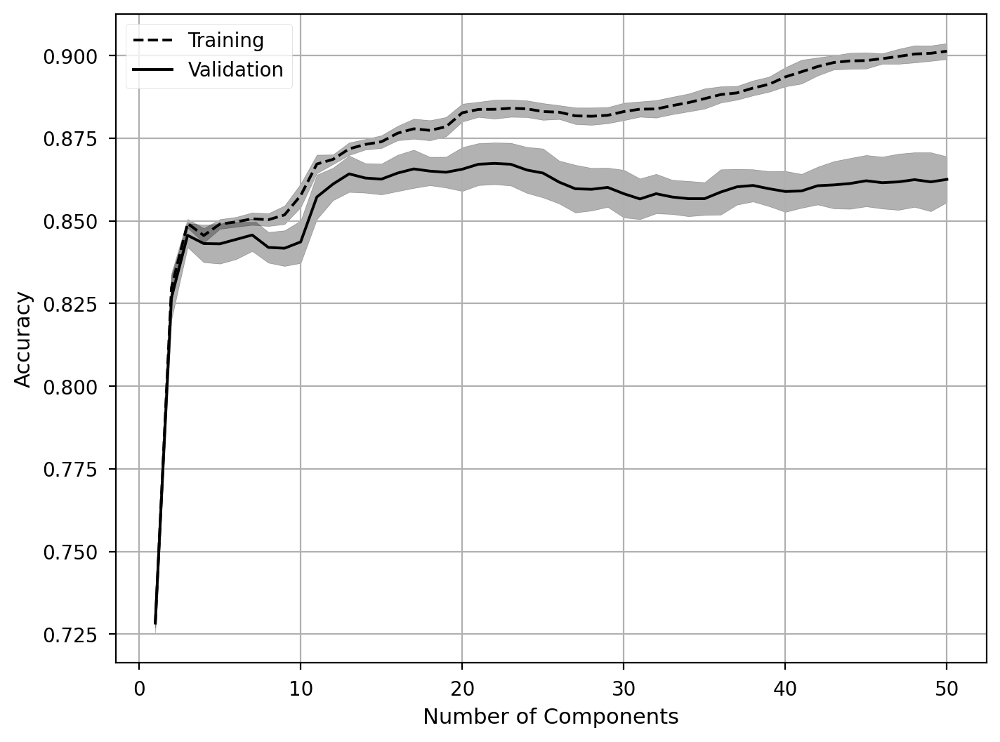

In [16]:
cv_df = pd.read_csv(current_path / "cv_results.csv")

fig, ax = plt.subplots()
plot_validation_curve(cv_df, ax=ax)

ax.set_xlabel("Number of Components")
ax.set_ylabel("Accuracy")
ax.grid()
ax.legend(loc="upper left")

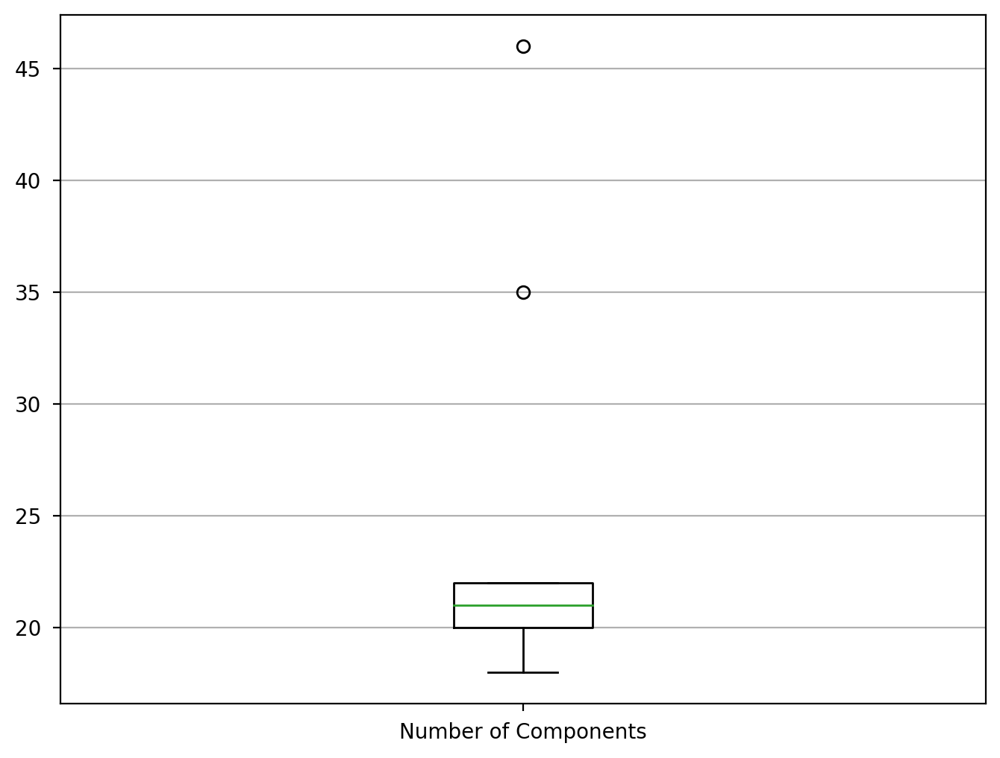

In [17]:
param_df = pd.read_csv(current_path / "param_results.csv")

fig, ax = plt.subplots()
param_df.boxplot(ax=ax, grid=False, boxprops={"color":"k"}, whiskerprops={"color":"k"})
ax.set_xticklabels(["Number of Components"])
ax.grid(axis="y")

### Confidence scores by class

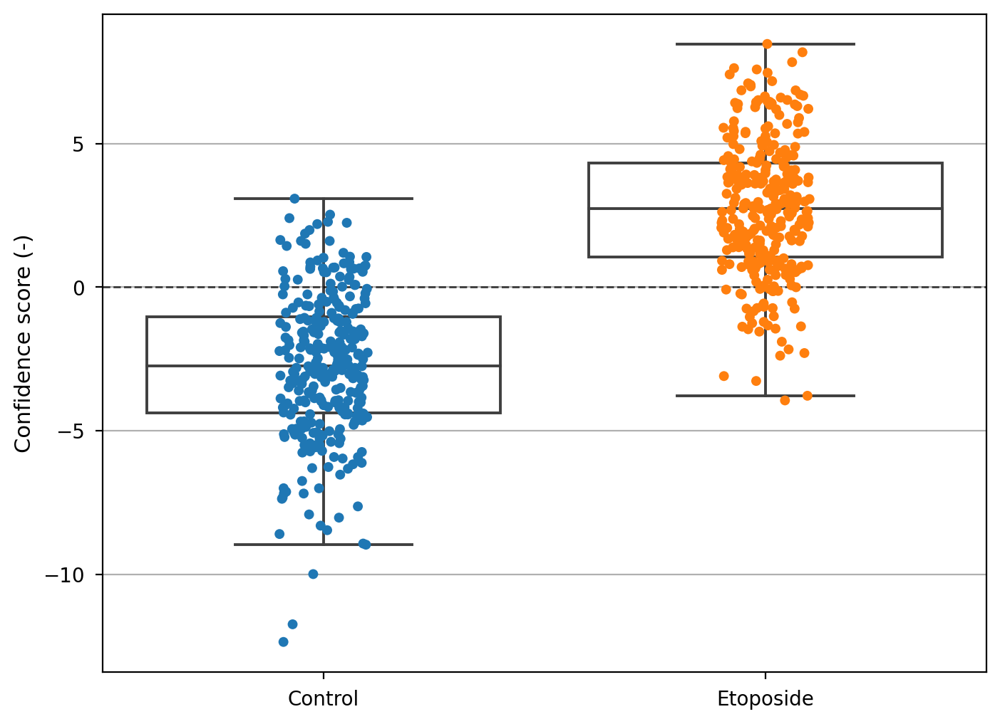

In [18]:
conf_score_df = pd.read_csv(current_path / "confidence_scores.csv", header=None)

fig, ax = plt.subplots()
plot_confidence_scores(conf_score_df, y_key[y], y_key, ax=ax)
ax.axhline(0, color="k", linestyle="--", linewidth=1, alpha=0.7)
ax.set_ylabel("Confidence score (-)")
ax.grid(axis="y")

### Model coefficients

Positive: Higher in Treated

Negative: Higher in Control

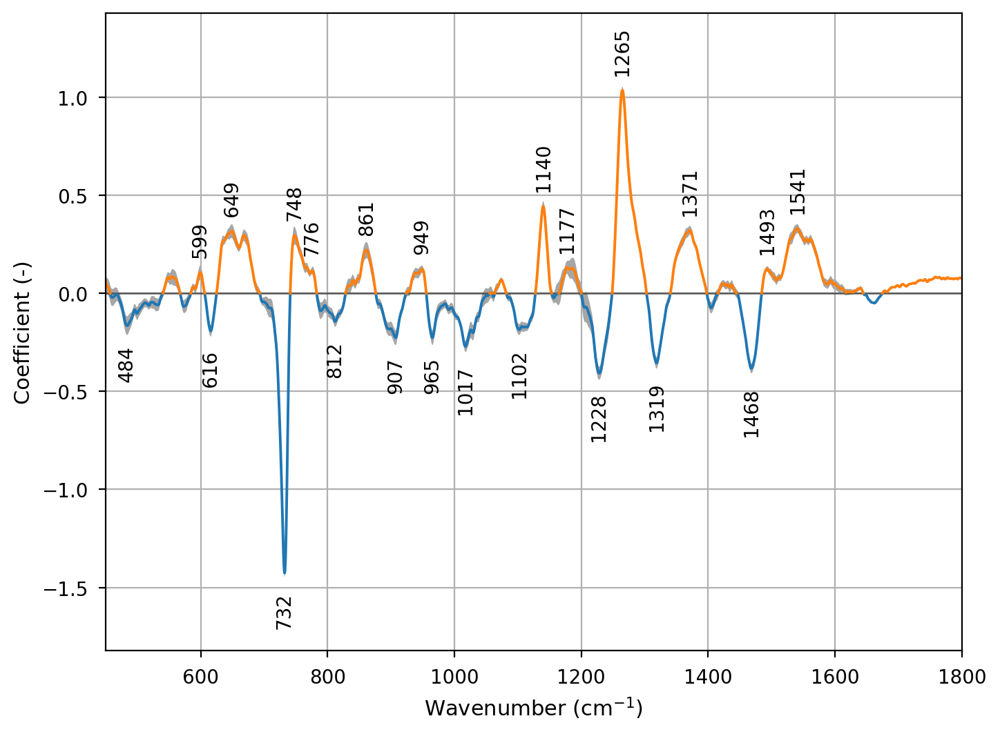

In [19]:
coef_df = pd.read_csv(current_path / "coefficients.csv")

fig, ax = plt.subplots()
plot_coefs(coef_df, ax=ax, show_range=True, annotate=True, annot_kw={"min_height": 0.1, 
                                                                     "min_dist": 50,
                                                                     "offset": 10})

ax.set_xlabel("Wavenumber ($\mathregular{cm^{-1}}$)")
ax.set_ylabel("Coefficient (-)")
ax.margins(x=0, y=0.15)
ax.grid()

### Confusion Matrix

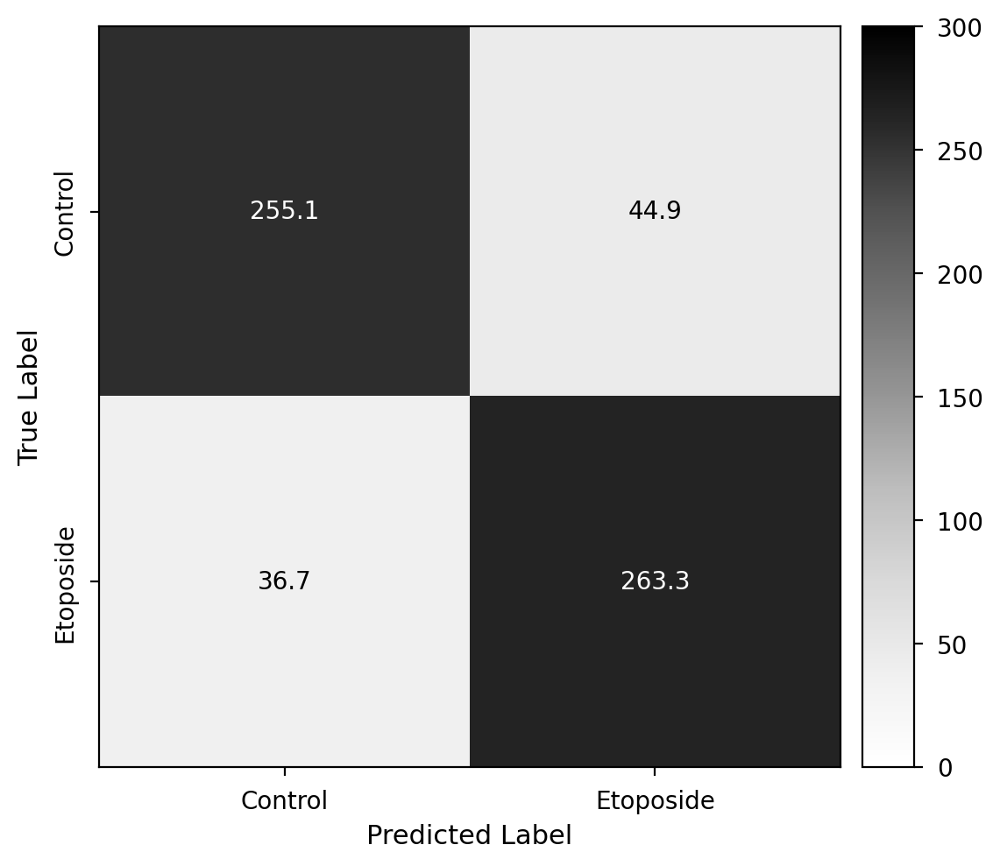

In [20]:
pred_df = pd.read_csv(current_path / "predictions.csv", header=None)

fig, ax = plt.subplots(figsize=(6,6))
plot_confusion_matrix(pred_df, y, labels=y_key, ax=ax, cmap="Greys", colorbar=True)

### ROC Curve

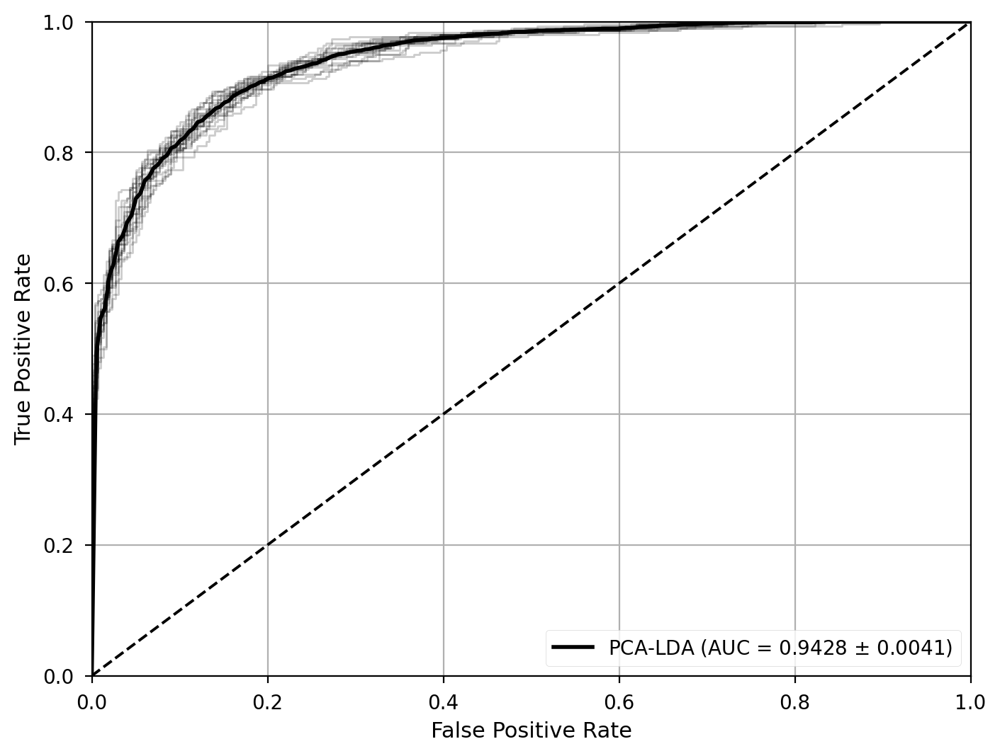

In [21]:
fig, ax = plt.subplots()
roc, auc = plot_roc_curve(conf_score_df, y, name, ax=ax)

ax.set_xlabel(f"False Positive Rate")
ax.set_ylabel(f"True Positive Rate")
ax.legend(loc="lower right")
ax.grid()

rocs[name] = roc
aucs[name] = auc

## NMF-LDA
### Overview

In [24]:
current_path = results_path / "lda_dim_reduction/nmf_lda/"
name = "NMF-LDA"

ct_df = pd.read_csv(current_path / "ct_results.csv")

accs[name] = ct_df.test_accuracy
f1_scores[name] = ct_df.test_f1
fit_times[name] = ct_df.fit_time
predict_times[name] = ct_df.predict_time
p_vals[name] = ct_df.p_value

ct_df.describe()

,train_roc_auc,test_roc_auc,train_accuracy,test_accuracy,train_f1,test_f1,fit_time,predict_time,p_value
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,2.000000e+01
mean,0.955167,0.939167,0.879021,0.856750,0.880264,0.857834,12.093276,0.025071,3.738566e-32
std,0.002027,0.004333,0.003725,0.007143,0.003859,0.007054,0.169331,0.002895,1.339362e-31
min,0.951715,0.932889,0.871250,0.841667,0.872823,0.844250,11.803254,0.020784,2.548664e-37
25%,0.953620,0.935611,0.876667,0.852917,0.877633,0.851566,11.960612,0.023636,5.879243e-35
50%,0.955071,0.939806,0.878542,0.857500,0.879903,0.858099,12.107325,0.024685,4.248232e-34
75%,0.957034,0.941319,0.880833,0.862083,0.882699,0.863839,12.196864,0.025609,1.223887e-33
max,0.958104,0.948056,0.885833,0.870000,0.887042,0.872084,12.401184,0.033931,6.001637e-31


### Validation Curve

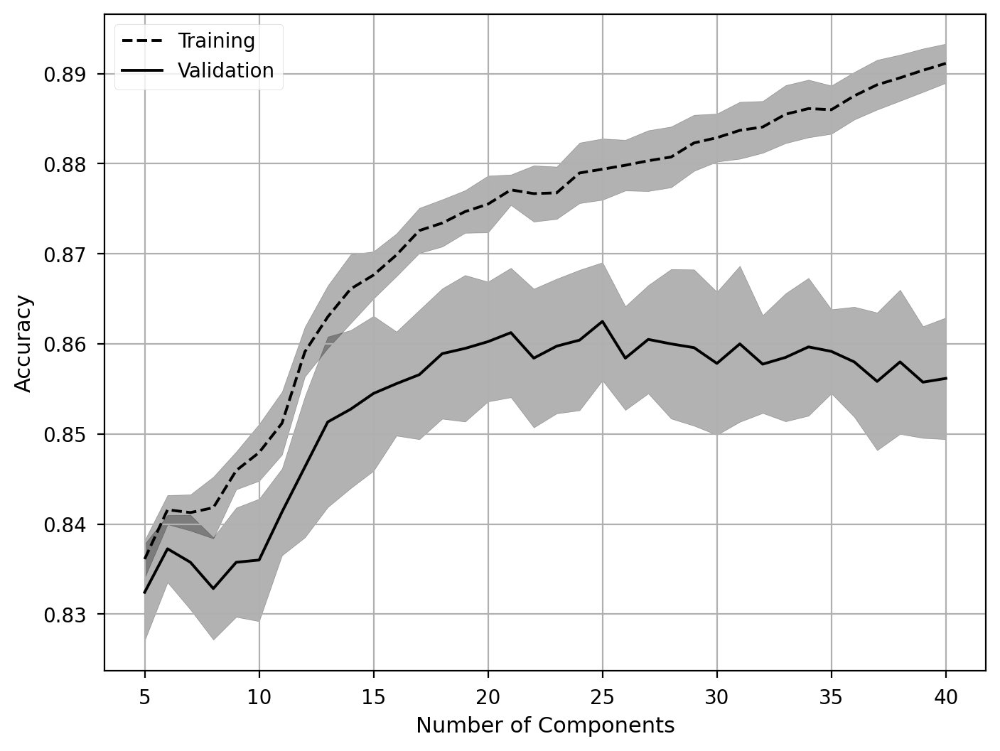

In [25]:
cv_df = pd.read_csv(current_path / "cv_results.csv")

fig, ax = plt.subplots()
plot_validation_curve(cv_df, ax=ax)

ax.set_xlabel("Number of Components")
ax.set_ylabel("Accuracy")
ax.grid()
ax.legend(loc="upper left")

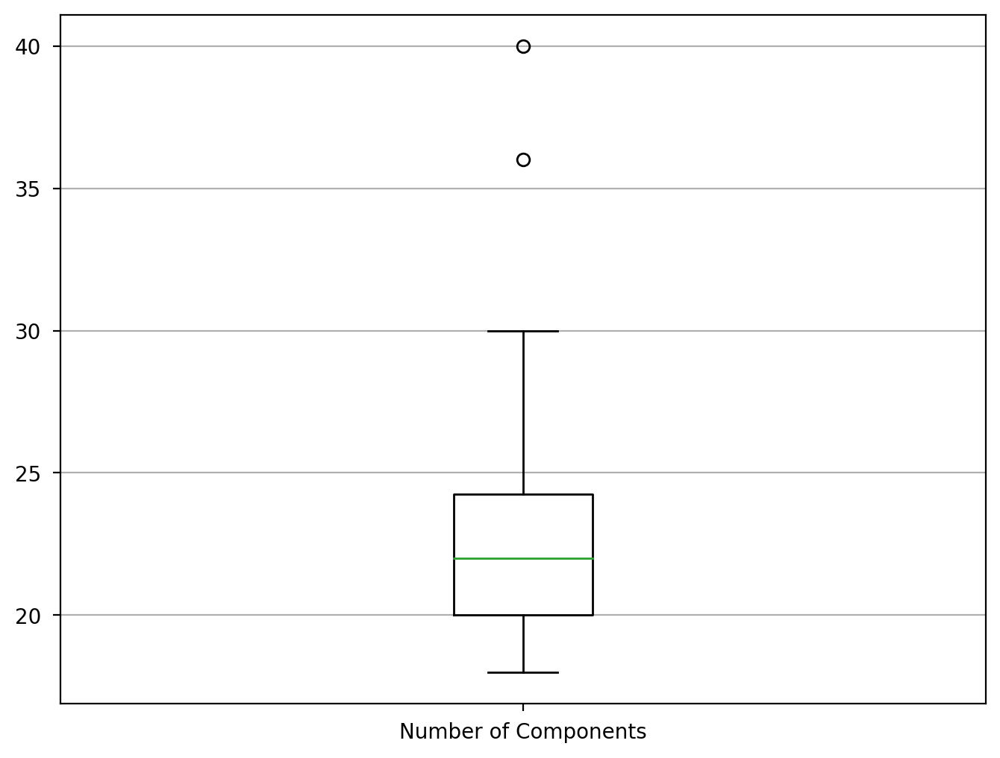

In [26]:
param_df = pd.read_csv(current_path / "param_results.csv")

fig, ax = plt.subplots()
param_df.boxplot(ax=ax, grid=False, boxprops={"color":"k"}, whiskerprops={"color":"k"})
ax.set_xticklabels(["Number of Components"])
ax.grid(axis="y")

### Confidence scores by class

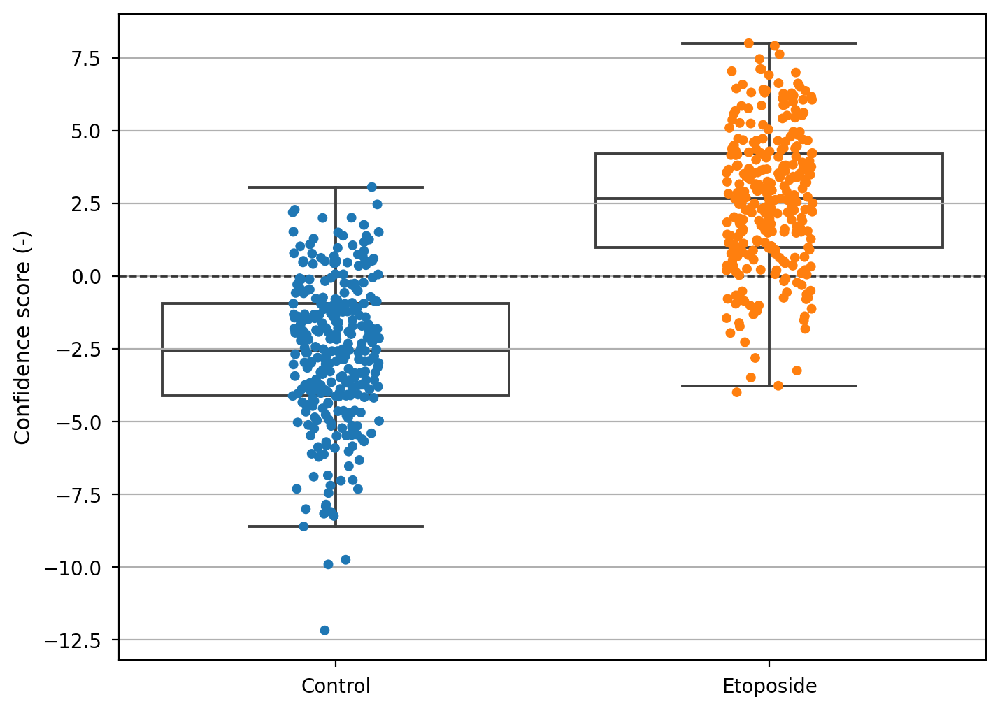

In [27]:
conf_score_df = pd.read_csv(current_path / "confidence_scores.csv", header=None)

fig, ax = plt.subplots()
plot_confidence_scores(conf_score_df, y_key[y], y_key, ax=ax)
ax.axhline(0, color="k", linestyle="--", linewidth=1, alpha=0.7)
ax.set_ylabel("Confidence score (-)")
ax.grid(axis="y")

### Model coefficients

Positive: Higher in Treated

Negative: Higher in Control

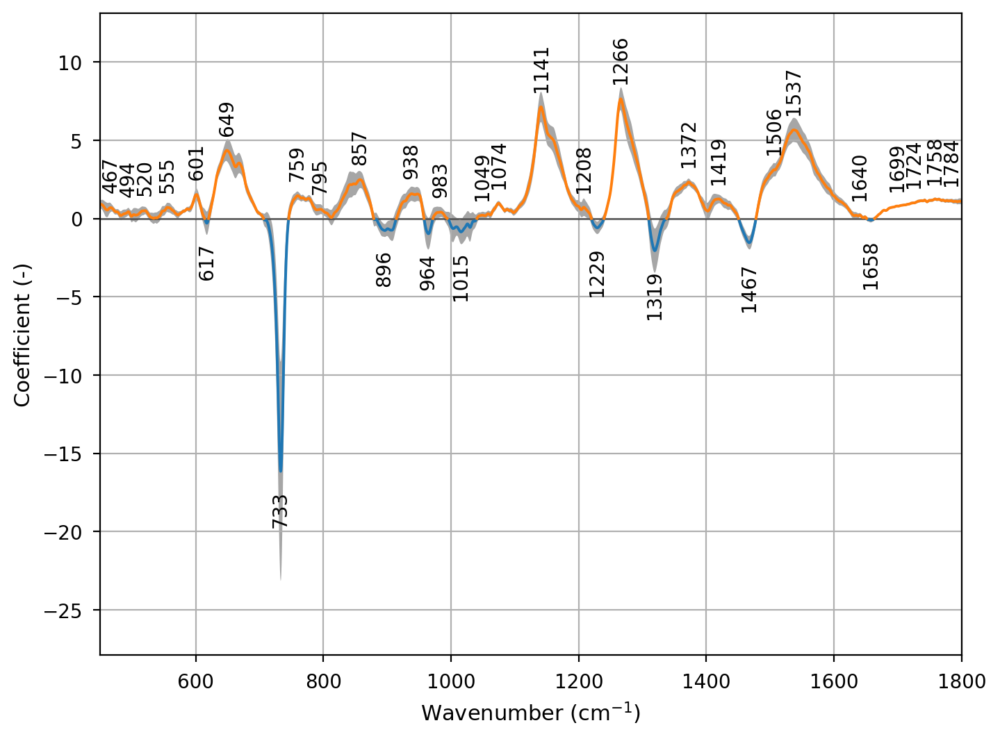

In [28]:
coef_df = pd.read_csv(current_path / "coefficients.csv")

fig, ax = plt.subplots()
plot_coefs(coef_df, ax=ax, show_range=True, annotate=True, annot_kw={"min_height": 0.1, 
                                                                     "min_dist": 50,
                                                                     "offset": 10})

ax.set_xlabel("Wavenumber ($\mathregular{cm^{-1}}$)")
ax.set_ylabel("Coefficient (-)")
ax.margins(x=0, y=0.15)
ax.grid()

### Confusion Matrix

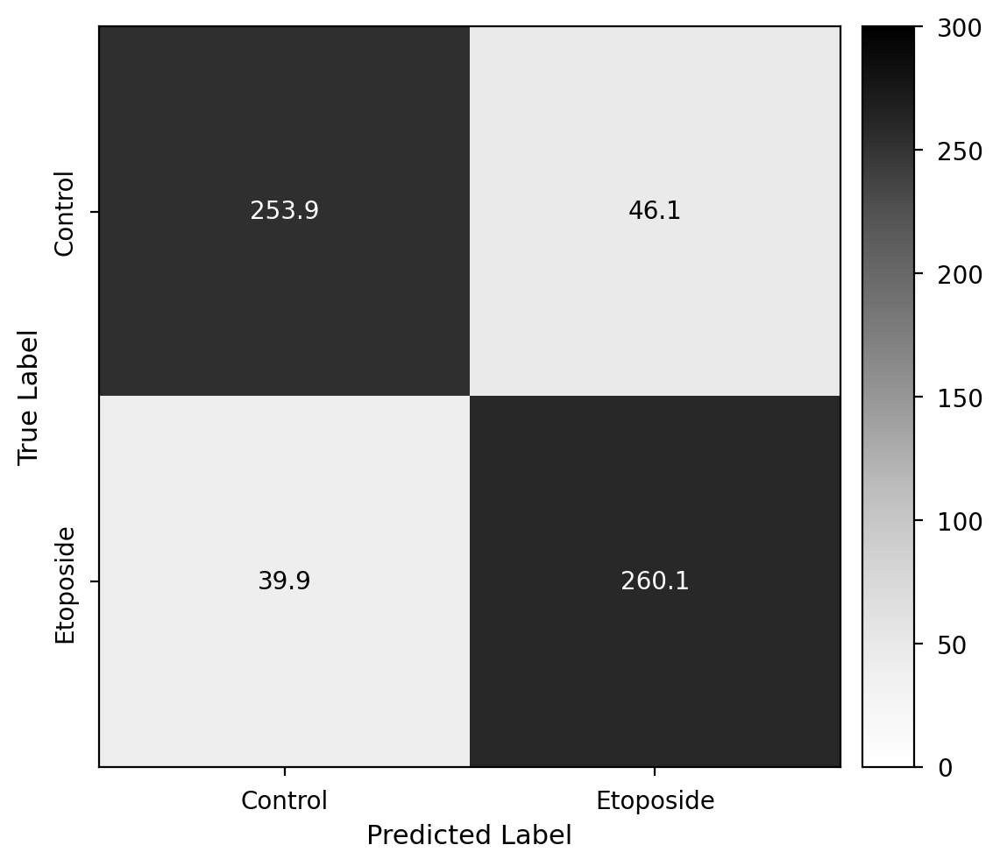

In [29]:
pred_df = pd.read_csv(current_path / "predictions.csv", header=None)

fig, ax = plt.subplots(figsize=(6,6))
plot_confusion_matrix(pred_df, y, labels=y_key, ax=ax, cmap="Greys", colorbar=True)

### ROC Curve

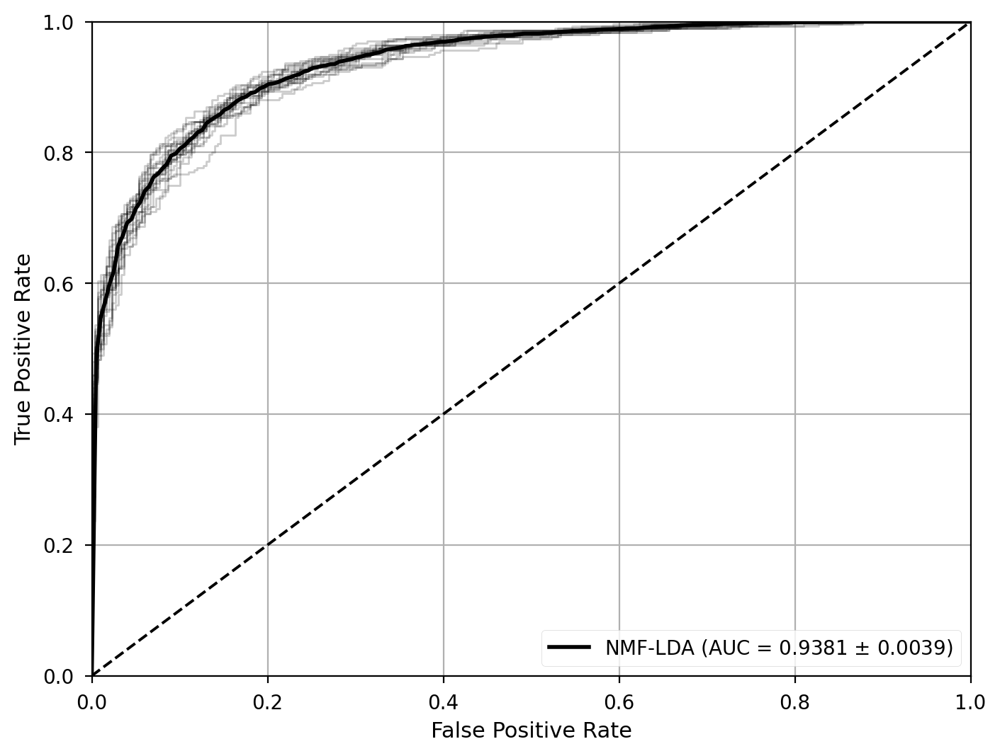

In [30]:
fig, ax = plt.subplots()
roc, auc = plot_roc_curve(conf_score_df, y, name, ax=ax)

ax.set_xlabel(f"False Positive Rate")
ax.set_ylabel(f"True Positive Rate")
ax.legend(loc="lower right")
ax.grid()

rocs[name] = roc
aucs[name] = auc

## Feature Agglomeration (FA) - LDA
### Overview

In [33]:
current_path = results_path / "lda_dim_reduction/fa_lda/"
name = "FA-LDA"

ct_df = pd.read_csv(current_path / "ct_results.csv")

accs[name] = ct_df.test_accuracy
f1_scores[name] = ct_df.test_f1
fit_times[name] = ct_df.fit_time
predict_times[name] = ct_df.predict_time
p_vals[name] = ct_df.p_value

ct_df.describe()

,train_roc_auc,test_roc_auc,train_accuracy,test_accuracy,train_f1,test_f1,fit_time,predict_time,p_value
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,2.000000e+01
mean,0.954965,0.939114,0.878000,0.853583,0.878041,0.853335,7.274664,0.006732,3.526733e-33
std,0.002048,0.004310,0.003984,0.006172,0.004251,0.006979,0.061287,0.000514,9.288801e-33
min,0.950712,0.931000,0.869583,0.840000,0.868957,0.834675,7.168701,0.006219,8.648341e-37
25%,0.953514,0.935250,0.875625,0.851250,0.875823,0.850005,7.230324,0.006373,1.129991e-34
50%,0.954606,0.939333,0.877917,0.853333,0.877688,0.854416,7.266884,0.006493,5.286661e-34
75%,0.957006,0.942736,0.880729,0.855000,0.880851,0.855687,7.310951,0.007022,1.900321e-33
max,0.957781,0.945556,0.884167,0.871667,0.884909,0.872418,7.394592,0.007879,4.145961e-32


### Validation Curve

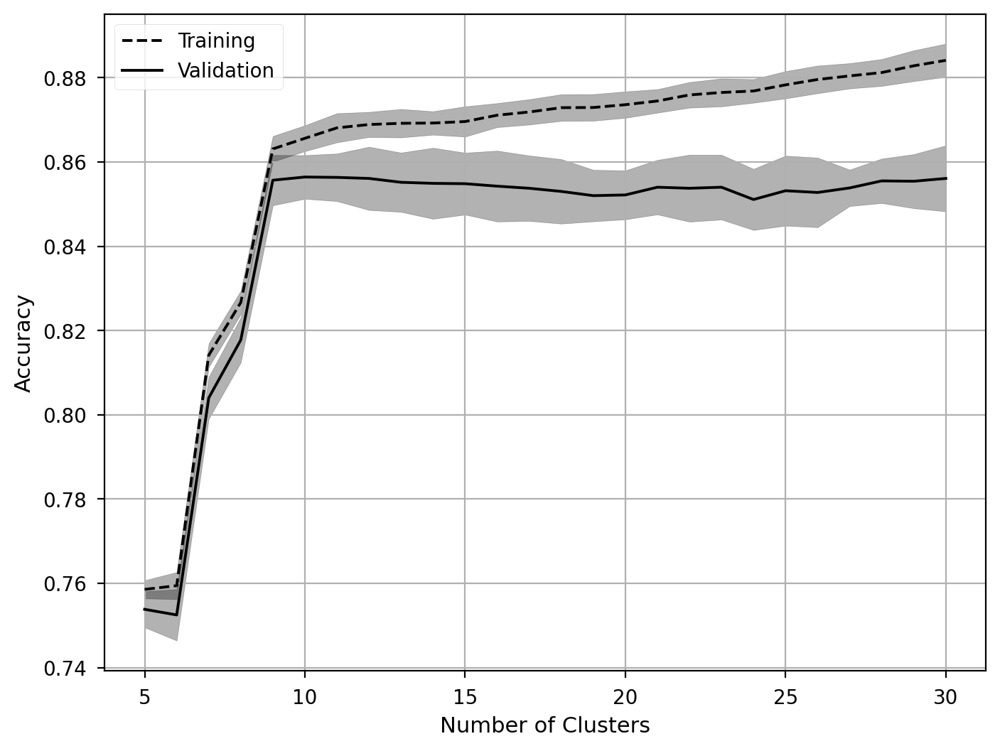

In [34]:
cv_df = pd.read_csv(current_path / "cv_results.csv")

fig, ax = plt.subplots()
plot_validation_curve(cv_df, ax=ax)

ax.set_xlabel("Number of Clusters")
ax.set_ylabel("Accuracy")
ax.grid()
ax.legend(loc="upper left")

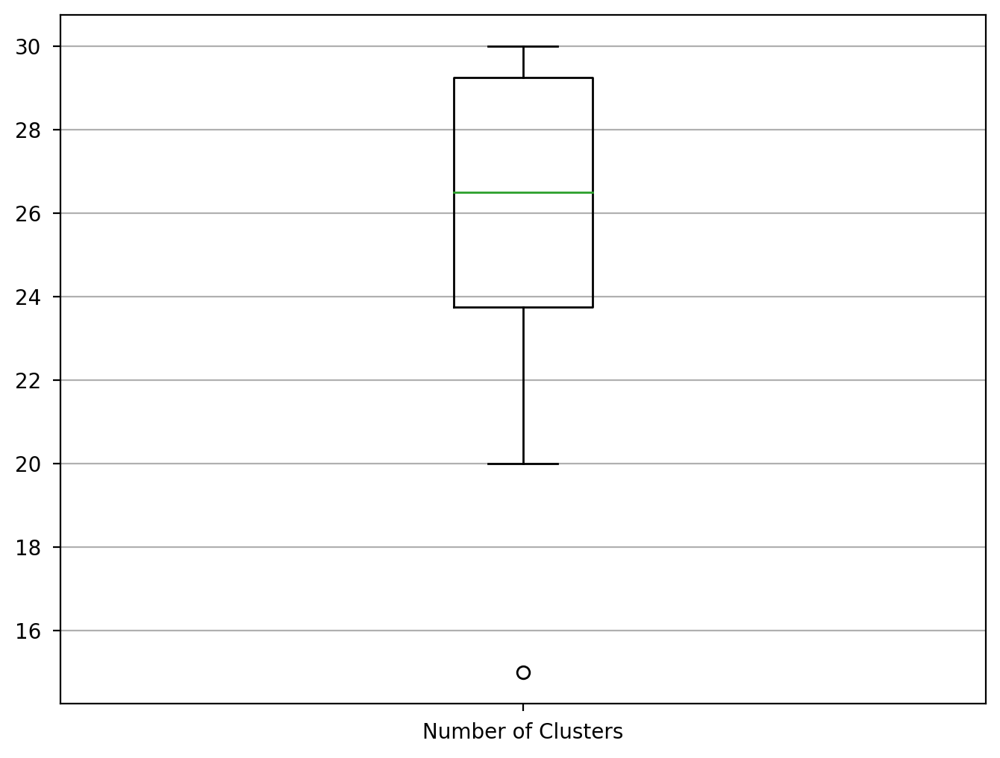

In [35]:
param_df = pd.read_csv(current_path / "param_results.csv")

fig, ax = plt.subplots()
param_df.boxplot(ax=ax, grid=False, boxprops={"color":"k"}, whiskerprops={"color":"k"})
ax.set_xticklabels(["Number of Clusters"])
ax.grid(axis="y")

### Confidence scores by class

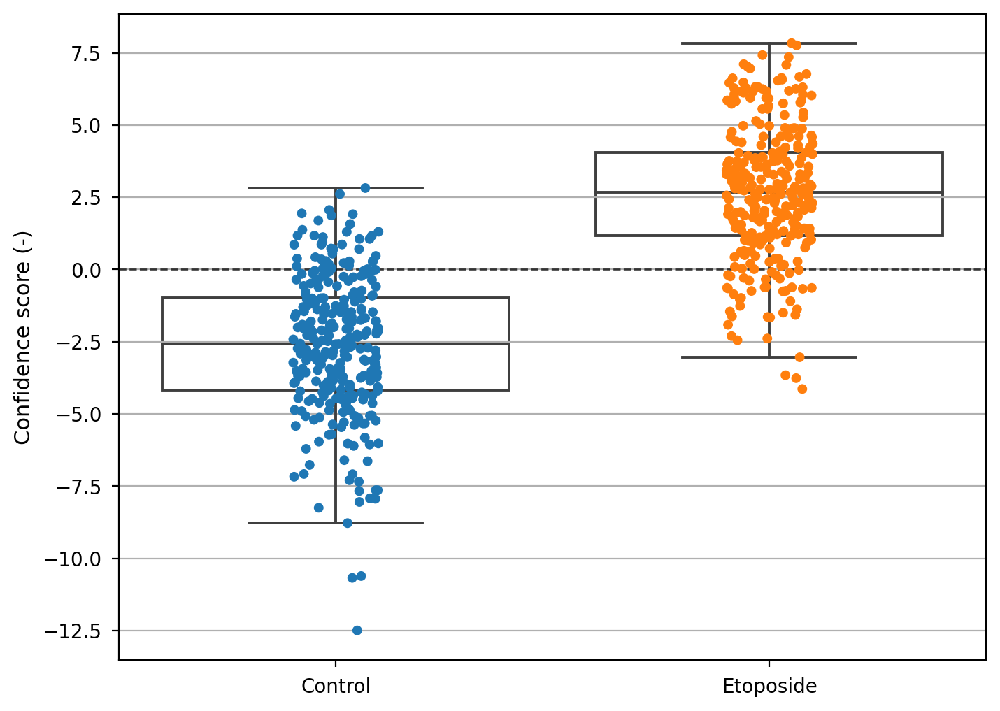

In [36]:
conf_score_df = pd.read_csv(current_path / "confidence_scores.csv", header=None)

fig, ax = plt.subplots()
plot_confidence_scores(conf_score_df, y_key[y], y_key, ax=ax)
ax.axhline(0, color="k", linestyle="--", linewidth=1, alpha=0.7)
ax.set_ylabel("Confidence score (-)")
ax.grid(axis="y")

### Model coefficients

Positive: Higher in Treated

Negative: Higher in Control

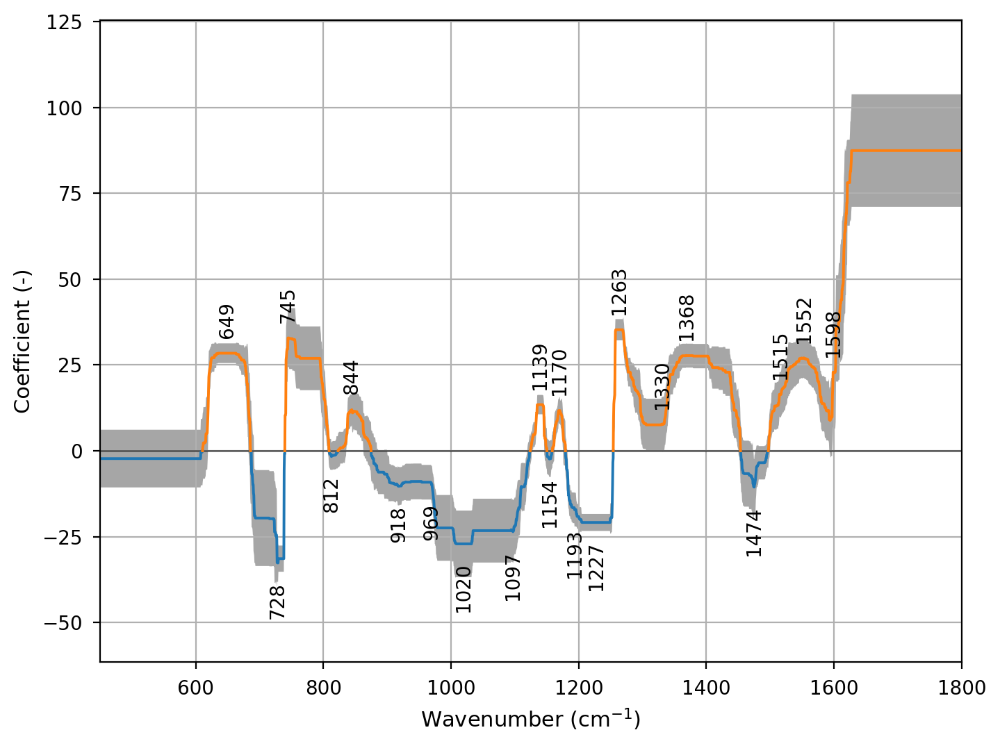

In [37]:
coef_df = pd.read_csv(current_path / "coefficients.csv")

fig, ax = plt.subplots()
plot_coefs(coef_df, ax=ax, show_range=True, annotate=True, annot_kw={"min_height": 0.1, 
                                                                     "min_dist": 50,
                                                                     "offset": 10})

ax.set_xlabel("Wavenumber ($\mathregular{cm^{-1}}$)")
ax.set_ylabel("Coefficient (-)")
ax.margins(x=0, y=0.15)
ax.grid()

### Confusion Matrix

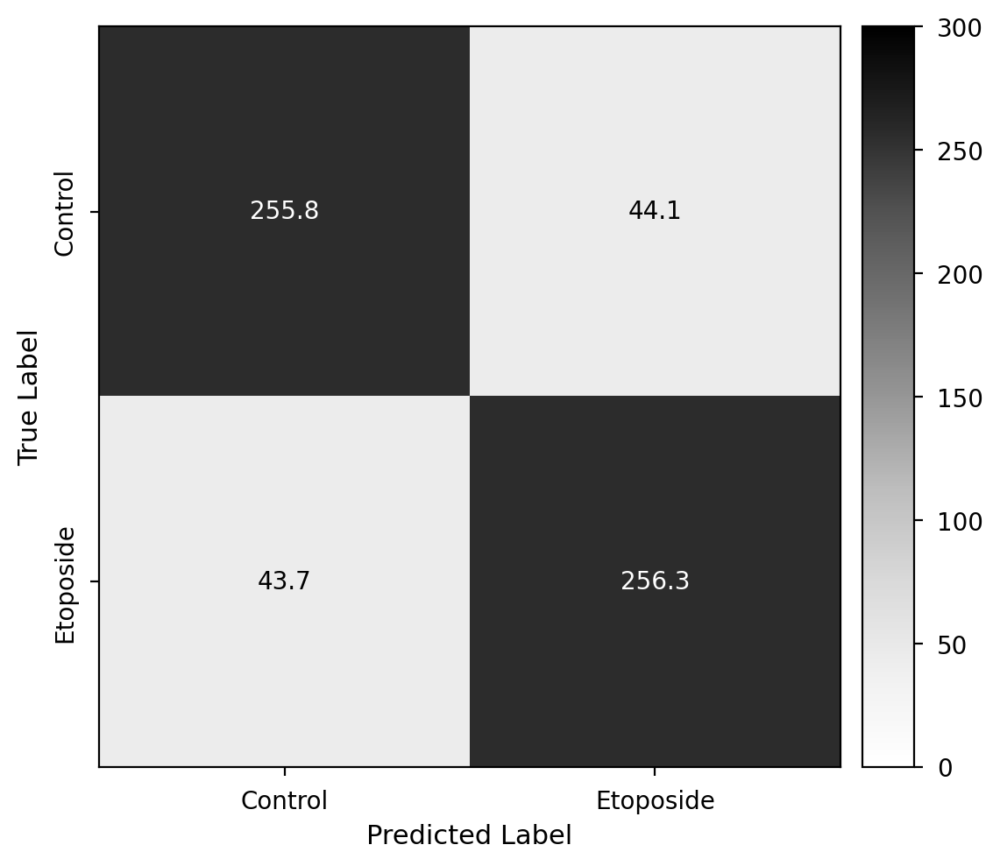

In [38]:
pred_df = pd.read_csv(current_path / "predictions.csv", header=None)

fig, ax = plt.subplots(figsize=(6,6))
plot_confusion_matrix(pred_df, y, labels=y_key, ax=ax, cmap="Greys", colorbar=True)

### ROC Curve

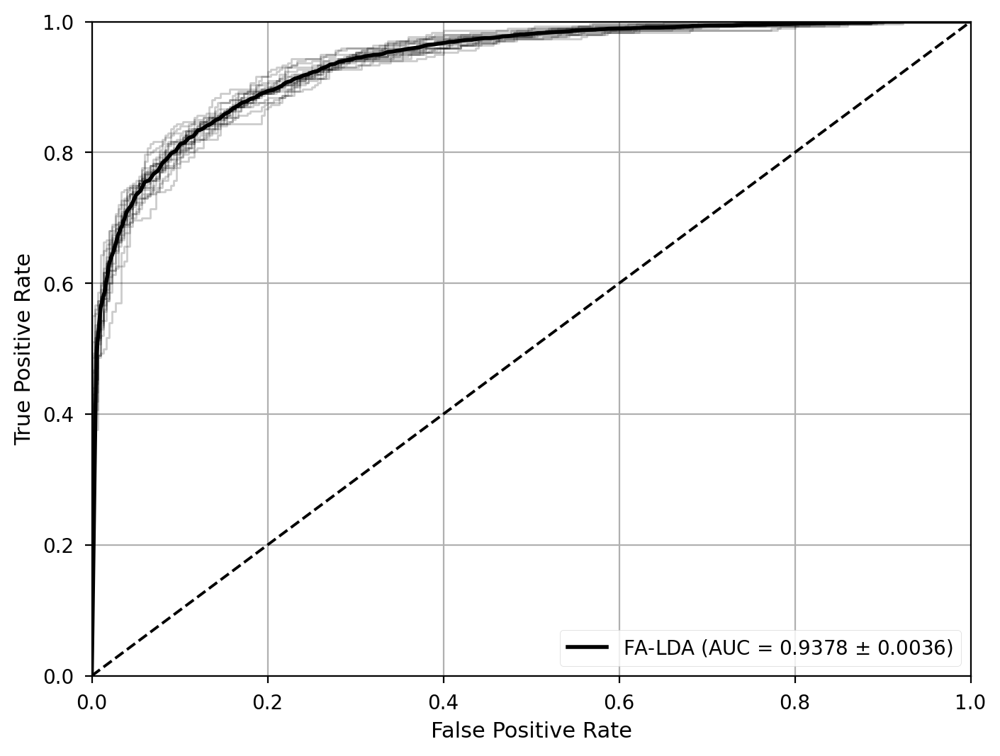

In [39]:
fig, ax = plt.subplots()
roc, auc = plot_roc_curve(conf_score_df, y, name, ax=ax)

ax.set_xlabel(f"False Positive Rate")
ax.set_ylabel(f"True Positive Rate")
ax.legend(loc="lower right")
ax.grid()

rocs[name] = roc
aucs[name] = auc

## Peak-LDA
### Overview

In [42]:
current_path = results_path / "lda_dim_reduction/peak_lda/"
name = "Peak-LDA"

ct_df = pd.read_csv(current_path / "ct_results.csv")

accs[name] = ct_df.test_accuracy
f1_scores[name] = ct_df.test_f1
fit_times[name] = ct_df.fit_time
predict_times[name] = ct_df.predict_time
p_vals[name] = ct_df.p_value

ct_df.describe()

,train_roc_auc,test_roc_auc,train_accuracy,test_accuracy,train_f1,test_f1,fit_time,predict_time,p_value
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,2.000000e+01
mean,0.949157,0.940953,0.874625,0.861333,0.873775,0.859979,0.478568,0.002835,7.318471e-35
std,0.000667,0.002043,0.002467,0.007021,0.002584,0.006862,0.016017,0.000317,2.210979e-34
min,0.947833,0.937833,0.870417,0.851667,0.869000,0.851259,0.458444,0.002480,4.042070e-40
25%,0.948589,0.939361,0.872917,0.855000,0.872300,0.853882,0.463390,0.002604,5.217185e-37
50%,0.949207,0.940528,0.873750,0.860833,0.872731,0.858619,0.476701,0.002822,1.126428e-35
75%,0.949541,0.941875,0.876354,0.865417,0.875483,0.864094,0.490428,0.002924,3.972092e-35
max,0.950417,0.945222,0.879583,0.876667,0.878938,0.873752,0.518173,0.003760,1.003444e-33


### Validation Curve

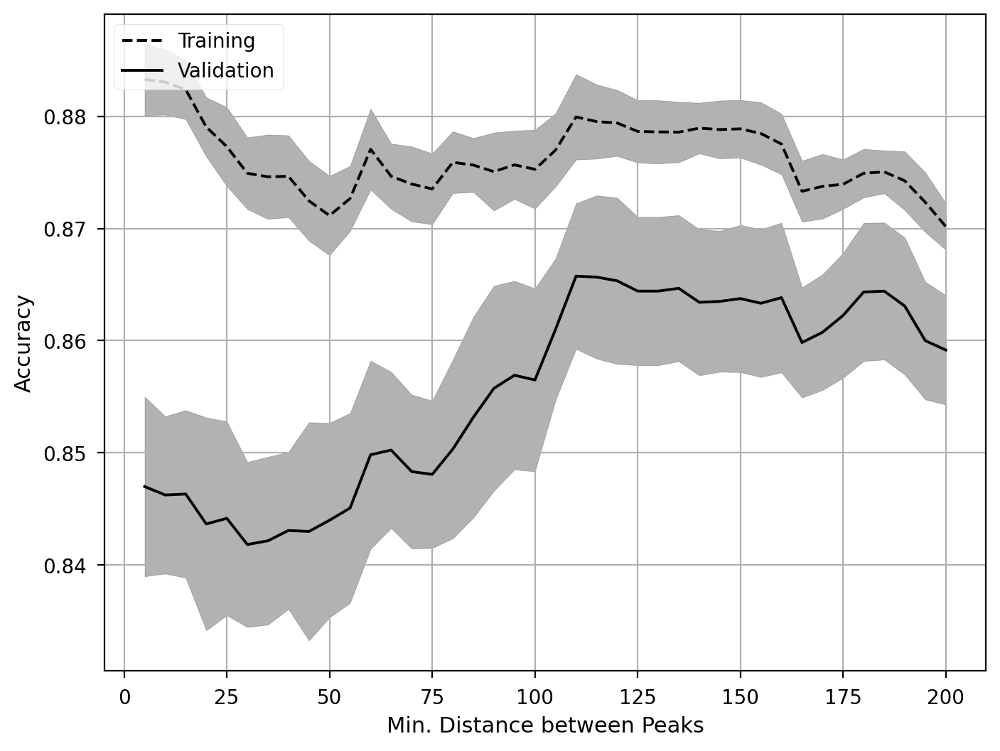

In [43]:
cv_df = pd.read_csv(current_path / "cv_results.csv")

fig, ax = plt.subplots()
plot_validation_curve(cv_df, ax=ax)

ax.set_xlabel("Min. Distance between Peaks")
ax.set_ylabel("Accuracy")
ax.grid()
ax.legend(loc="upper left")

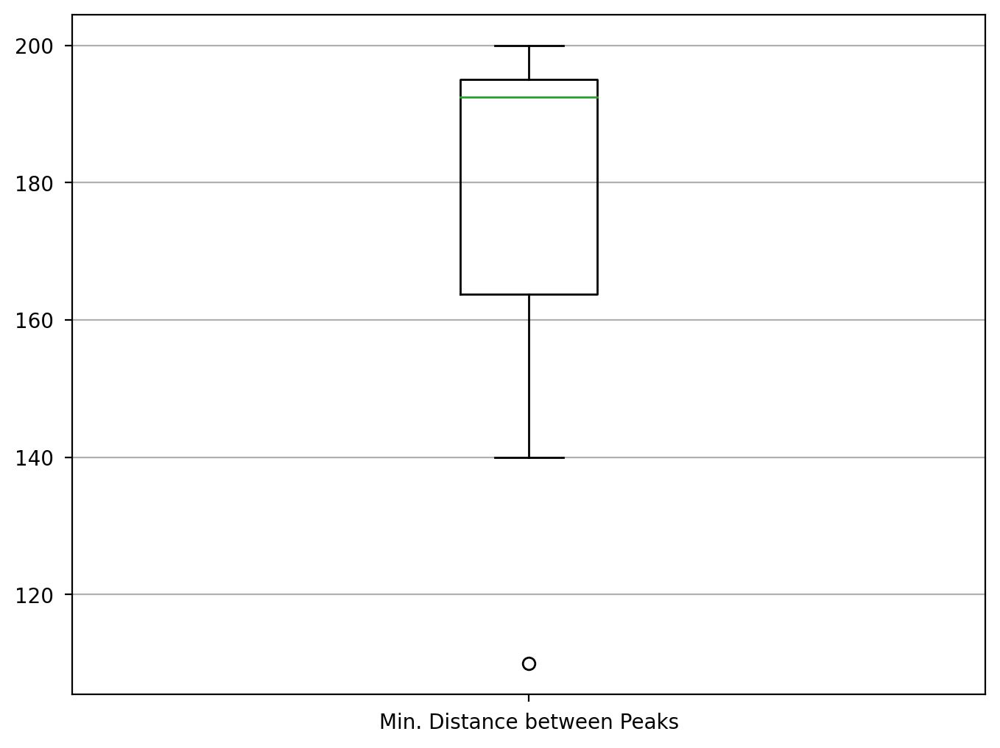

In [44]:
param_df = pd.read_csv(current_path / "param_results.csv")

fig, ax = plt.subplots()
param_df.boxplot(ax=ax, grid=False, boxprops={"color":"k"}, whiskerprops={"color":"k"})
ax.set_xticklabels(["Min. Distance between Peaks"])
ax.grid(axis="y")

### Confidence scores by class

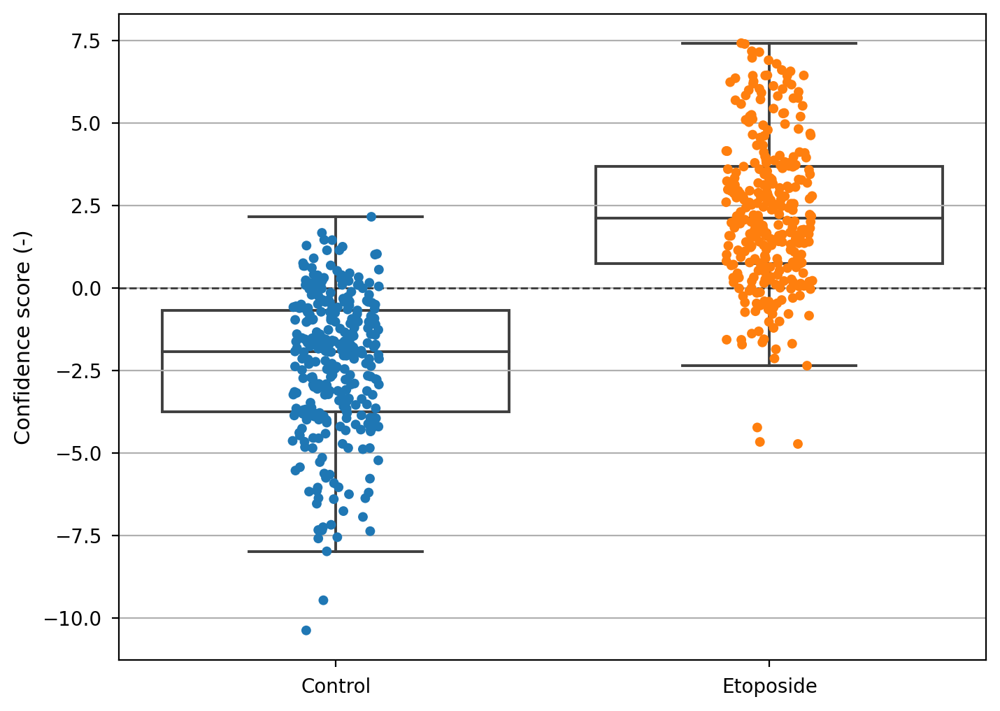

In [45]:
conf_score_df = pd.read_csv(current_path / "confidence_scores.csv", header=None)

fig, ax = plt.subplots()
plot_confidence_scores(conf_score_df, y_key[y], y_key, ax=ax)
ax.axhline(0, color="k", linestyle="--", linewidth=1, alpha=0.7)
ax.set_ylabel("Confidence score (-)")
ax.grid(axis="y")

### Model coefficients

Positive: Higher in Treated

Negative: Higher in Control

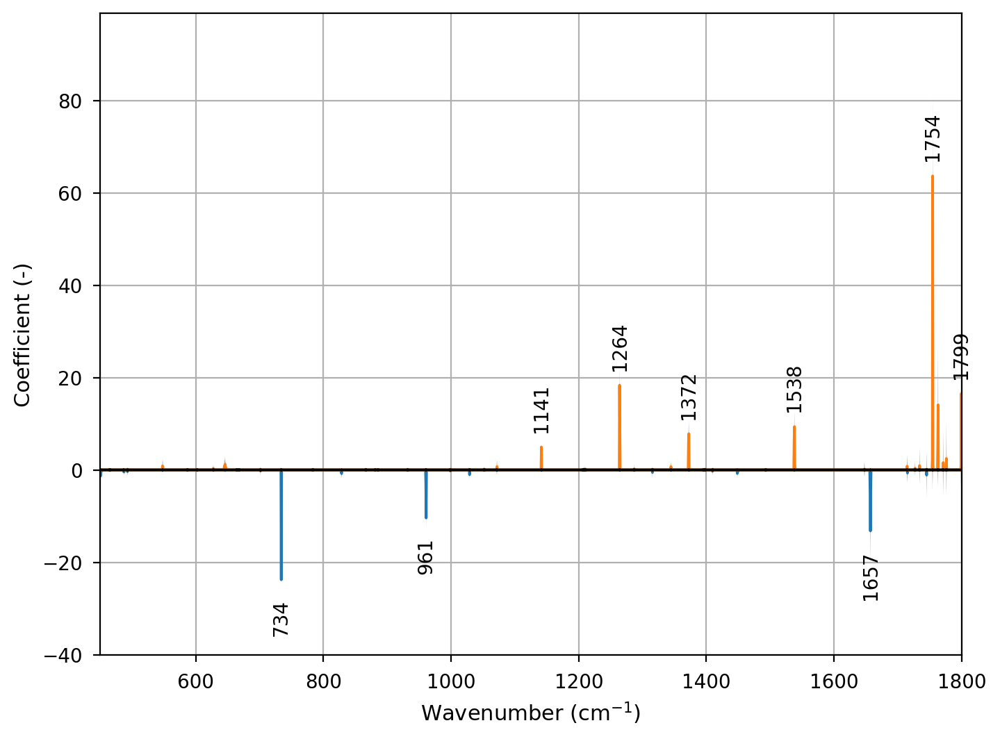

In [46]:
coef_df = pd.read_csv(current_path / "coefficients.csv")

fig, ax = plt.subplots()
plot_coefs(coef_df, ax=ax, show_range=True, annotate=True, annot_kw={"min_height": 3, 
                                                                     "min_dist": 50,
                                                                     "offset": 10})

ax.set_xlabel("Wavenumber ($\mathregular{cm^{-1}}$)")
ax.set_ylabel("Coefficient (-)")
ax.margins(x=0, y=0.15)
ax.grid()

### Confusion Matrix

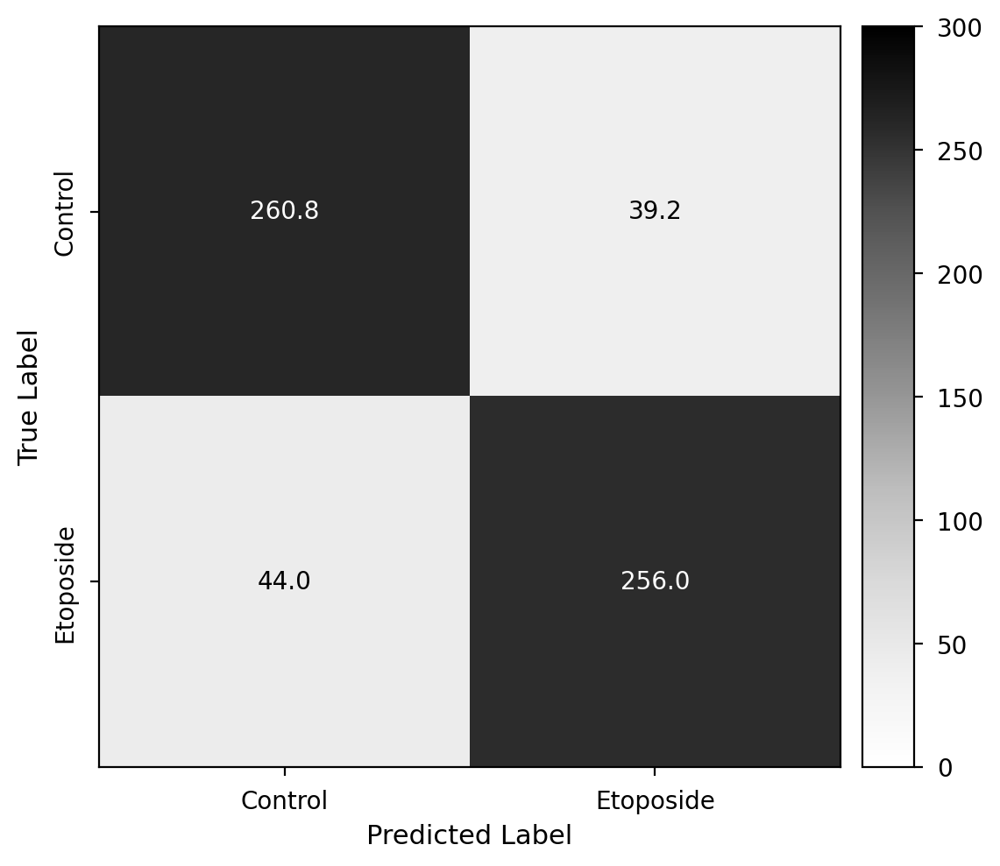

In [47]:
pred_df = pd.read_csv(current_path / "predictions.csv", header=None)

fig, ax = plt.subplots(figsize=(6,6))
plot_confusion_matrix(pred_df, y, labels=y_key, ax=ax, cmap="Greys", colorbar=True)

### ROC Curve

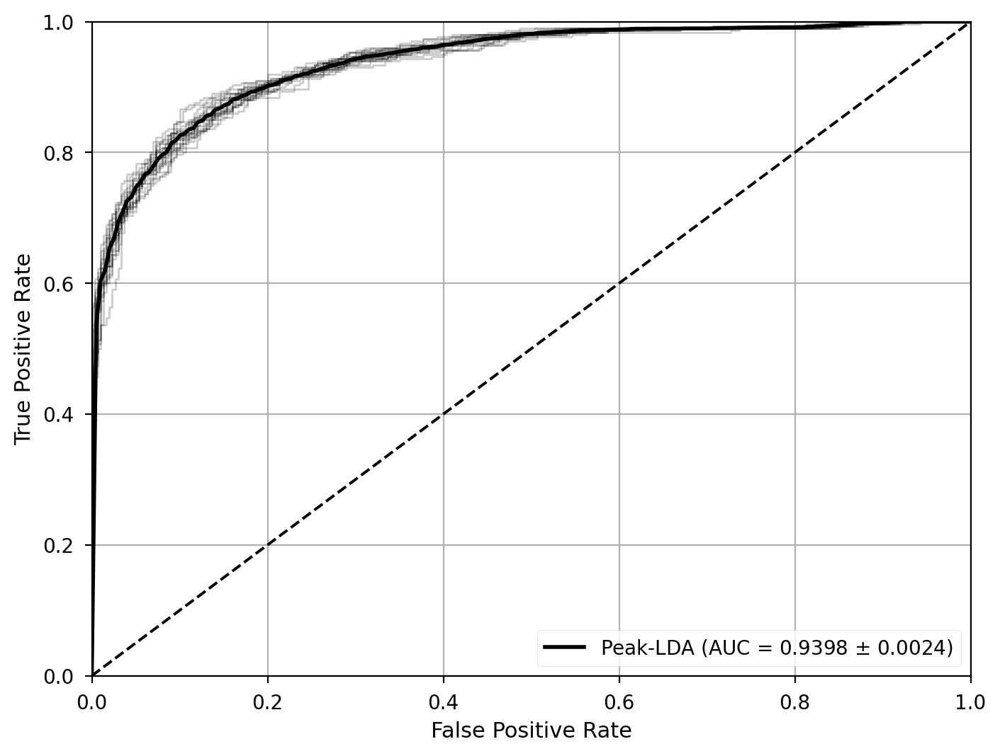

In [48]:
fig, ax = plt.subplots()
roc, auc = plot_roc_curve(conf_score_df, y, name, ax=ax)

ax.set_xlabel(f"False Positive Rate")
ax.set_ylabel(f"True Positive Rate")
ax.legend(loc="lower right")
ax.grid()

rocs[name] = roc
aucs[name] = auc

## Comparison of LDA with different dimensionality Reductions

Text(0, 0.5, 'Accuracy')

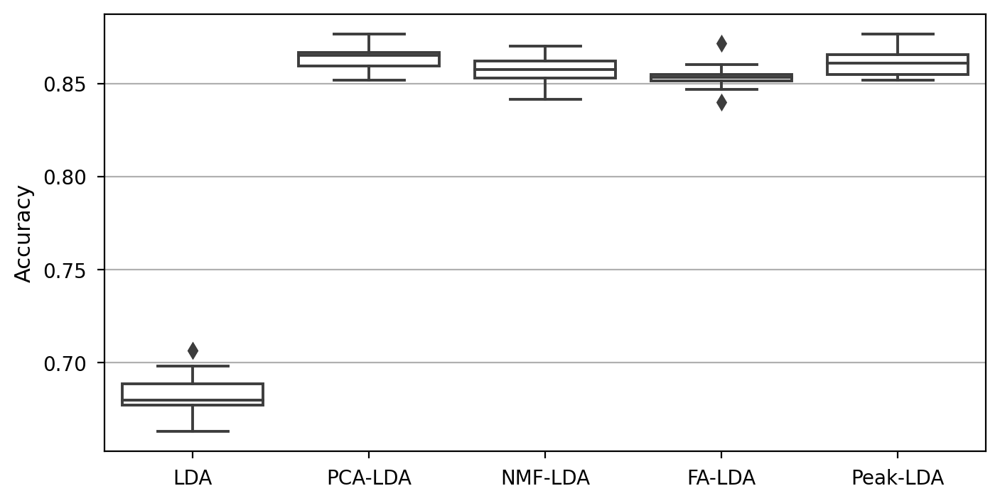

In [51]:
fig, ax = plt.subplots(figsize=(8,4))
boxplot_comparison(accs, regex="LDA")

ax.grid(axis="y")
ax.set_ylabel("Accuracy")

Text(0, 0.5, 'p-Value')

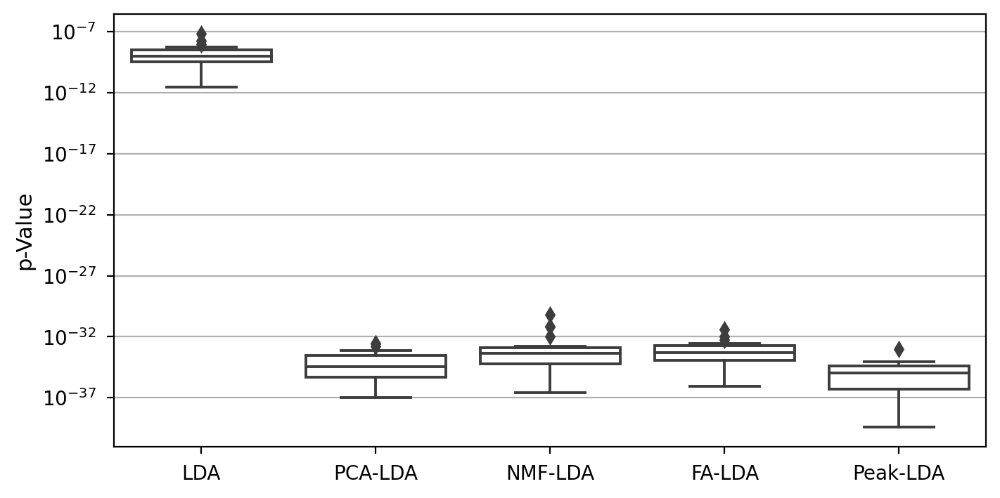

In [52]:
fig, ax = plt.subplots(figsize=(8,4))
boxplot_comparison(p_vals, regex="LDA")

ax.set_yscale("log")
ax.grid(axis="y")
ax.set_ylabel("p-Value")

Text(0, 0.5, 'Fit Time (s)')

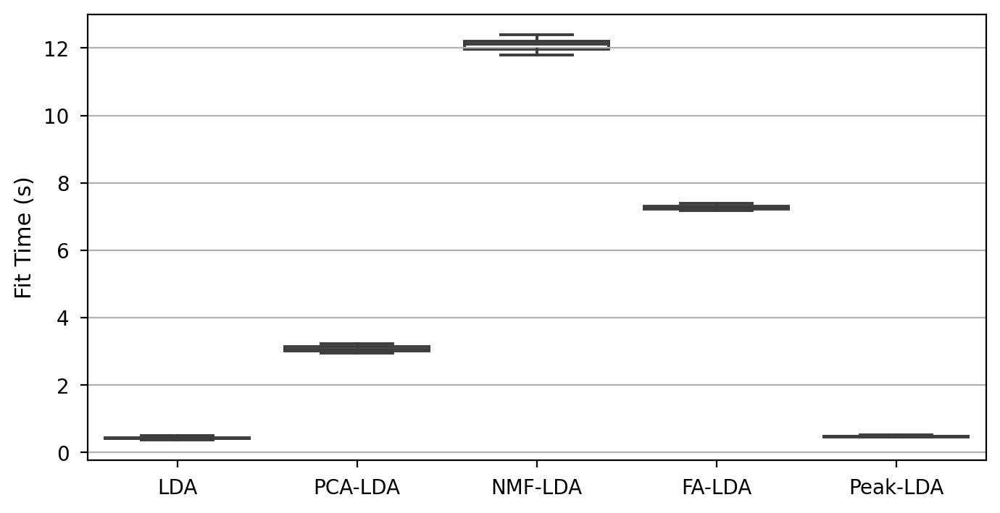

In [53]:
fig, ax = plt.subplots(figsize=(8,4))
boxplot_comparison(fit_times, regex="LDA")

ax.grid(axis="y")
ax.set_ylabel("Fit Time (s)")

Text(0, 0.5, 'Predict Time (s)')

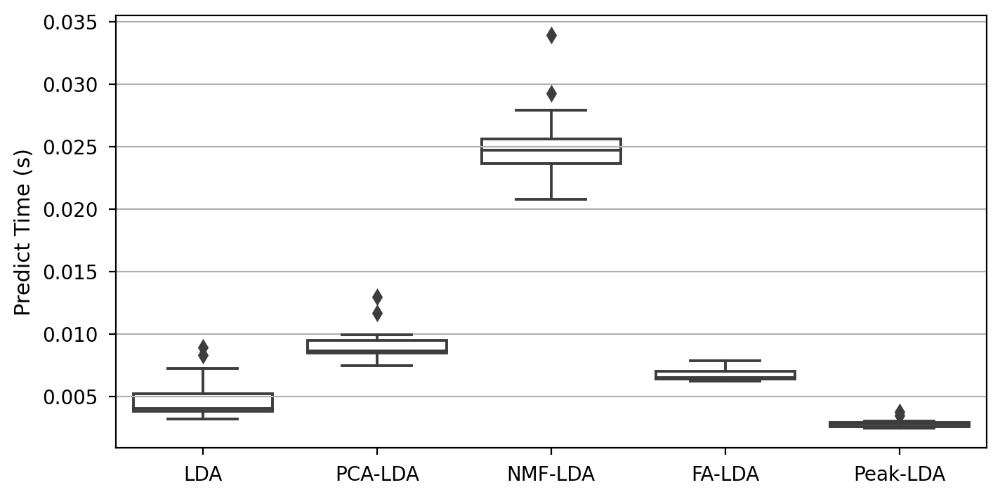

In [54]:
fig, ax = plt.subplots(figsize=(8,4))
boxplot_comparison(predict_times, regex="LDA")

ax.grid(axis="y")
ax.set_ylabel("Predict Time (s)")

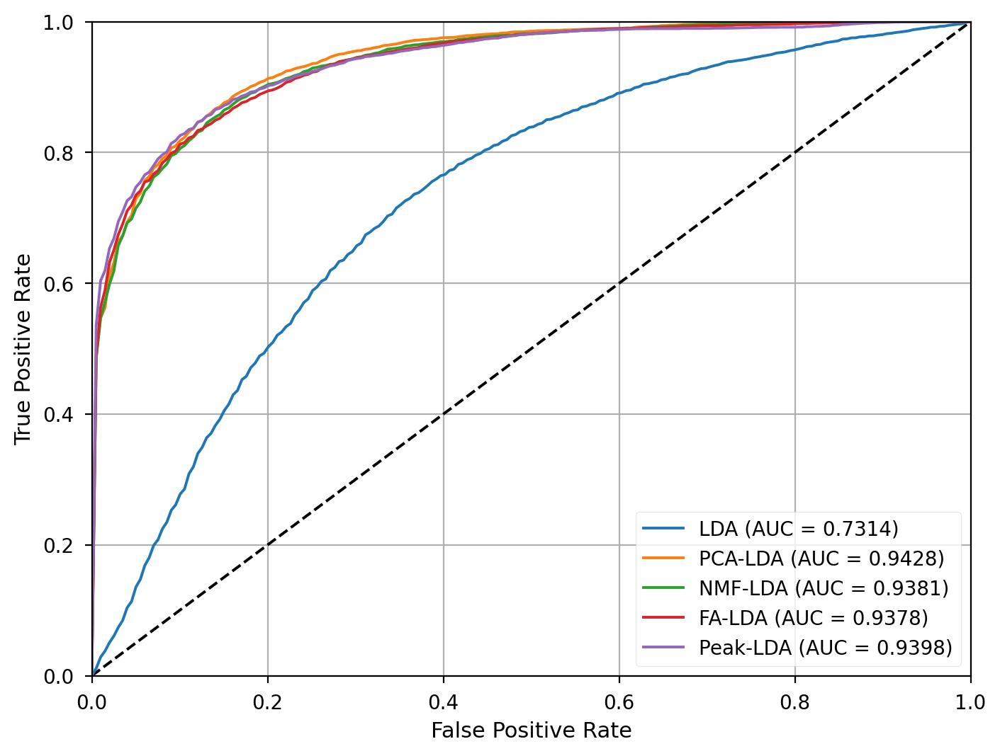

In [55]:
fig, ax = plt.subplots()
plot_roc_comparison(rocs, aucs, ax=ax, regex="LDA")

ax.grid()
ax.set_xlabel(f"False Positive Rate")
ax.set_ylabel(f"True Positive Rate")
ax.legend(loc="lower right")

# Regularized Models
## Logistic Regression (l1)
### Overview

In [57]:
current_path = results_path / "regularized_models/logreg_l1/"
name = "Log. Reg. (l1)"

ct_df = pd.read_csv(current_path / "ct_results.csv")

accs[name] = ct_df.test_accuracy
f1_scores[name] = ct_df.test_f1
fit_times[name] = ct_df.fit_time
predict_times[name] = ct_df.predict_time
p_vals[name] = ct_df.p_value

ct_df.describe()

,train_roc_auc,test_roc_auc,train_accuracy,test_accuracy,train_f1,test_f1,fit_time,predict_time,p_value
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,2.000000e+01
mean,0.982913,0.954556,0.939417,0.884833,0.939009,0.884168,2.122867,0.009227,4.796187e-39
std,0.003116,0.002868,0.007041,0.007313,0.007080,0.007312,0.041016,0.000786,1.180708e-38
min,0.974722,0.947889,0.924583,0.875000,0.924291,0.874105,2.025814,0.008031,1.155650e-43
25%,0.980860,0.953306,0.934375,0.880000,0.933817,0.879320,2.097820,0.008593,1.450653e-41
50%,0.983668,0.954417,0.938750,0.882500,0.938401,0.882785,2.123103,0.009170,1.303732e-40
75%,0.985280,0.956681,0.946667,0.890417,0.946326,0.889100,2.154108,0.009468,1.649255e-39
max,0.987274,0.960722,0.949167,0.898333,0.948956,0.898314,2.187481,0.011516,3.894645e-38


### Validation Curve

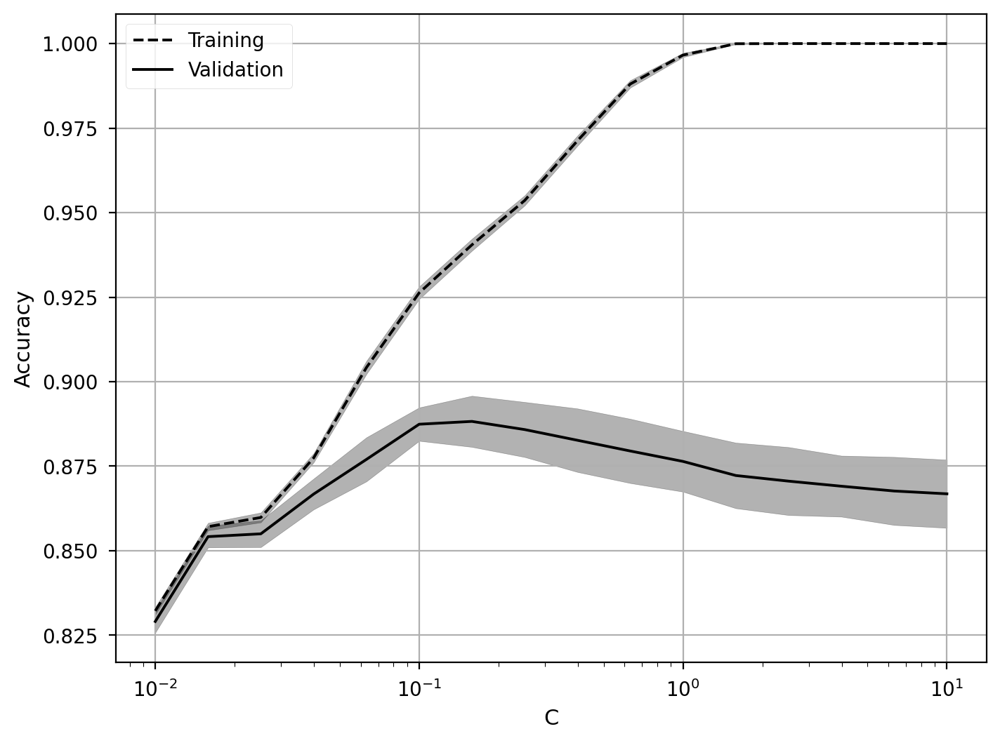

In [58]:
cv_df = pd.read_csv(current_path / "cv_results.csv")

fig, ax = plt.subplots()
plot_validation_curve(cv_df, ax=ax)

ax.set_xscale("log")
ax.set_xlabel("C")
ax.set_ylabel("Accuracy")
ax.grid()
ax.legend(loc="upper left")

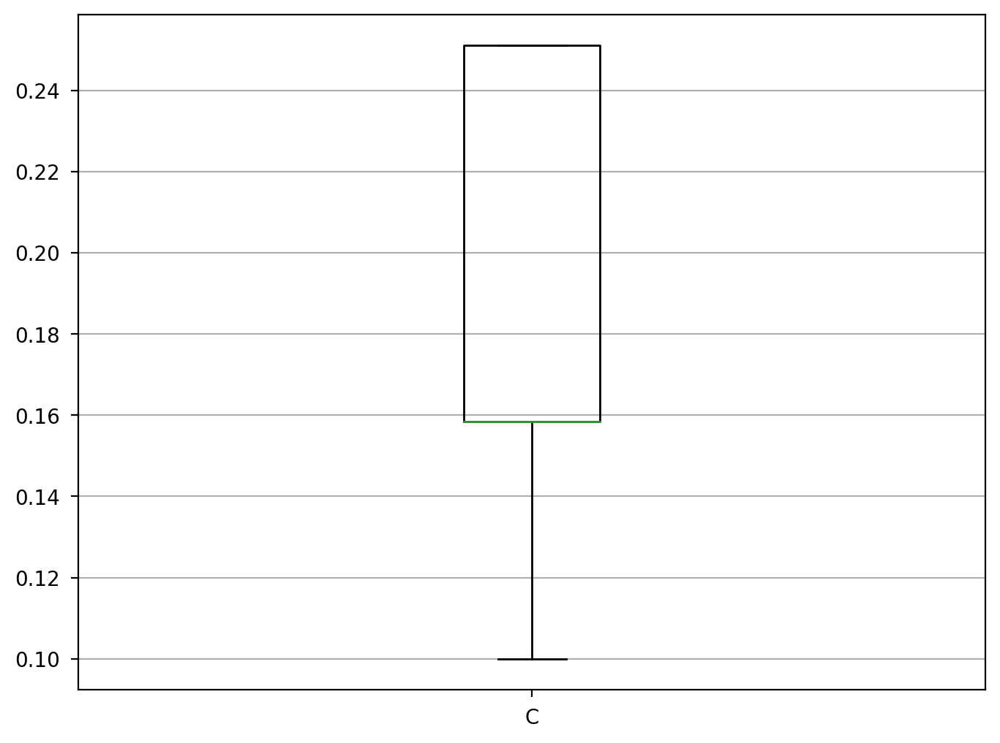

In [59]:
param_df = pd.read_csv(current_path / "param_results.csv")

fig, ax = plt.subplots()
param_df.boxplot(ax=ax, grid=False, boxprops={"color":"k"}, whiskerprops={"color":"k"})
ax.set_xticklabels(["C"])
ax.ticklabel_format(axis="y", style="scientific", scilimits=(-2, 2))
ax.grid(axis="y")

### Confidence scores by class

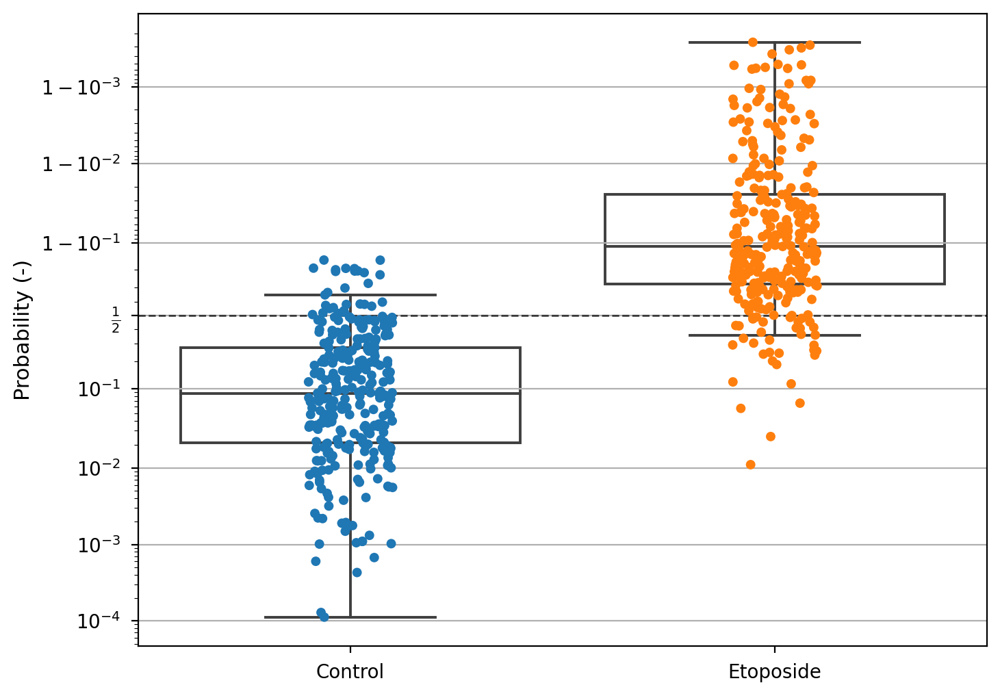

In [60]:
proba_df = pd.read_csv(current_path / "probabilities.csv", header=None)

fig, ax = plt.subplots()
plot_confidence_scores(proba_df, y_key[y], y_key, ax=ax)
ax.axhline(0.5, color="k", linestyle="--", linewidth=1, alpha=0.7)
ax.set_yscale("logit")
ax.set_ylabel("Probability (-)")
ax.grid(axis="y")

### Model coefficients

Positive: Higher in Treated

Negative: Higher in Control

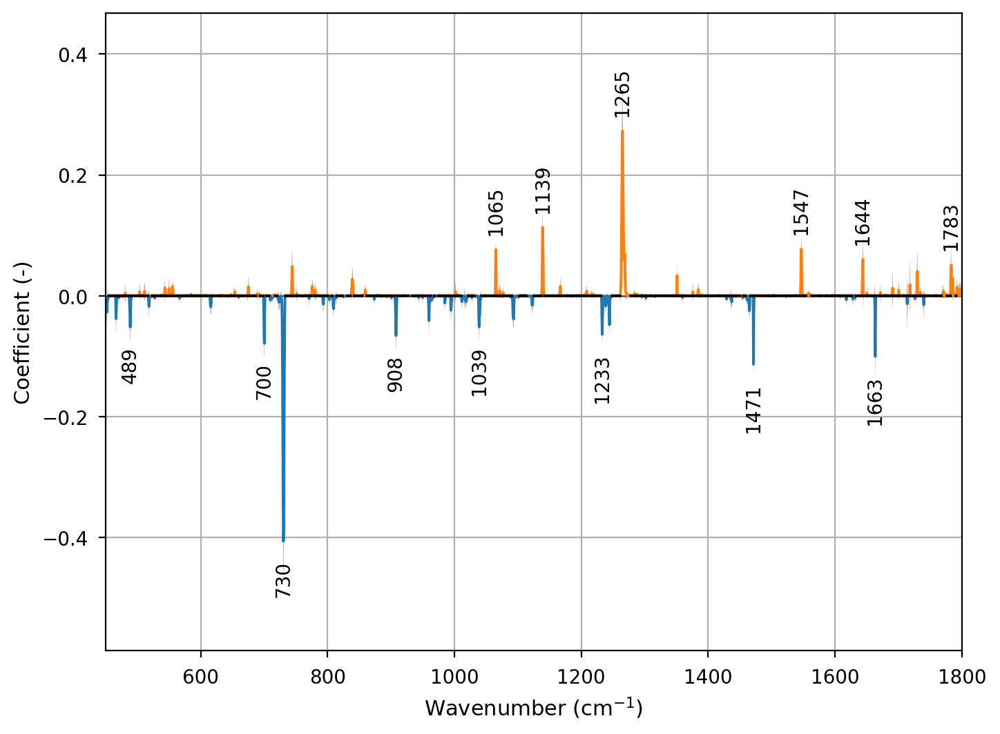

In [61]:
coef_df = pd.read_csv(current_path / "coefficients.csv")

fig, ax = plt.subplots()
plot_coefs(coef_df, ax=ax, show_range=True, annotate=True, annot_kw={"min_height": 0.05, 
                                                                     "min_dist": 50,
                                                                     "offset": 10})

ax.set_xlabel("Wavenumber ($\mathregular{cm^{-1}}$)")
ax.set_ylabel("Coefficient (-)")
ax.margins(x=0, y=0.15)
ax.grid()

### Confusion Matrix

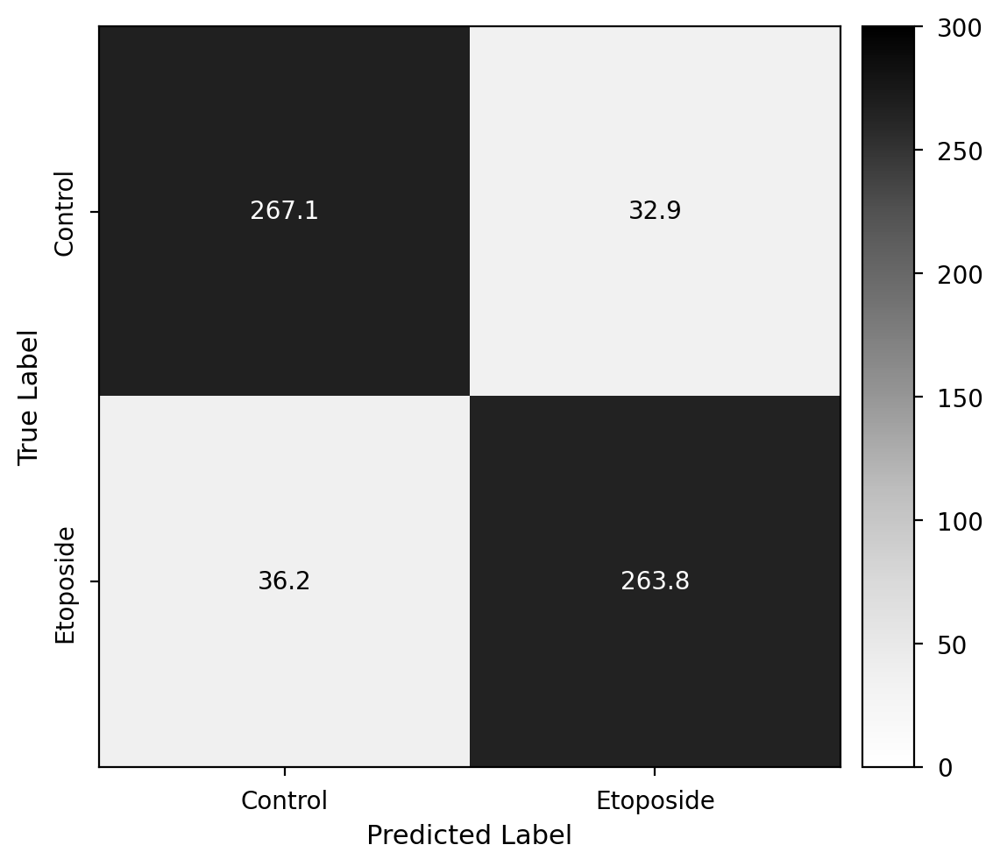

In [62]:
pred_df = pd.read_csv(current_path / "predictions.csv", header=None)

fig, ax = plt.subplots(figsize=(6,6))
plot_confusion_matrix(pred_df, y, labels=y_key, ax=ax, cmap="Greys", colorbar=True)

### ROC Curve

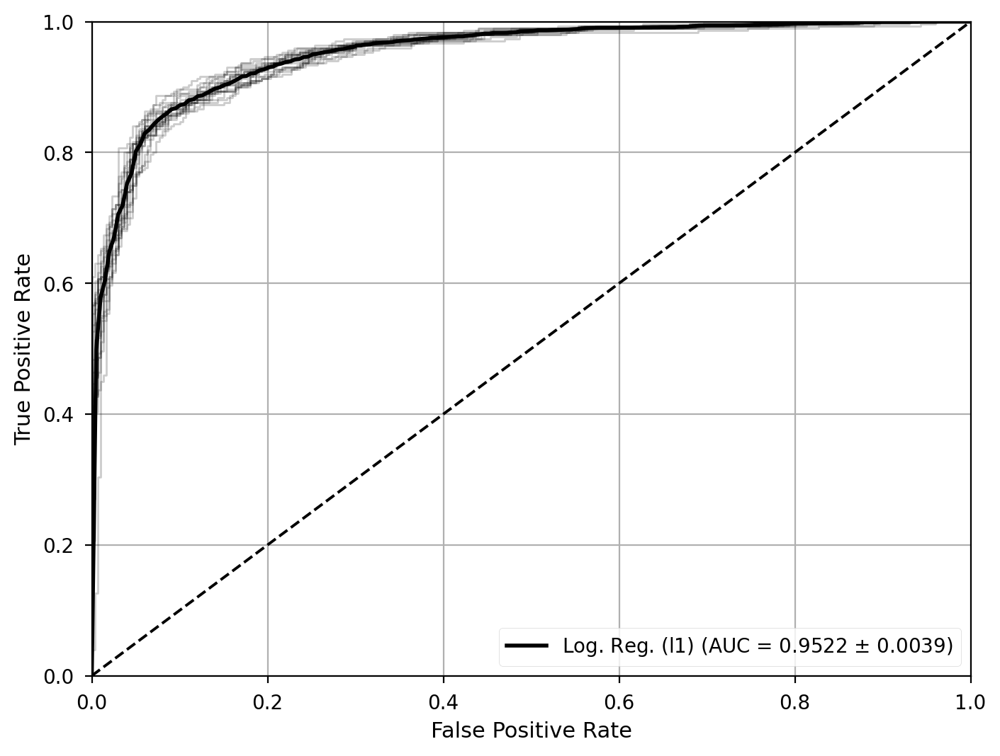

In [63]:
fig, ax = plt.subplots()
roc, auc = plot_roc_curve(proba_df, y, name, ax=ax)

ax.set_xlabel(f"False Positive Rate")
ax.set_ylabel(f"True Positive Rate")
ax.legend(loc="lower right")
ax.grid()

rocs[name] = roc
aucs[name] = auc

## Logistic Regression (l2)
### Overview

In [66]:
current_path = results_path / "regularized_models/logreg_l2/"
name = "Log. Reg. (l2)"

ct_df = pd.read_csv(current_path / "ct_results.csv")

accs[name] = ct_df.test_accuracy
f1_scores[name] = ct_df.test_f1
fit_times[name] = ct_df.fit_time
predict_times[name] = ct_df.predict_time
p_vals[name] = ct_df.p_value

ct_df.describe()

,train_roc_auc,test_roc_auc,train_accuracy,test_accuracy,train_f1,test_f1,fit_time,predict_time,p_value
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,2.000000e+01
mean,0.989256,0.940967,0.950479,0.860333,0.950524,0.860262,2.453661,0.007768,5.555295e-34
std,0.002256,0.004161,0.007688,0.008122,0.007638,0.008086,0.054147,0.000439,1.459222e-33
min,0.984920,0.934056,0.935417,0.846667,0.935564,0.847056,2.384593,0.007029,1.899078e-39
25%,0.988267,0.937611,0.946250,0.854583,0.946536,0.854415,2.406631,0.007485,4.729379e-36
50%,0.989370,0.941722,0.949792,0.860000,0.949916,0.859463,2.445760,0.007689,1.550245e-35
75%,0.990477,0.944250,0.953750,0.865000,0.953934,0.865283,2.493857,0.008068,2.127062e-34
max,0.993785,0.947222,0.968750,0.881667,0.968703,0.881713,2.564049,0.008656,6.403254e-33


### Validation Curve

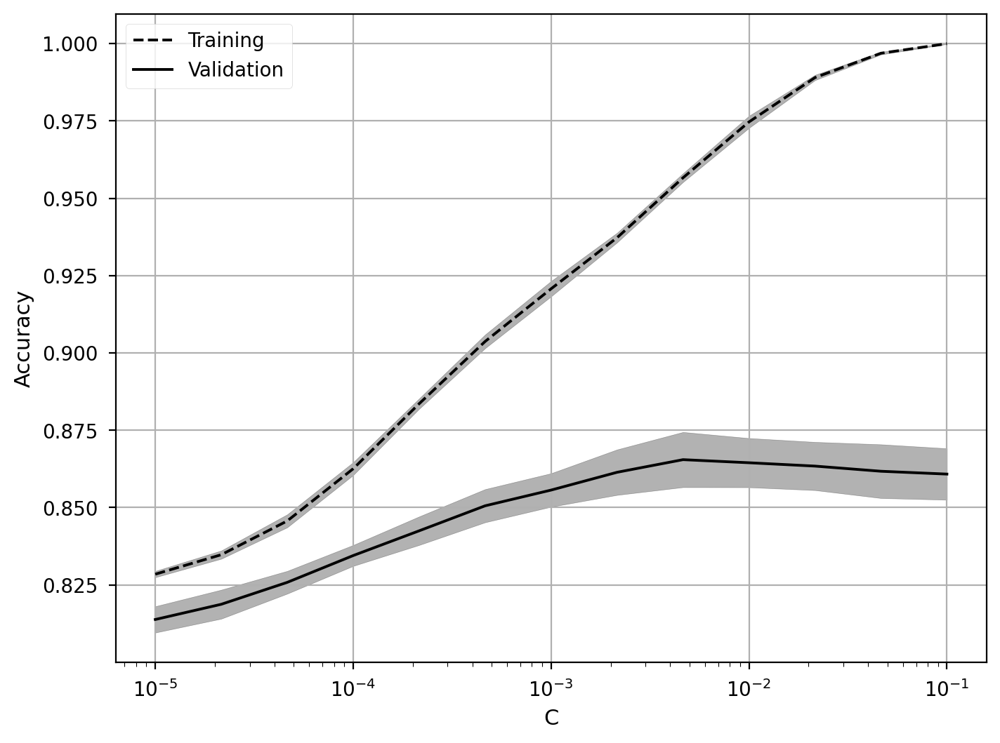

In [67]:
cv_df = pd.read_csv(current_path / "cv_results.csv")

fig, ax = plt.subplots()
plot_validation_curve(cv_df, ax=ax)

ax.set_xscale("log")
ax.set_xlabel("C")
ax.set_ylabel("Accuracy")
ax.grid()
ax.legend(loc="upper left")

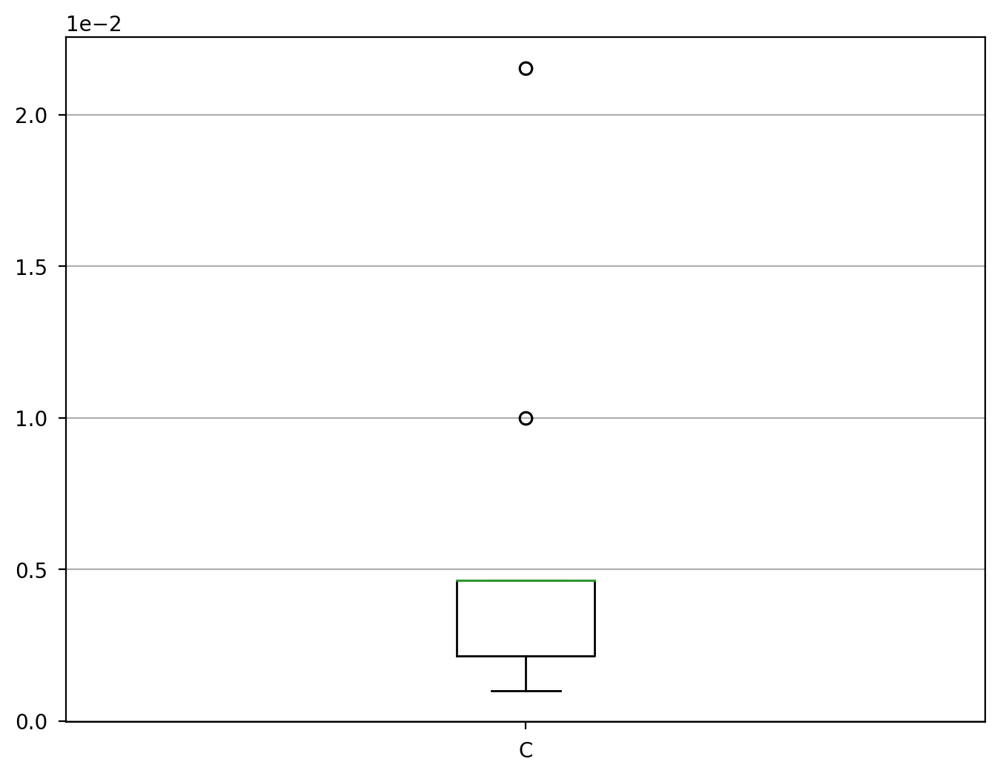

In [68]:
param_df = pd.read_csv(current_path / "param_results.csv")

fig, ax = plt.subplots()
param_df.boxplot(ax=ax, grid=False, boxprops={"color":"k"}, whiskerprops={"color":"k"})
ax.set_xticklabels(["C"])
ax.ticklabel_format(axis="y", style="scientific", scilimits=(-2, 2))
ax.grid(axis="y")

### Confidence scores by class

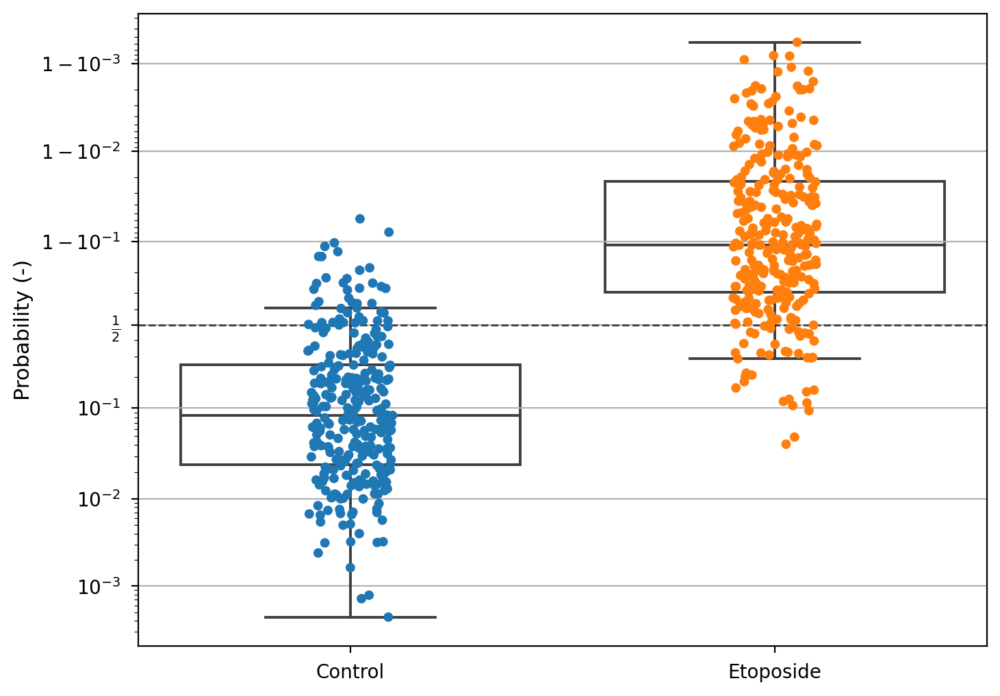

In [69]:
proba_df = pd.read_csv(current_path / "probabilities.csv", header=None)

fig, ax = plt.subplots()
plot_confidence_scores(proba_df, y_key[y], y_key, ax=ax)
ax.axhline(0.5, color="k", linestyle="--", linewidth=1, alpha=0.7)
ax.set_yscale("logit")
ax.set_ylabel("Probability (-)")
ax.grid(axis="y")

### Model coefficients

Positive: Higher in Treated

Negative: Higher in Control

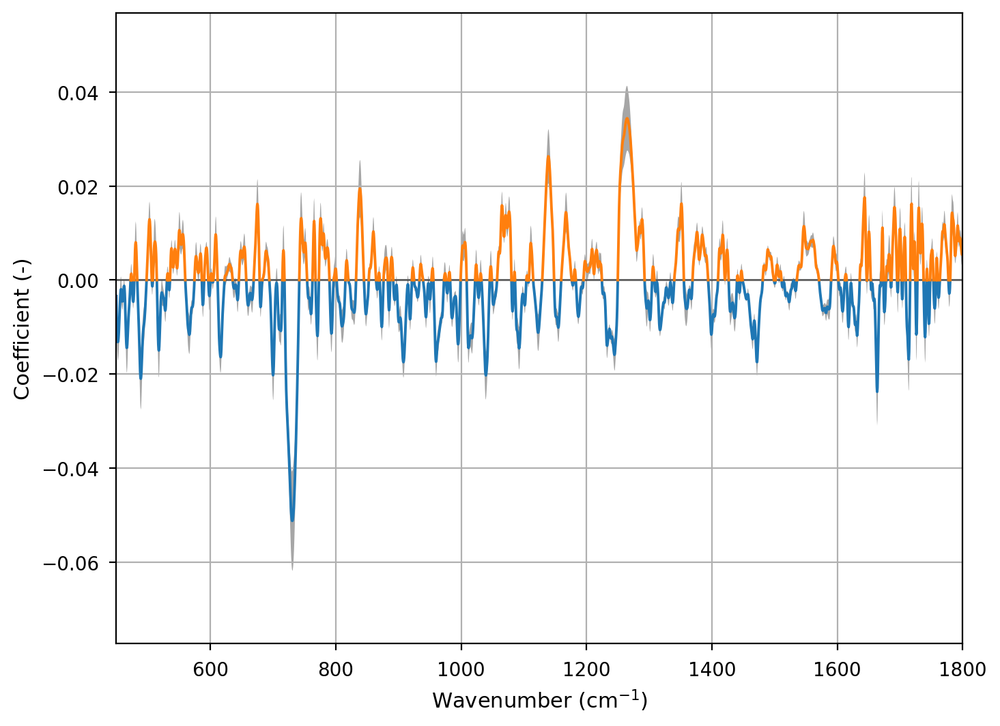

In [70]:
coef_df = pd.read_csv(current_path / "coefficients.csv")

fig, ax = plt.subplots()
plot_coefs(coef_df, ax=ax, show_range=True)

ax.set_xlabel("Wavenumber ($\mathregular{cm^{-1}}$)")
ax.set_ylabel("Coefficient (-)")
ax.margins(x=0, y=0.15)
ax.grid()

### Confusion Matrix

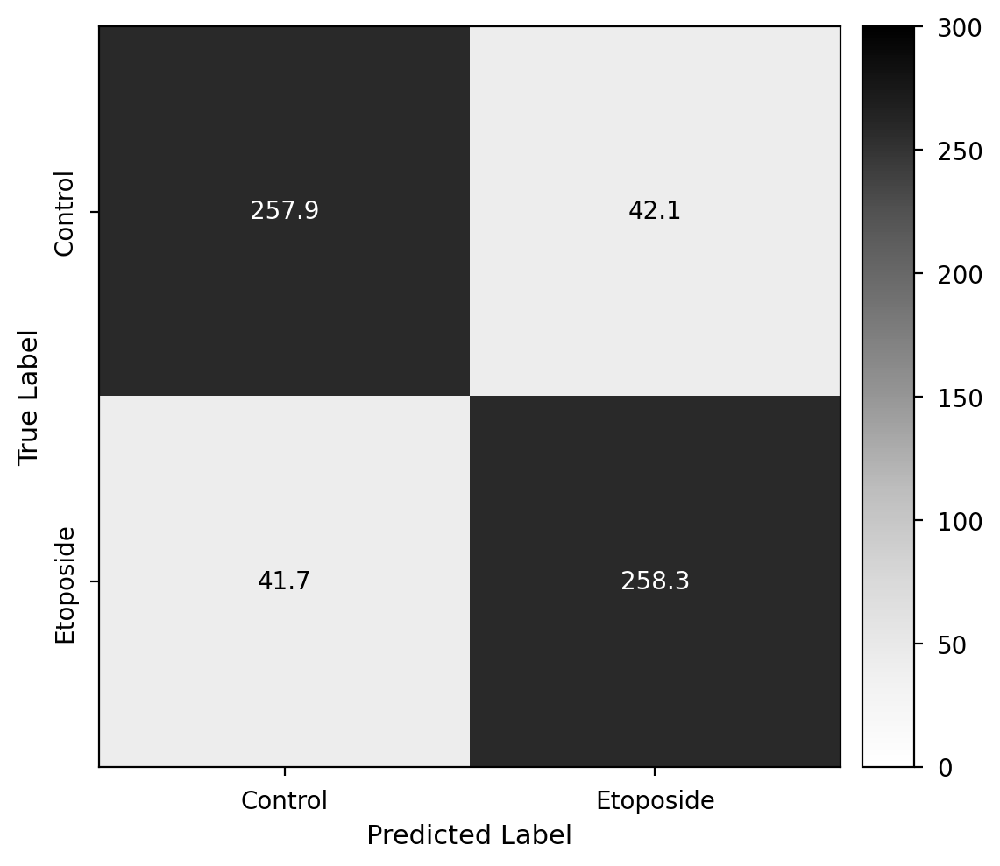

In [71]:
pred_df = pd.read_csv(current_path / "predictions.csv", header=None)

fig, ax = plt.subplots(figsize=(6,6))
plot_confusion_matrix(pred_df, y, labels=y_key, ax=ax, cmap="Greys", colorbar=True)

### ROC Curve

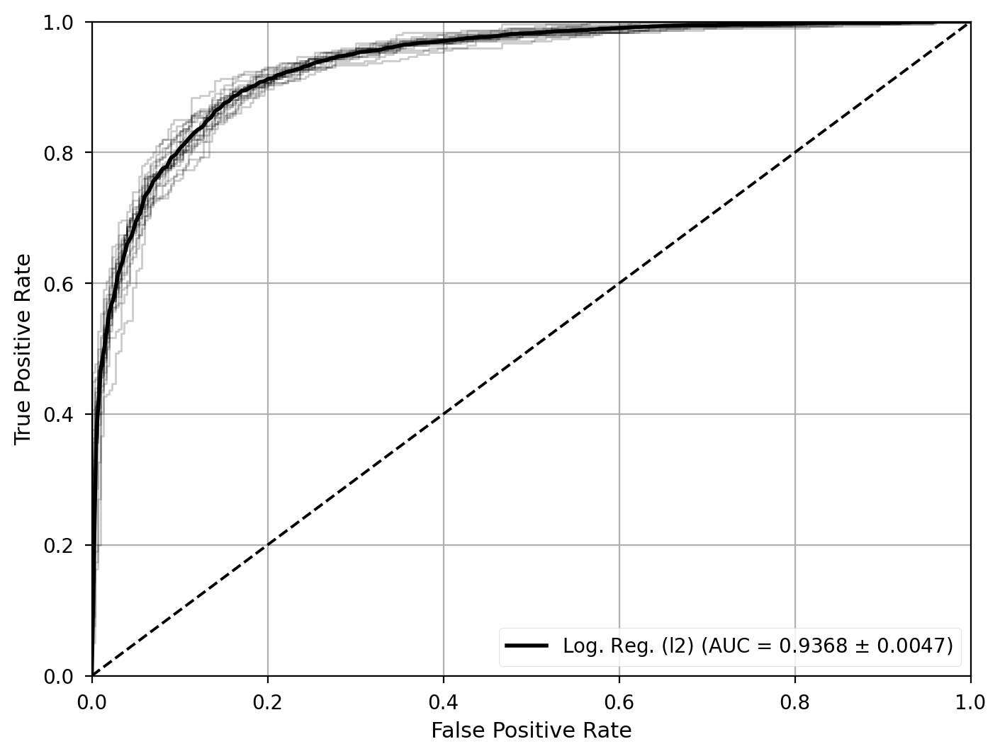

In [72]:
fig, ax = plt.subplots()
roc, auc = plot_roc_curve(proba_df, y, name, ax=ax)

ax.set_xlabel(f"False Positive Rate")
ax.set_ylabel(f"True Positive Rate")
ax.legend(loc="lower right")
ax.grid()

rocs[name] = roc
aucs[name] = auc

## Support Vector Machine (l1)
### Overview

In [75]:
current_path = results_path / "regularized_models/svm_l1/"
name = "SVM (l1)"

ct_df = pd.read_csv(current_path / "ct_results.csv")

accs[name] = ct_df.test_accuracy
f1_scores[name] = ct_df.test_f1
fit_times[name] = ct_df.fit_time
predict_times[name] = ct_df.predict_time
p_vals[name] = ct_df.p_value

ct_df.describe()

,train_roc_auc,test_roc_auc,train_accuracy,test_accuracy,train_f1,test_f1,fit_time,predict_time,p_value
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,2.000000e+01
mean,0.984628,0.955044,0.941021,0.884333,0.940784,0.884132,5.307055,0.009109,5.062877e-39
std,0.002004,0.003024,0.005345,0.007597,0.005371,0.007453,0.098035,0.000738,1.502400e-38
min,0.980740,0.950500,0.930417,0.875000,0.930053,0.875650,5.124517,0.007923,1.274942e-46
25%,0.983325,0.953278,0.937396,0.881250,0.937091,0.879951,5.245504,0.008599,2.832622e-40
50%,0.985097,0.955417,0.943125,0.882500,0.942752,0.883109,5.314953,0.009101,6.988179e-40
75%,0.986070,0.956847,0.945417,0.885833,0.945283,0.885882,5.347791,0.009698,1.619434e-39
max,0.987240,0.963056,0.947500,0.910000,0.947318,0.908622,5.510337,0.010209,6.773598e-38


### Validation Curve

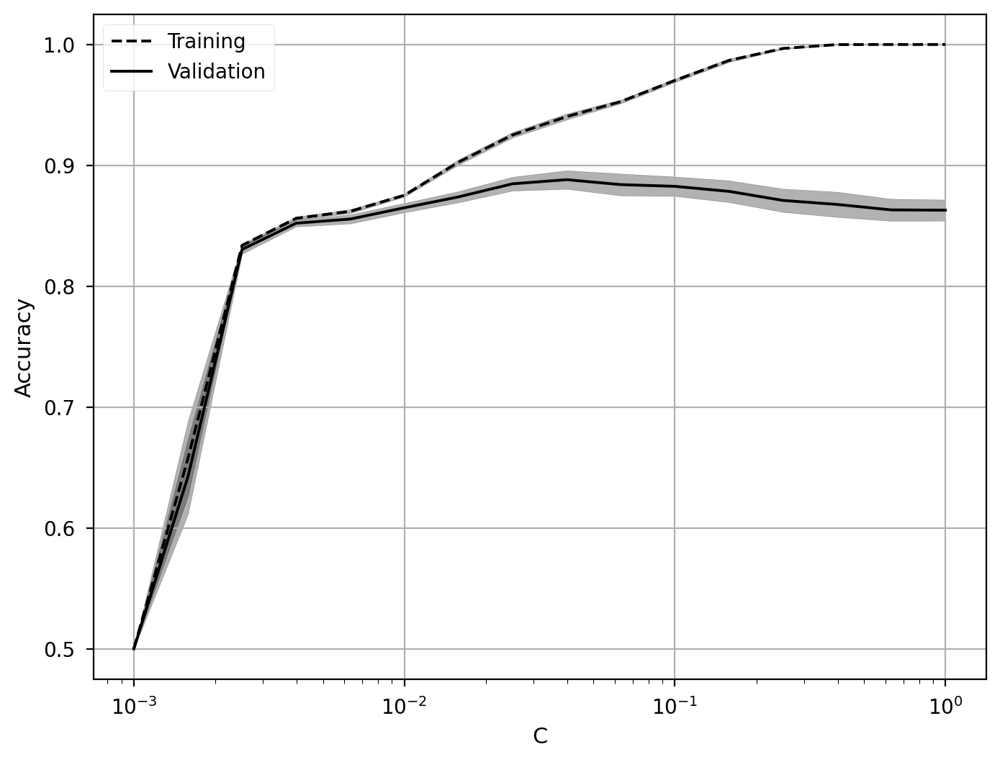

In [76]:
cv_df = pd.read_csv(current_path / "cv_results.csv")

fig, ax = plt.subplots()
plot_validation_curve(cv_df, ax=ax)

ax.set_xscale("log")
ax.set_xlabel("C")
ax.set_ylabel("Accuracy")
ax.grid()
ax.legend(loc="upper left")

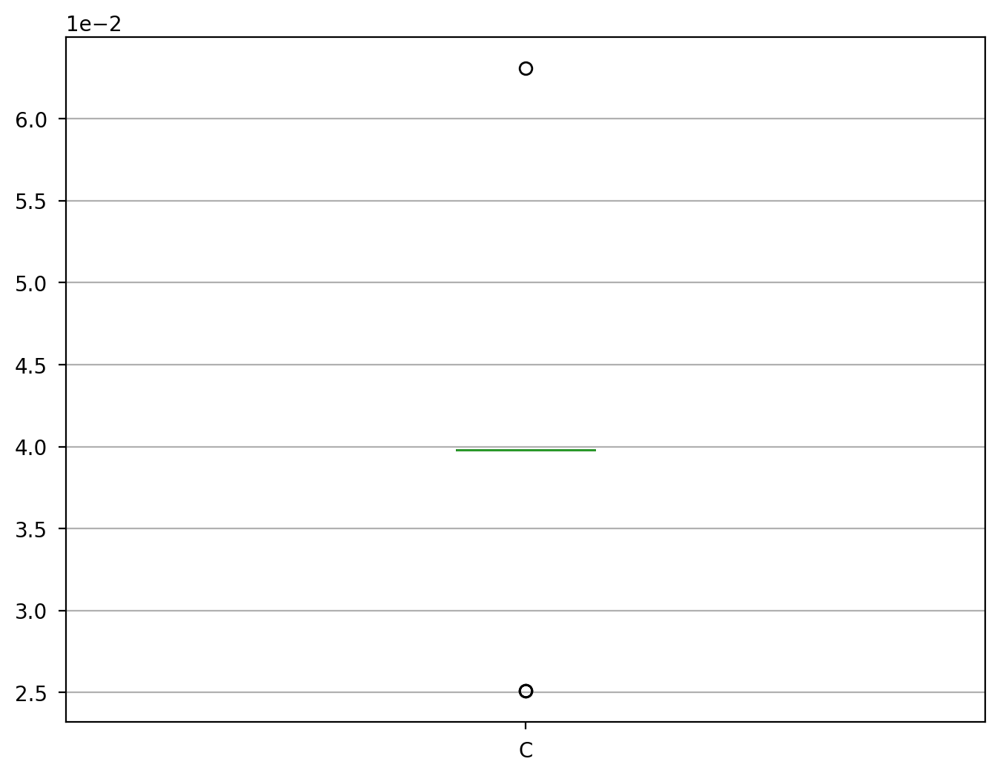

In [77]:
param_df = pd.read_csv(current_path / "param_results.csv")

fig, ax = plt.subplots()
param_df.boxplot(ax=ax, grid=False, boxprops={"color":"k"}, whiskerprops={"color":"k"})
ax.set_xticklabels(["C"])
ax.ticklabel_format(axis="y", style="scientific", scilimits=(-2, 2))
ax.grid(axis="y")

### Confidence scores by class

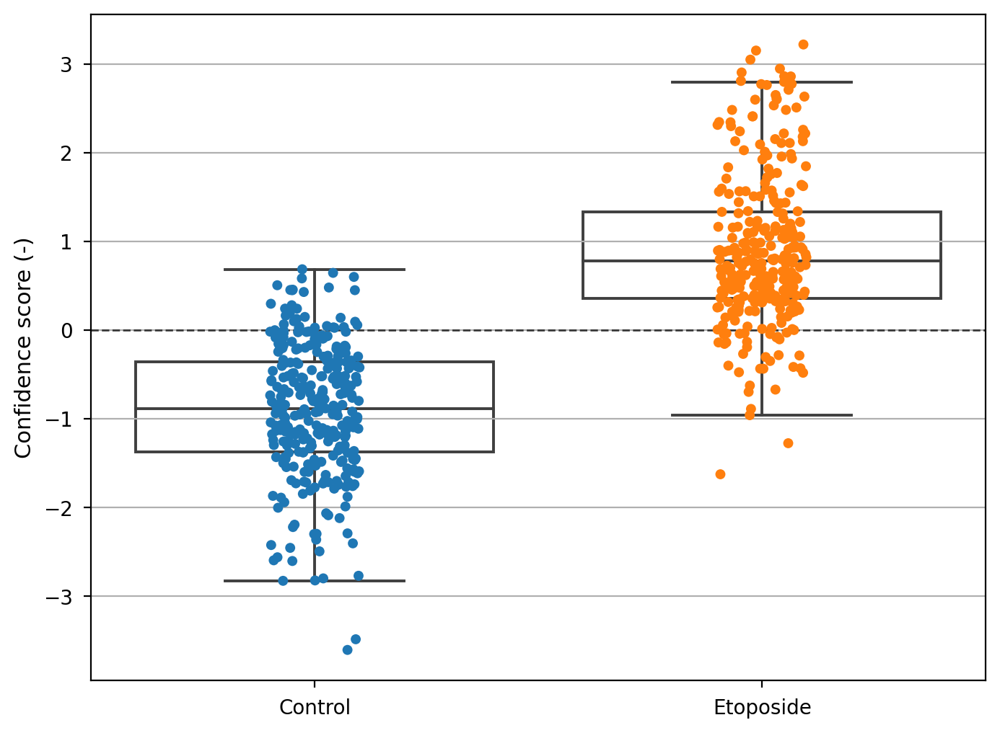

In [78]:
conf_score_df = pd.read_csv(current_path / "confidence_scores.csv", header=None)

fig, ax = plt.subplots()
plot_confidence_scores(conf_score_df, y_key[y], y_key, ax=ax)
ax.axhline(0, color="k", linestyle="--", linewidth=1, alpha=0.7)
ax.set_ylabel("Confidence score (-)")
ax.grid(axis="y")

### Model coefficients

Positive: Higher in Treated

Negative: Higher in Control

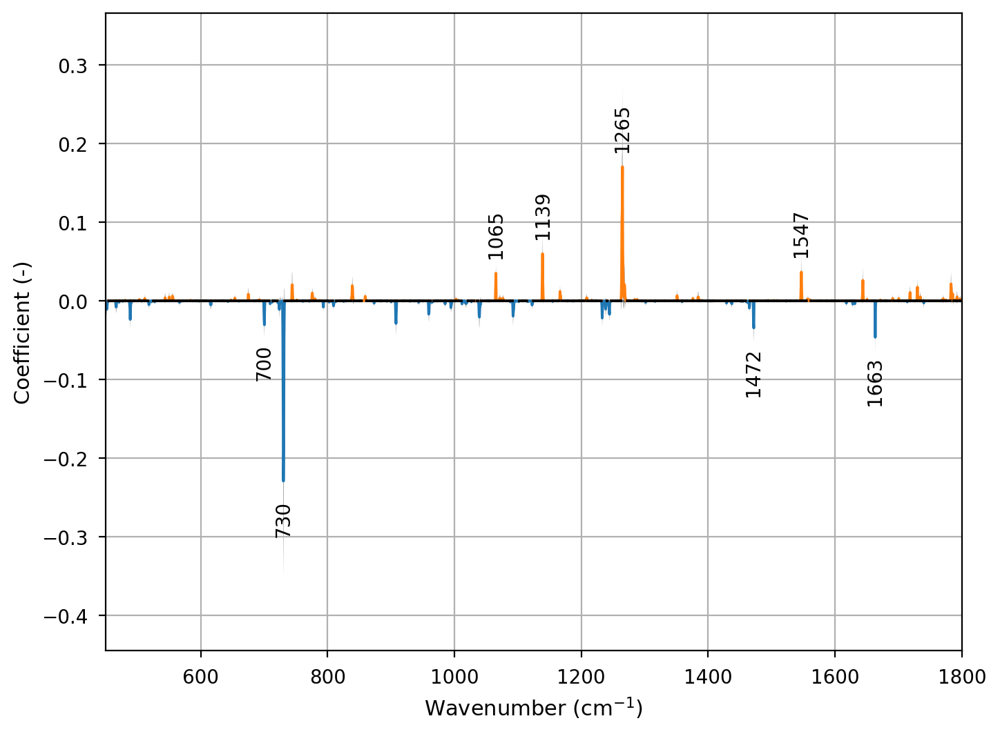

In [79]:
coef_df = pd.read_csv(current_path / "coefficients.csv")

fig, ax = plt.subplots()
plot_coefs(coef_df, ax=ax, show_range=True, annotate=True, annot_kw={"min_height": 0.03, 
                                                                     "min_dist": 50,
                                                                     "offset": 10})

ax.set_xlabel("Wavenumber ($\mathregular{cm^{-1}}$)")
ax.set_ylabel("Coefficient (-)")
ax.margins(x=0, y=0.15)
ax.grid()

### Confusion Matrix

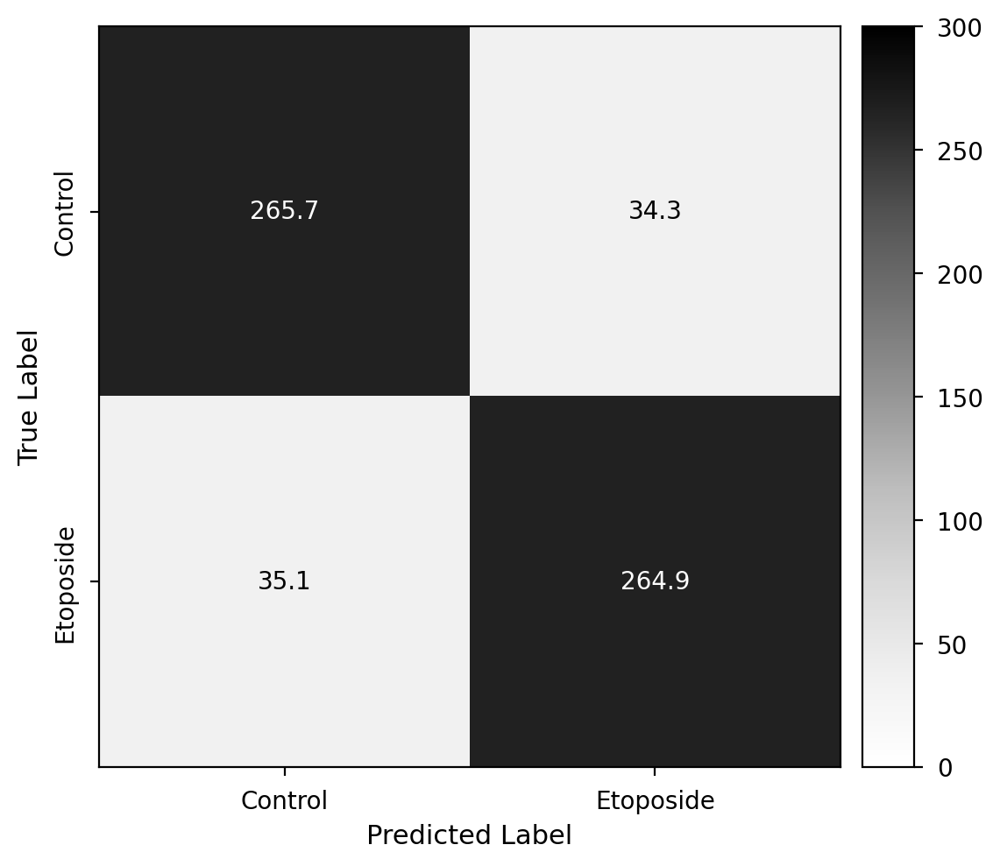

In [80]:
pred_df = pd.read_csv(current_path / "predictions.csv", header=None)

fig, ax = plt.subplots(figsize=(6,6))
plot_confusion_matrix(pred_df, y, labels=y_key, ax=ax, cmap="Greys", colorbar=True)

### ROC Curve

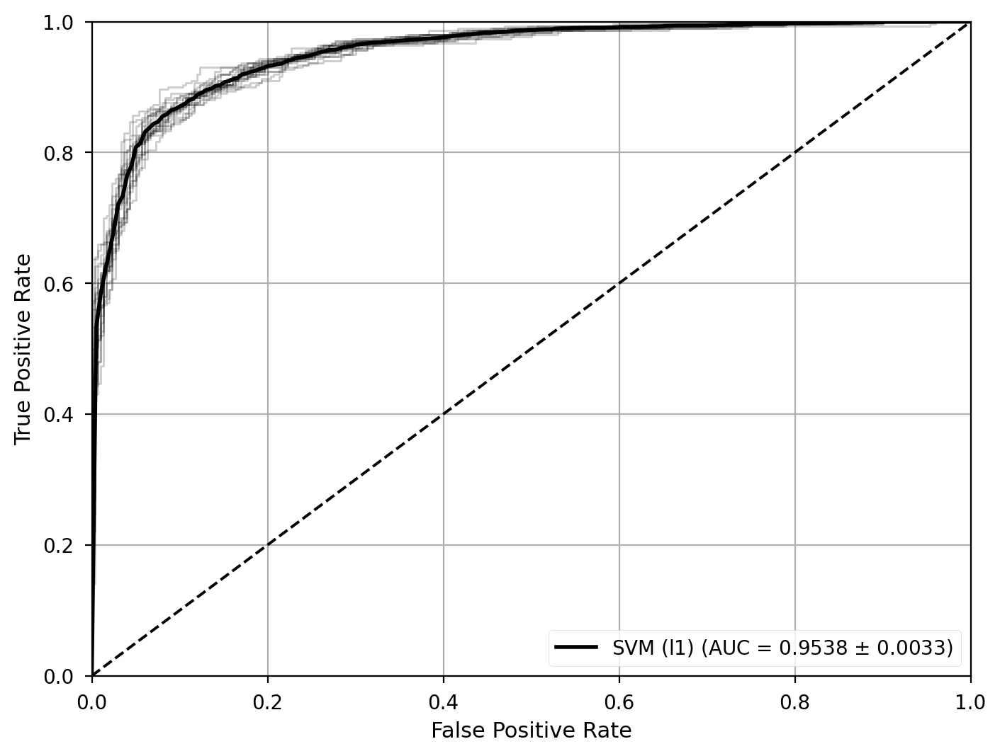

In [81]:
fig, ax = plt.subplots()
roc, auc = plot_roc_curve(conf_score_df, y, name, ax=ax)

ax.set_xlabel(f"False Positive Rate")
ax.set_ylabel(f"True Positive Rate")
ax.legend(loc="lower right")
ax.grid()

rocs[name] = roc
aucs[name] = auc

## Support Vector Machine (l2)
### Overview

In [84]:
current_path = results_path / "regularized_models/svm_l2/"
name = "SVM (l2)"

ct_df = pd.read_csv(current_path / "ct_results.csv")

accs[name] = ct_df.test_accuracy
f1_scores[name] = ct_df.test_f1
fit_times[name] = ct_df.fit_time
predict_times[name] = ct_df.predict_time
p_vals[name] = ct_df.p_value

ct_df.describe()

,train_roc_auc,test_roc_auc,train_accuracy,test_accuracy,train_f1,test_f1,fit_time,predict_time,p_value
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,2.000000e+01
mean,0.988955,0.940233,0.947688,0.860083,0.947847,0.860270,2.470081,0.007743,3.403535e-33
std,0.002296,0.003742,0.007174,0.009136,0.007116,0.009227,0.104116,0.000610,1.425731e-32
min,0.983420,0.932222,0.932500,0.841667,0.932938,0.842487,2.270440,0.006715,1.899078e-39
25%,0.988398,0.938042,0.944375,0.853333,0.944370,0.853292,2.394799,0.007279,1.221396e-36
50%,0.989302,0.940750,0.949583,0.858333,0.949862,0.858449,2.454895,0.007899,6.023553e-35
75%,0.990235,0.942528,0.951667,0.868333,0.951792,0.868122,2.515540,0.008215,2.943981e-34
max,0.992559,0.945778,0.958750,0.881667,0.958795,0.881297,2.712533,0.008807,6.396124e-32


### Validation Curve

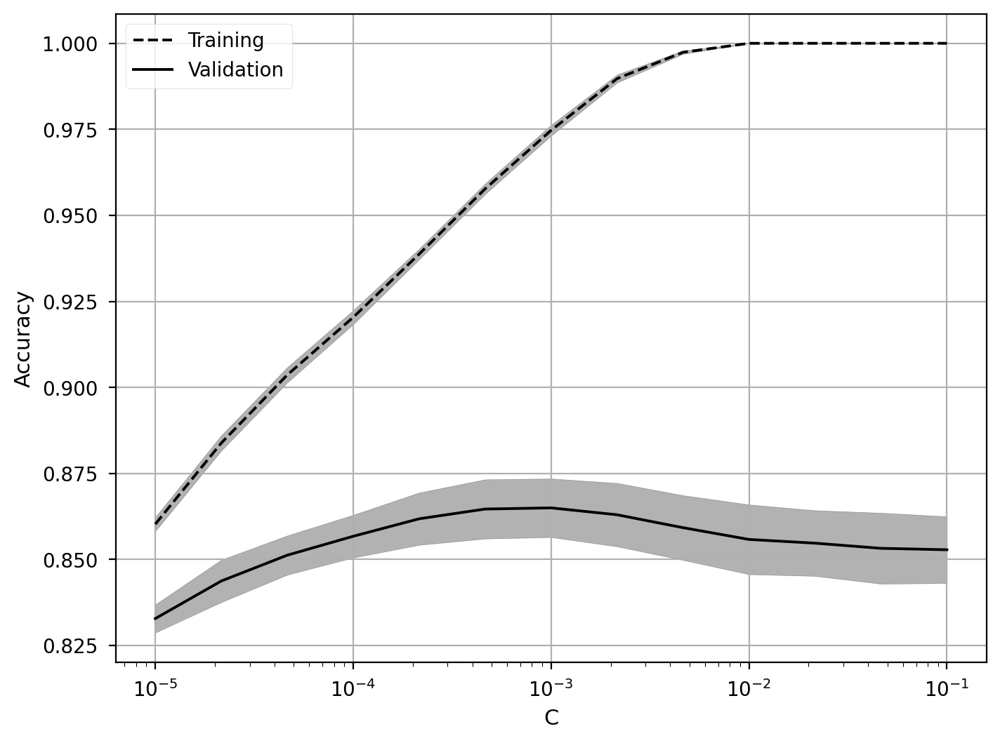

In [85]:
cv_df = pd.read_csv(current_path / "cv_results.csv")

fig, ax = plt.subplots()
plot_validation_curve(cv_df, ax=ax)

ax.set_xscale("log")
ax.set_xlabel("C")
ax.set_ylabel("Accuracy")
ax.grid()
ax.legend(loc="upper left")

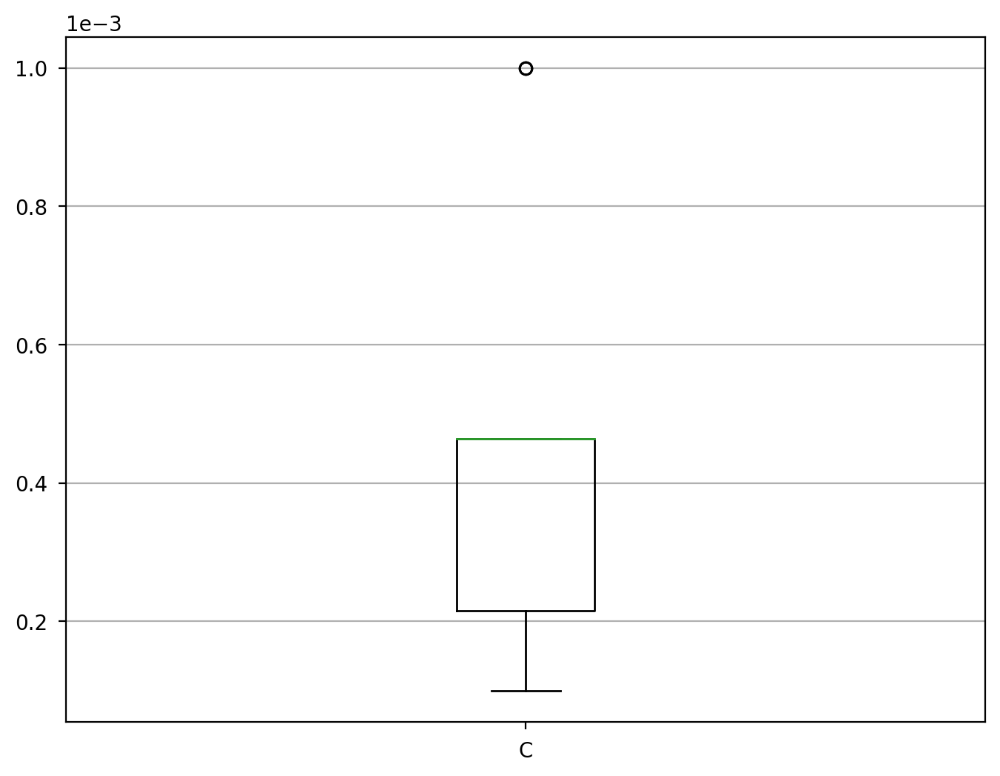

In [86]:
param_df = pd.read_csv(current_path / "param_results.csv")

fig, ax = plt.subplots()
param_df.boxplot(ax=ax, grid=False, boxprops={"color":"k"}, whiskerprops={"color":"k"})
ax.set_xticklabels(["C"])
ax.ticklabel_format(axis="y", style="scientific", scilimits=(-2, 2))
ax.grid(axis="y")

### Confidence scores by class

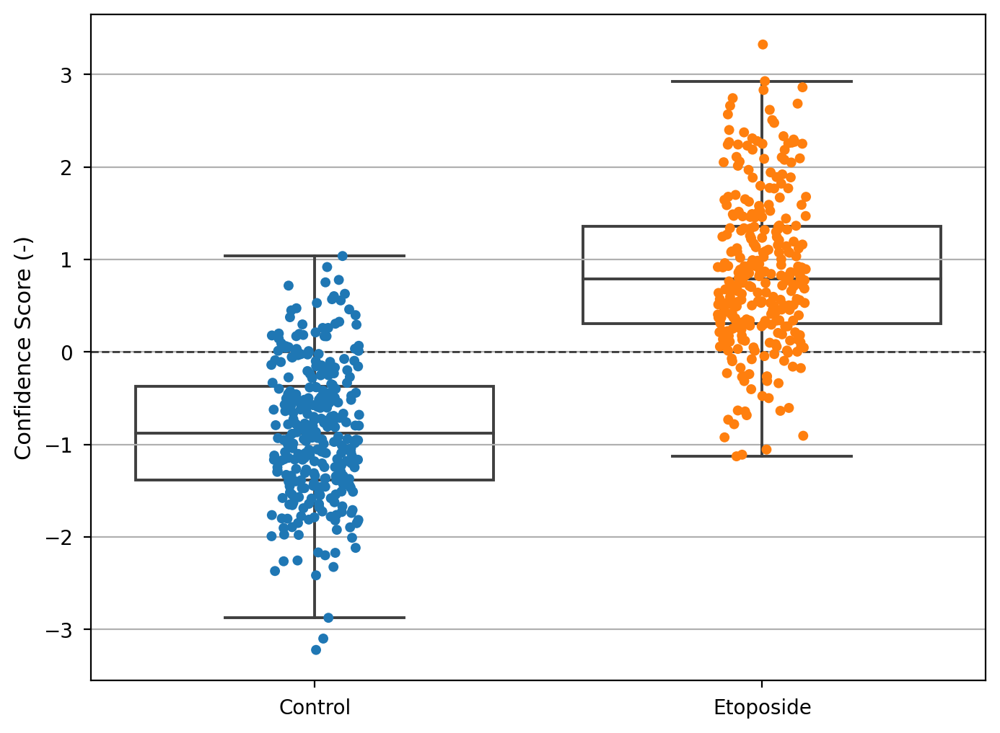

In [87]:
conf_score_df = pd.read_csv(current_path / "confidence_scores.csv", header=None)

fig, ax = plt.subplots()
plot_confidence_scores(conf_score_df, y_key[y], y_key, ax=ax)
ax.axhline(0, color="k", linestyle="--", linewidth=1, alpha=0.7)
ax.set_ylabel("Confidence Score (-)")
ax.grid(axis="y")

### Model coefficients

Positive: Higher in Treated

Negative: Higher in Control

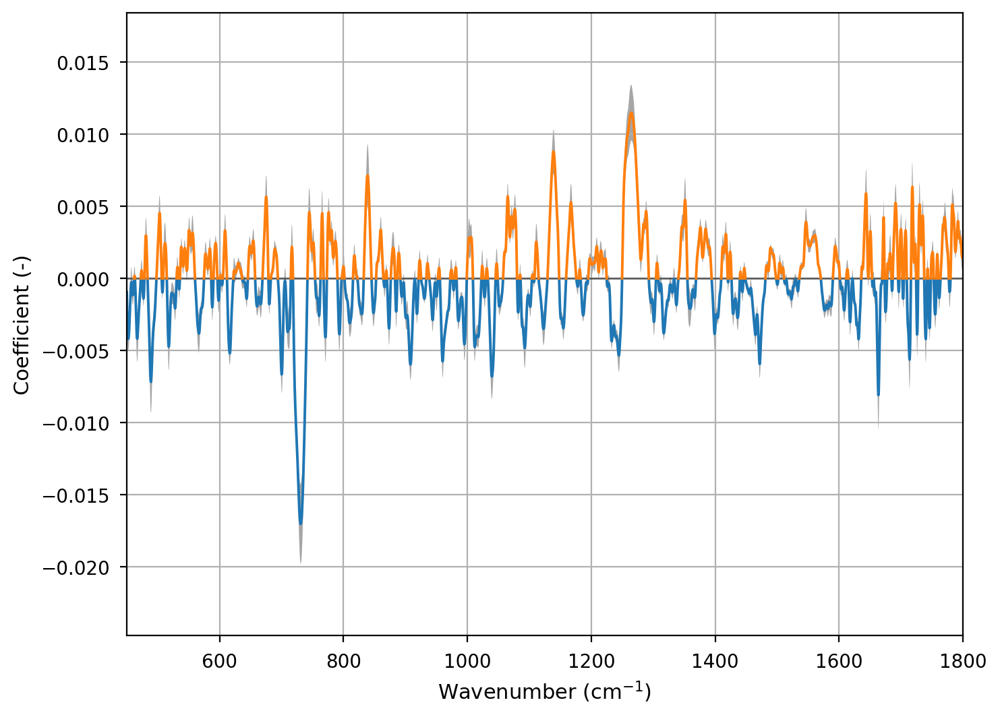

In [88]:
coef_df = pd.read_csv(current_path / "coefficients.csv")

fig, ax = plt.subplots()
plot_coefs(coef_df, ax=ax, show_range=True)

ax.set_xlabel("Wavenumber ($\mathregular{cm^{-1}}$)")
ax.set_ylabel("Coefficient (-)")
ax.margins(x=0, y=0.15)
ax.grid()

### Confusion Matrix

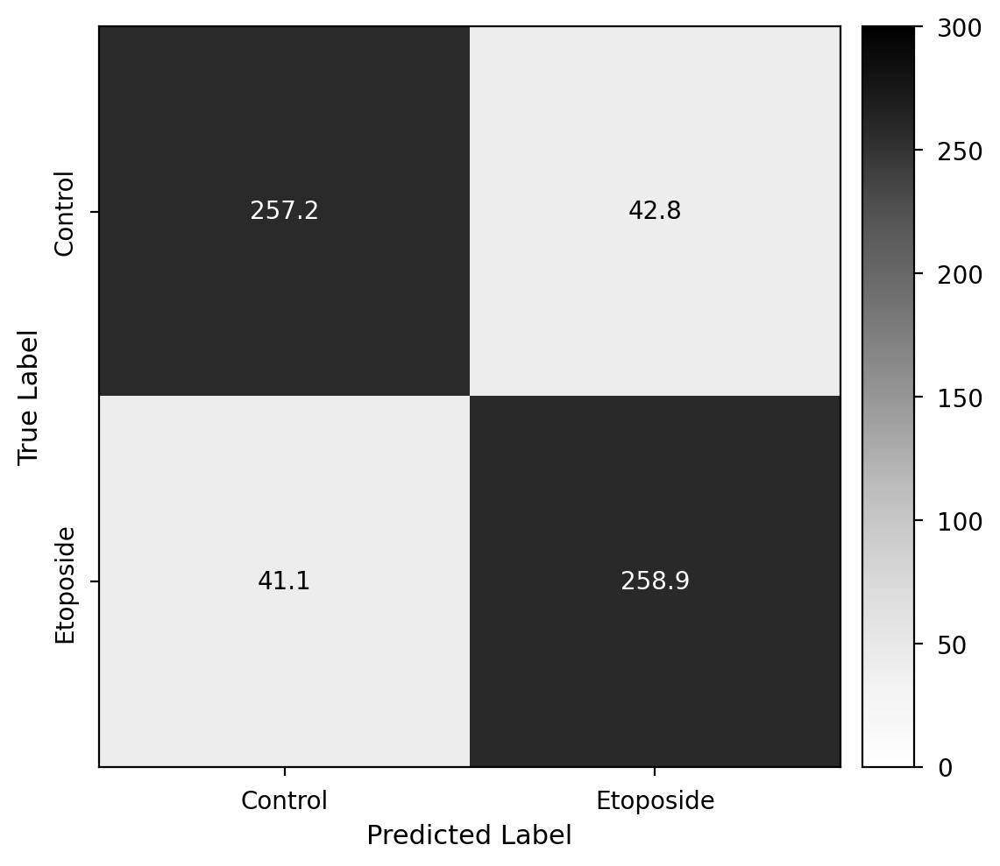

In [89]:
pred_df = pd.read_csv(current_path / "predictions.csv", header=None)

fig, ax = plt.subplots(figsize=(6,6))
plot_confusion_matrix(pred_df, y, labels=y_key, ax=ax, cmap="Greys", colorbar=True)

### ROC Curve

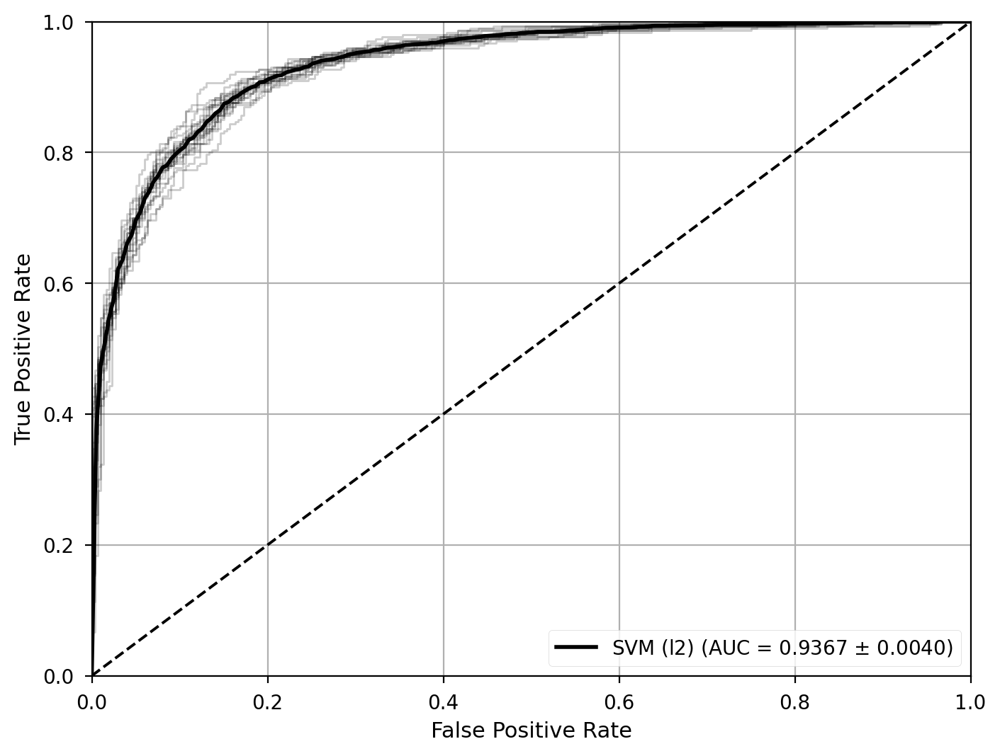

In [90]:
fig, ax = plt.subplots()
roc, auc = plot_roc_curve(conf_score_df, y, name, ax=ax)

ax.set_xlabel(f"False Positive Rate")
ax.set_ylabel(f"True Positive Rate")
ax.legend(loc="lower right")
ax.grid()

rocs[name] = roc
aucs[name] = auc

## Comparison of Regularized Models (Logistic Regression and Linear SVM)

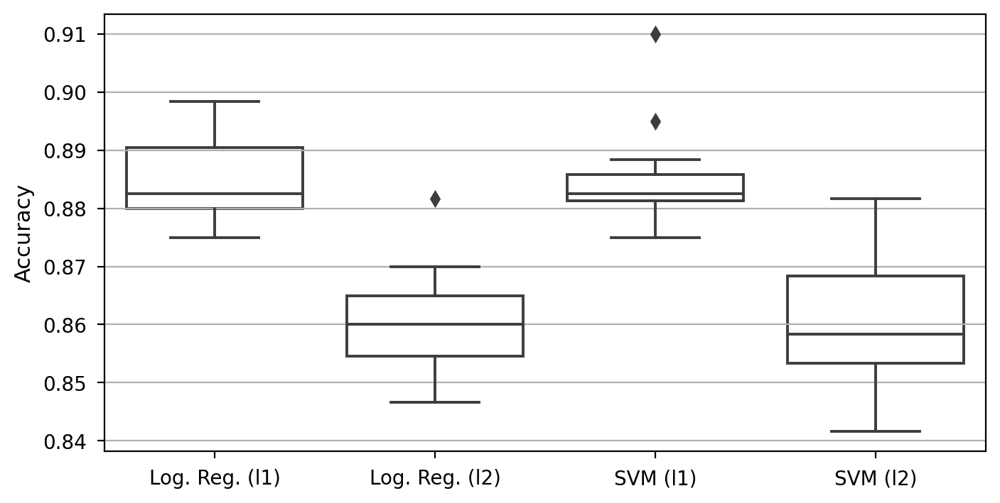

In [93]:
fig, ax = plt.subplots(figsize=(8,4))
boxplot_comparison(accs, regex="Log. Reg.|SVM")

ax.grid(axis="y")
ax.set_ylabel("Accuracy")

fig.savefig(img_path / "linear_accuracy.png", format="png", bbox_inches="tight")

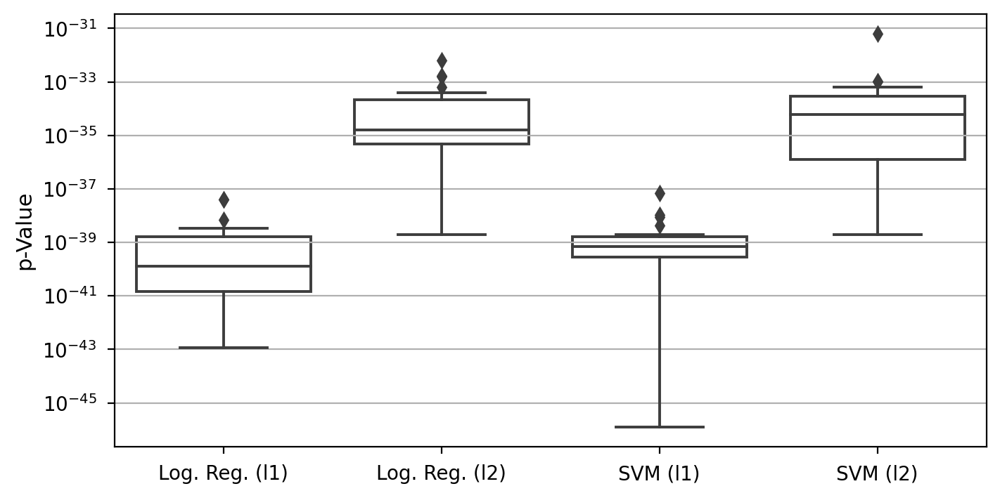

In [94]:
fig, ax = plt.subplots(figsize=(8,4))
boxplot_comparison(p_vals, regex="Log. Reg.|SVM")

ax.set_yscale("log")
ax.grid(axis="y")
ax.set_ylabel("p-Value")

fig.savefig(img_path / "linear_pval.png", format="png", bbox_inches="tight")

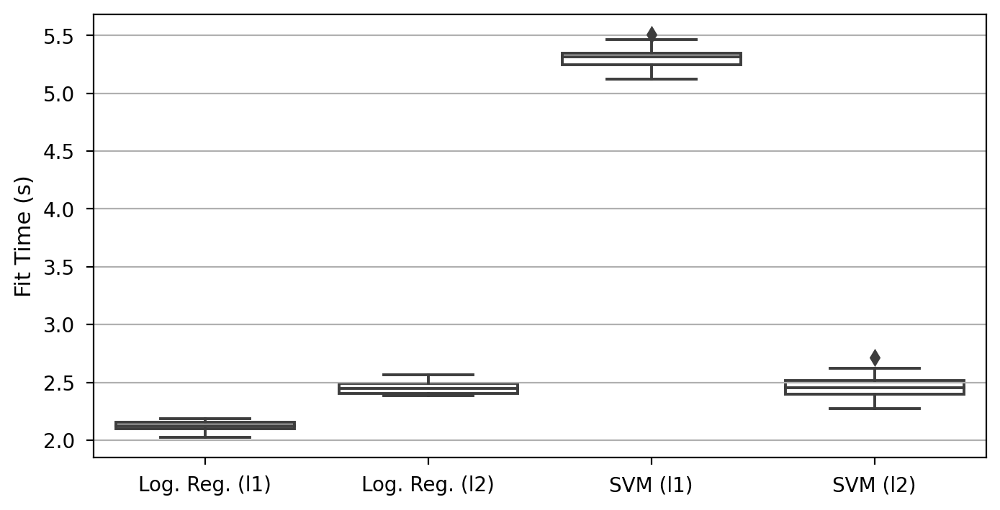

In [95]:
fig, ax = plt.subplots(figsize=(8,4))
boxplot_comparison(fit_times, regex="Log. Reg.|SVM")

ax.grid(axis="y")
ax.set_ylabel("Fit Time (s)")

fig.savefig(img_path / "linear_fittime.png", format="png", bbox_inches="tight")

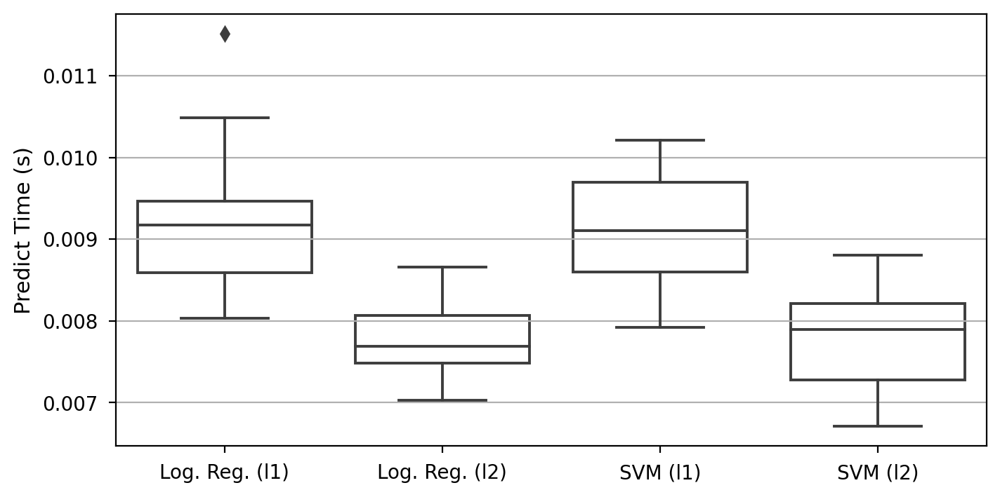

In [96]:
fig, ax = plt.subplots(figsize=(8,4))
boxplot_comparison(predict_times, regex="Log. Reg.|SVM")

ax.grid(axis="y")
ax.set_ylabel("Predict Time (s)")

fig.savefig(img_path / "linear_predicttime.png", format="png", bbox_inches="tight")

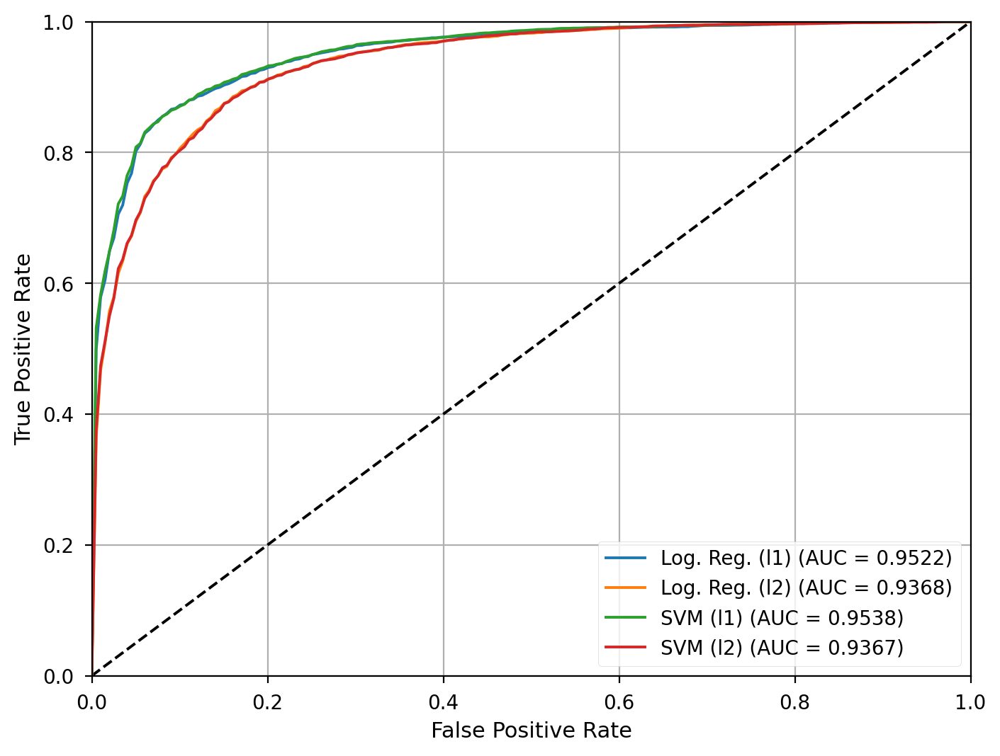

In [97]:
fig, ax = plt.subplots()
plot_roc_comparison(rocs, aucs, ax=ax, regex="Log. Reg.|SVM")

ax.grid()
ax.set_xlabel(f"False Positive Rate")
ax.set_ylabel(f"True Positive Rate")
ax.legend(loc="lower right")

fig.savefig(img_path / "linear_roc.png", format="png", bbox_inches="tight")

## Decision Tree
### Overview

In [98]:
current_path = results_path / "tree_based_models/decision_tree/"
name = "Decision Tree"

ct_df = pd.read_csv(current_path / "ct_results.csv")

accs[name] = ct_df.test_accuracy
f1_scores[name] = ct_df.test_f1
fit_times[name] = ct_df.fit_time
predict_times[name] = ct_df.predict_time
p_vals[name] = ct_df.p_value

ct_df.describe()

,train_roc_auc,test_roc_auc,train_accuracy,test_accuracy,train_f1,test_f1,fit_time,predict_time,p_value
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,2.000000e+01
mean,0.933147,0.901800,0.917833,0.879000,0.913892,0.872651,3.733218,0.004554,2.455128e-39
std,0.003669,0.009655,0.002866,0.008642,0.003230,0.009355,0.121162,0.000511,1.075083e-38
min,0.926747,0.879194,0.911667,0.860000,0.906014,0.854476,3.507018,0.003843,5.738817e-46
25%,0.930124,0.899653,0.916250,0.874167,0.911813,0.866081,3.639077,0.004269,2.232155e-44
50%,0.933369,0.902500,0.917292,0.880000,0.913435,0.873927,3.726095,0.004419,1.861804e-42
75%,0.936078,0.906403,0.919375,0.885000,0.915432,0.878015,3.823583,0.004812,9.776521e-42
max,0.938325,0.917639,0.923333,0.893333,0.920062,0.888405,3.973426,0.006004,4.812416e-38


### Validation Curve

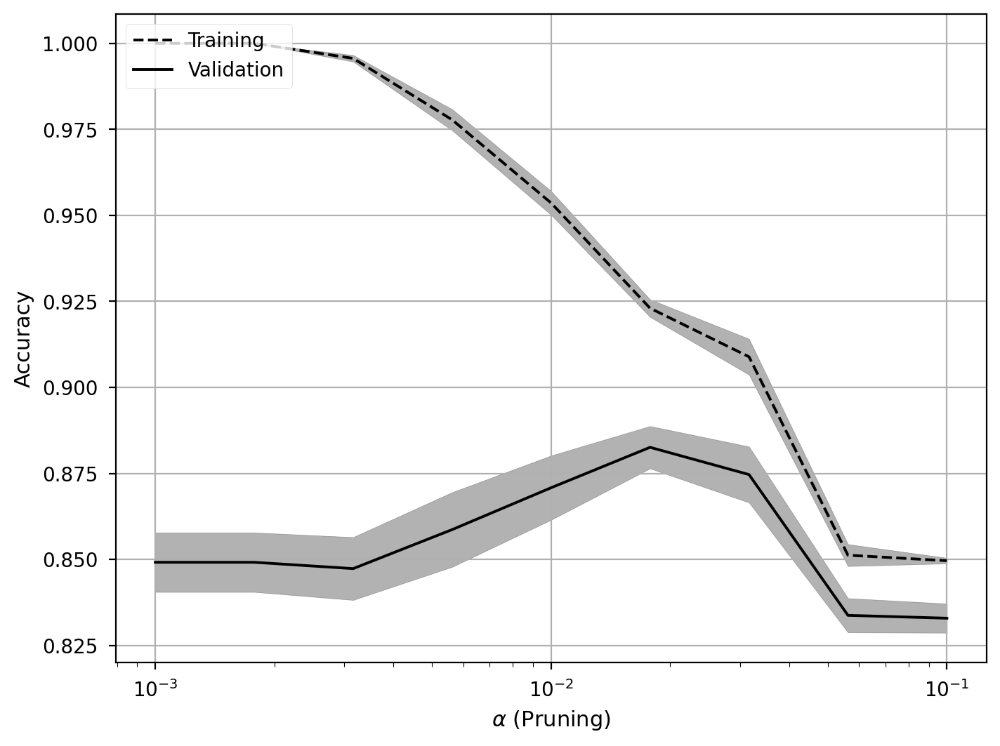

In [99]:
cv_df = pd.read_csv(current_path / "cv_results.csv")

fig, ax = plt.subplots()
plot_validation_curve(cv_df, ax=ax)

ax.set_xscale("log")
ax.set_xlabel(r"$\alpha$ (Pruning)")
ax.set_ylabel("Accuracy")
ax.grid()
ax.legend(loc="upper left")

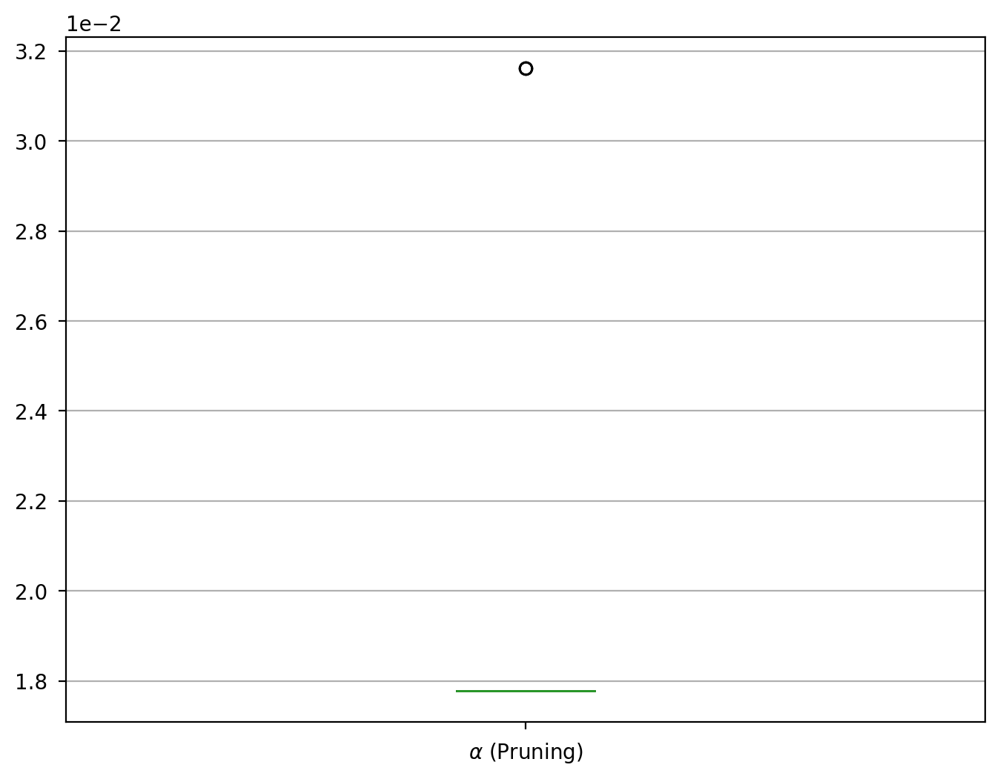

In [100]:
param_df = pd.read_csv(current_path / "param_results.csv")

fig, ax = plt.subplots()
param_df.boxplot(ax=ax, grid=False, boxprops={"color":"k"}, whiskerprops={"color":"k"})
ax.set_xticklabels([r"$\alpha$ (Pruning)"])
ax.ticklabel_format(axis="y", style="scientific", scilimits=(-2, 2))
ax.grid(axis="y")

### Confidence scores by class

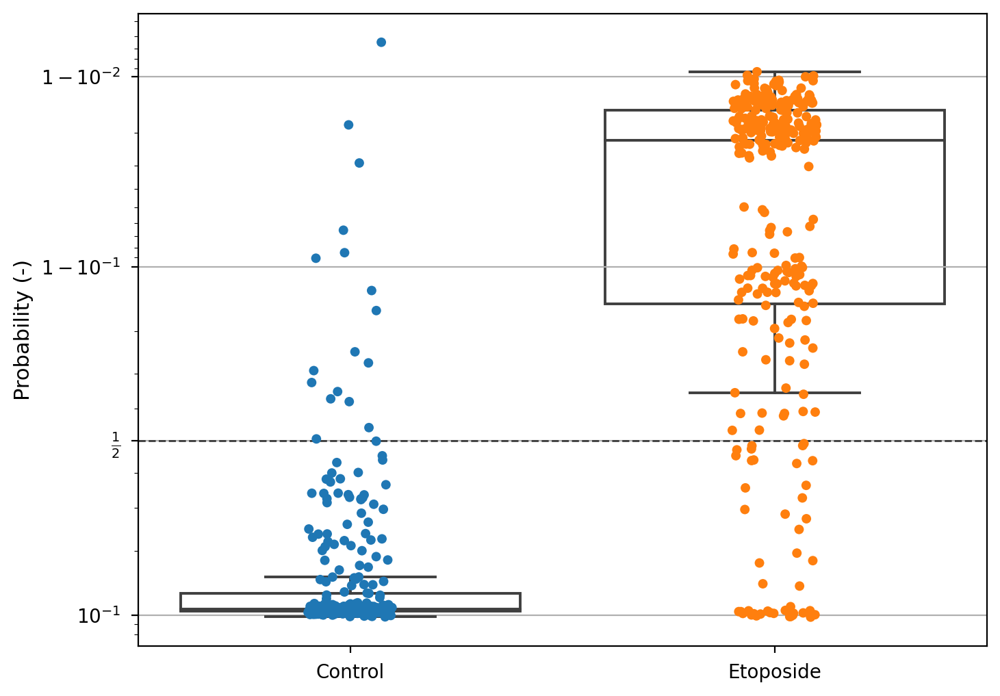

In [101]:
proba_df = pd.read_csv(current_path / "probabilities.csv", header=None)

fig, ax = plt.subplots()
plot_confidence_scores(proba_df, y_key[y], y_key, ax=ax)
ax.axhline(0.5, color="k", linestyle="--", linewidth=1, alpha=0.7)
ax.set_yscale("logit")
ax.set_ylabel("Probability (-)")
ax.grid(axis="y")

### Tree

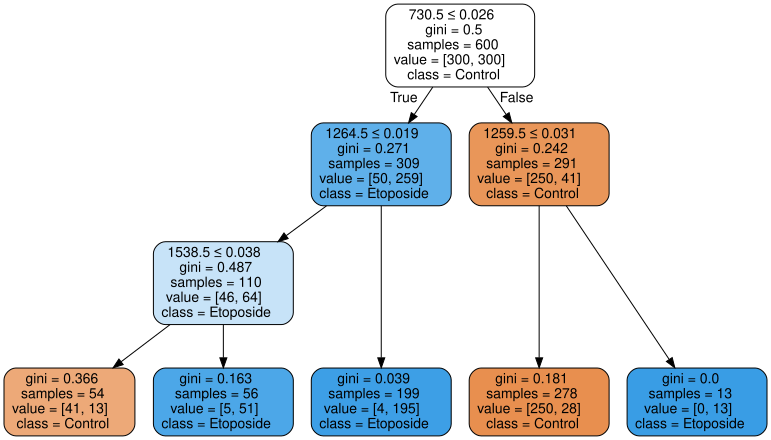

In [102]:
tree = graphviz.Source.from_file(current_path / "tree.dot")
tree.render(img_path / "tree", format="png")
tree

### Confusion Matrix

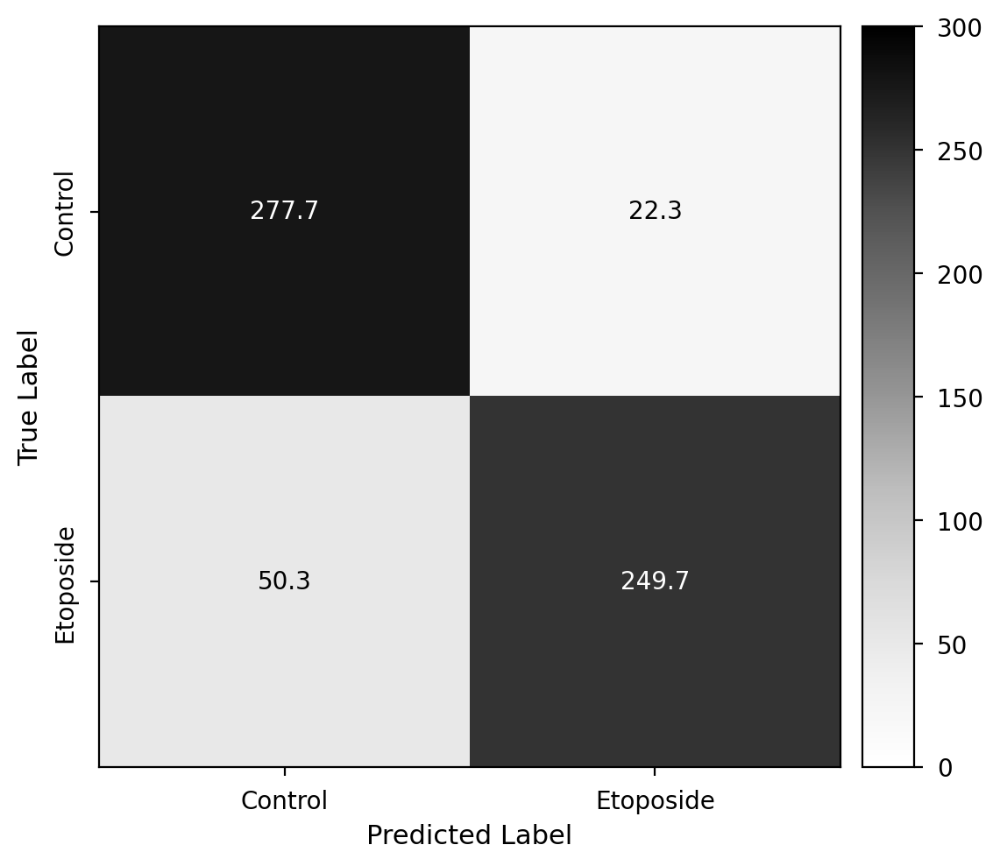

In [103]:
pred_df = pd.read_csv(current_path / "predictions.csv", header=None)

fig, ax = plt.subplots(figsize=(6,6))
plot_confusion_matrix(pred_df, y, labels=y_key, ax=ax, cmap="Greys", colorbar=True)

### ROC Curve

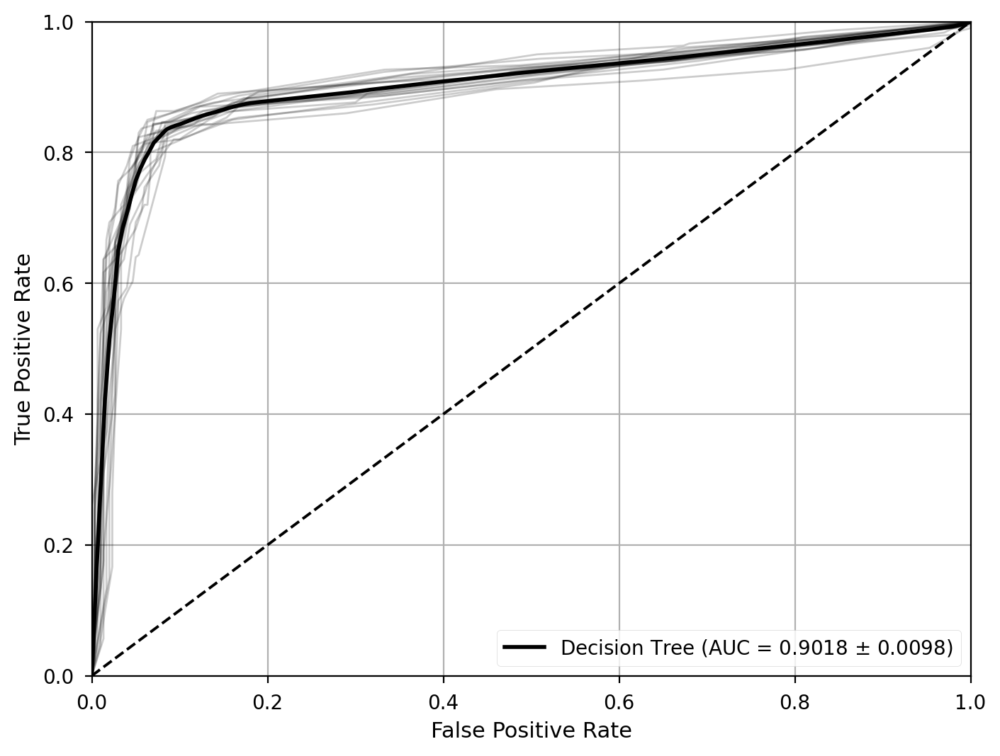

In [104]:
fig, ax = plt.subplots()
roc, auc = plot_roc_curve(proba_df, y, name, ax=ax)

ax.set_xlabel(f"False Positive Rate")
ax.set_ylabel(f"True Positive Rate")
ax.legend(loc="lower right")
ax.grid()

rocs[name] = roc
aucs[name] = auc

## Random Forest
### Overview

In [107]:
current_path = results_path / "tree_based_models/random_forest/"
name = "Random Forest"

ct_df = pd.read_csv(current_path / "ct_results.csv")

accs[name] = ct_df.test_accuracy
f1_scores[name] = ct_df.test_f1
fit_times[name] = ct_df.fit_time
predict_times[name] = ct_df.predict_time
p_vals[name] = ct_df.p_value

ct_df.describe()

,train_roc_auc,test_roc_auc,train_accuracy,test_accuracy,train_f1,test_f1,fit_time,predict_time,p_value
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,2.000000e+01
mean,0.987066,0.955278,0.937688,0.891917,0.935655,0.887066,1.629738,0.004708,1.466243e-43
std,0.000367,0.001894,0.002644,0.005522,0.002788,0.005863,0.178953,0.000247,4.509599e-43
min,0.986493,0.951500,0.932083,0.881667,0.929534,0.877480,1.446440,0.004327,2.961413e-47
25%,0.986801,0.953750,0.936250,0.888333,0.934069,0.882722,1.509028,0.004510,3.108108e-46
50%,0.987097,0.955472,0.937708,0.892500,0.935647,0.887413,1.552358,0.004644,2.912804e-45
75%,0.987365,0.955944,0.939167,0.896667,0.937186,0.891986,1.748614,0.004896,5.414313e-44
max,0.987566,0.959333,0.944167,0.900000,0.942484,0.896426,2.059507,0.005325,2.018704e-42


### Validation Curve

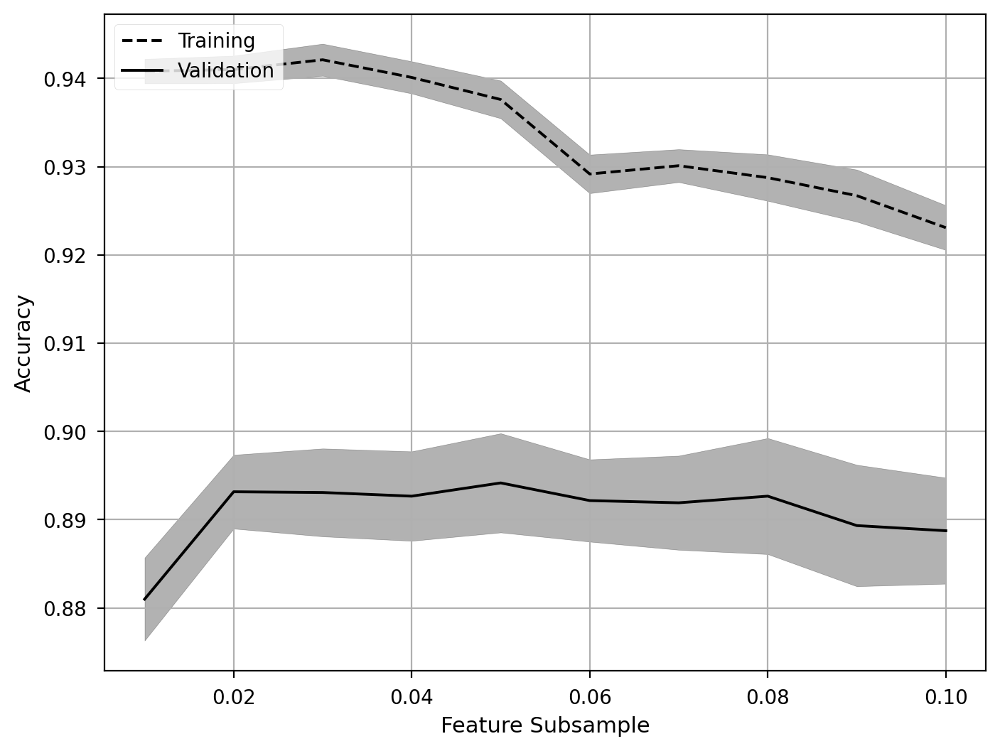

In [108]:
cv_df = pd.read_csv(current_path / "cv_results.csv")

fig, ax = plt.subplots()
plot_validation_curve(cv_df, ax=ax)

ax.set_xlabel("Feature Subsample")
ax.set_ylabel("Accuracy")
ax.grid()
ax.legend(loc="upper left")

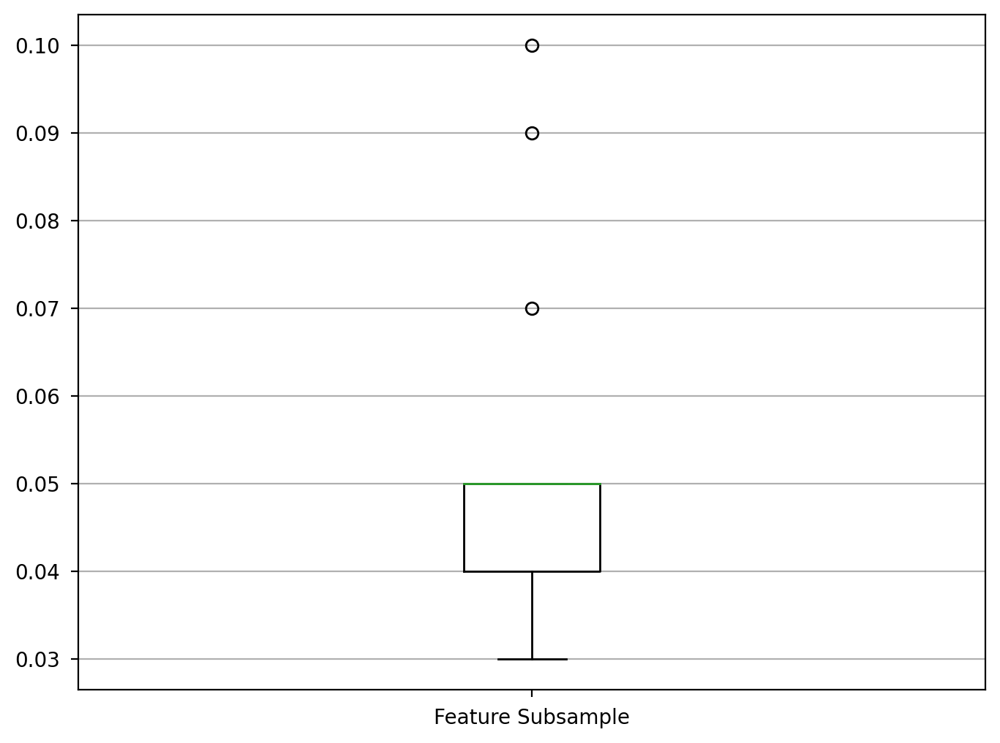

In [109]:
param_df = pd.read_csv(current_path / "param_results.csv")

fig, ax = plt.subplots()
param_df.boxplot(ax=ax, grid=False, boxprops={"color":"k"}, whiskerprops={"color":"k"})
ax.set_xticklabels(["Feature Subsample"])
ax.ticklabel_format(axis="y", style="scientific", scilimits=(-2, 2))
ax.grid(axis="y")

### Confidence scores by class

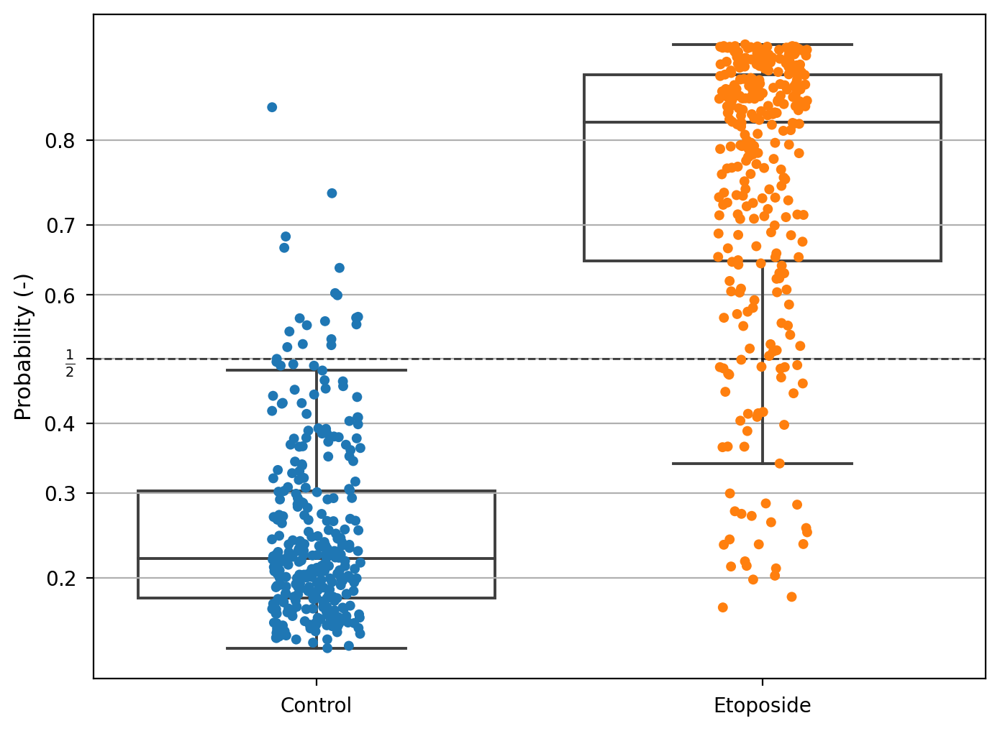

In [110]:
proba_df = pd.read_csv(current_path / "probabilities.csv", header=None)

fig, ax = plt.subplots()
plot_confidence_scores(proba_df, y_key[y], y_key, ax=ax)
ax.axhline(0.5, color="k", linestyle="--", linewidth=1, alpha=0.7)
ax.set_yscale("logit")
ax.set_ylabel("Probability (-)")
ax.grid(axis="y")

### Confusion Matrix

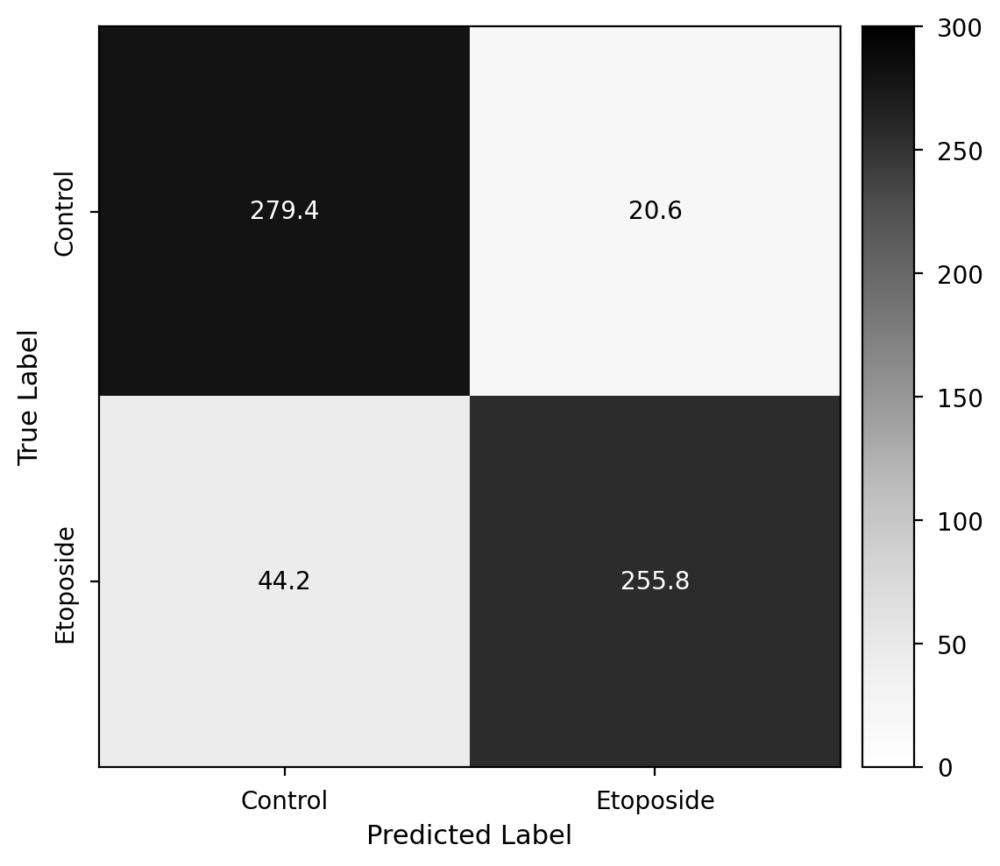

In [111]:
pred_df = pd.read_csv(current_path / "predictions.csv", header=None)

fig, ax = plt.subplots(figsize=(6,6))
plot_confusion_matrix(pred_df, y, labels=y_key, ax=ax, cmap="Greys", colorbar=True)

### ROC Curve

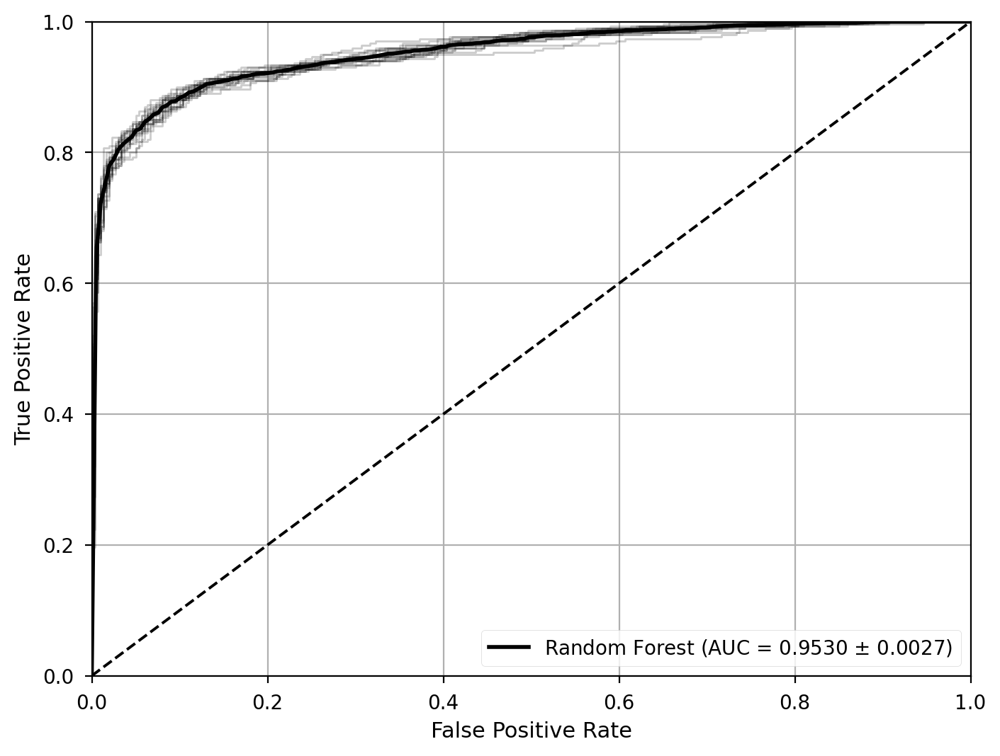

In [112]:
fig, ax = plt.subplots()
roc, auc = plot_roc_curve(proba_df, y, name, ax=ax)

ax.set_xlabel(f"False Positive Rate")
ax.set_ylabel(f"True Positive Rate")
ax.legend(loc="lower right")
ax.grid()

rocs[name] = roc
aucs[name] = auc

### Explainable AI - SHAP

In [113]:
shap_base_vals = np.genfromtxt(current_path / "shap/base_values.csv")
shap_vals = np.genfromtxt(current_path / "shap/values.csv", delimiter=",")
shap_data = np.genfromtxt(current_path / "shap/data.csv", delimiter=",")
shap_features = np.genfromtxt(current_path / "shap/feature_names.csv")
explanation = shap.Explanation(values=shap_vals, base_values=shap_base_vals, data=shap_data)

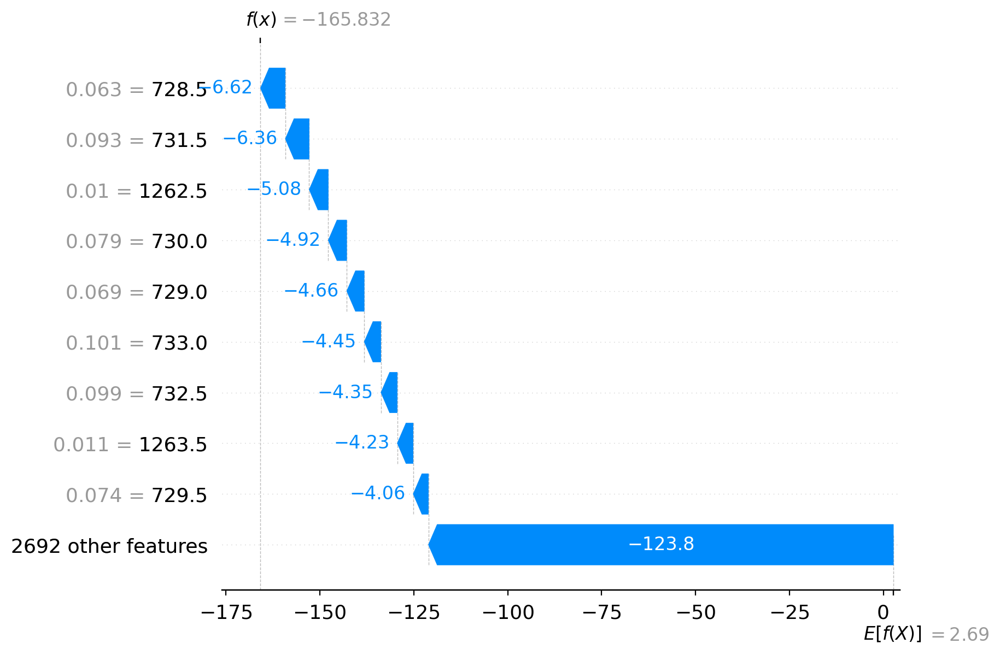

In [114]:
fig, ax = plt.subplots()
first_expl = explanation[0]
first_expl.feature_names = shap_features.astype(str)
shap.waterfall_plot(first_expl)

fig.savefig(img_path / "randomforest_shap_waterfall.png", format="png", bbox_inches="tight")

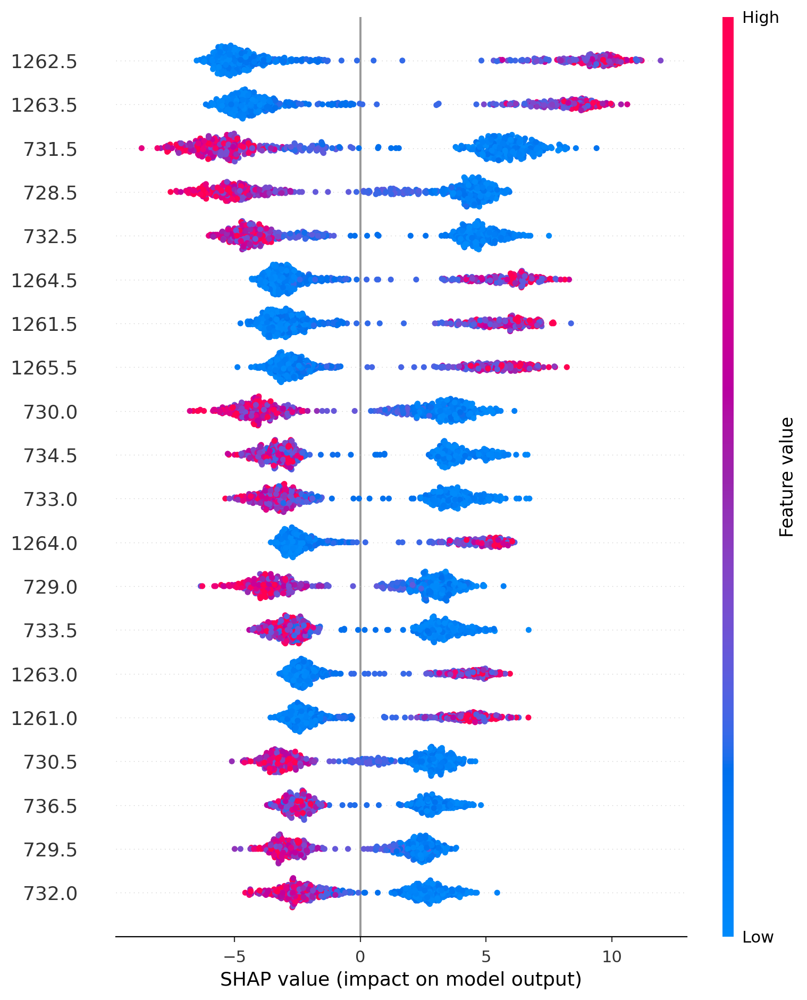

In [115]:
fig, ax = plt.subplots(figsize=(8, 12))
shap.summary_plot(explanation, feature_names=shap_features)

fig.savefig(img_path / "randomforest_shap.png", format="png", bbox_inches="tight")

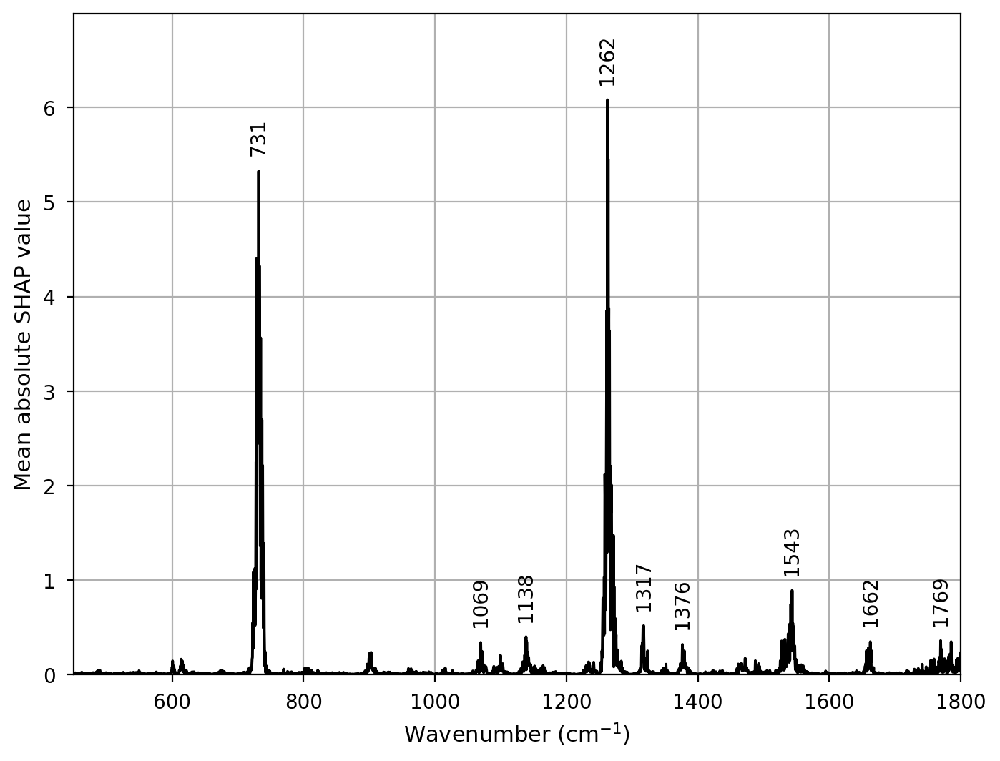

In [116]:
shap_val_df = pd.Series(data=np.mean(np.absolute(shap_vals), axis=0), index=shap_features)

fig, ax = plt.subplots()
plot_coefs(shap_val_df, ax=ax, col=False, annotate=True, annot_kw={"min_height": 0.25, 
                                                        "min_dist": 50,
                                                        "offset": 10})

ax.set_xlabel("Wavenumber ($\mathregular{cm^{-1}}$)")
ax.set_ylabel("Mean absolute SHAP value")
ax.margins(x=0, y=0.15)
ax.set_ylim(0, None)
ax.grid()

## Gradient Boosted Trees
### Overview

In [119]:
current_path = results_path / "tree_based_models/gbdt/"
name = "Gradient-boosting"

ct_df = pd.read_csv(current_path / "ct_results.csv")

accs[name] = ct_df.test_accuracy
f1_scores[name] = ct_df.test_f1
fit_times[name] = ct_df.fit_time
predict_times[name] = ct_df.predict_time
p_vals[name] = ct_df.p_value

ct_df.describe()

,train_roc_auc,test_roc_auc,train_accuracy,test_accuracy,train_f1,test_f1,fit_time,predict_time,p_value
count,20.0,20.000000,20.0,20.000000,20.0,20.000000,20.000000,20.000000,2.000000e+01
mean,1.0,0.966308,1.0,0.904917,1.0,0.902147,1.909658,0.005345,3.251218e-44
std,0.0,0.004025,0.0,0.008794,0.0,0.009570,0.304136,0.003011,1.108934e-43
min,1.0,0.958056,1.0,0.886667,1.0,0.881199,1.743854,0.004315,1.286635e-49
25%,1.0,0.965194,1.0,0.900833,1.0,0.897444,1.762522,0.004535,6.280064e-48
50%,1.0,0.965806,1.0,0.905000,1.0,0.902715,1.792711,0.004611,8.542389e-47
75%,1.0,0.969236,1.0,0.911667,1.0,0.909976,1.882947,0.004697,1.337773e-45
max,1.0,0.972444,1.0,0.918333,1.0,0.916538,2.998547,0.018073,4.931206e-43


### Validation Curve

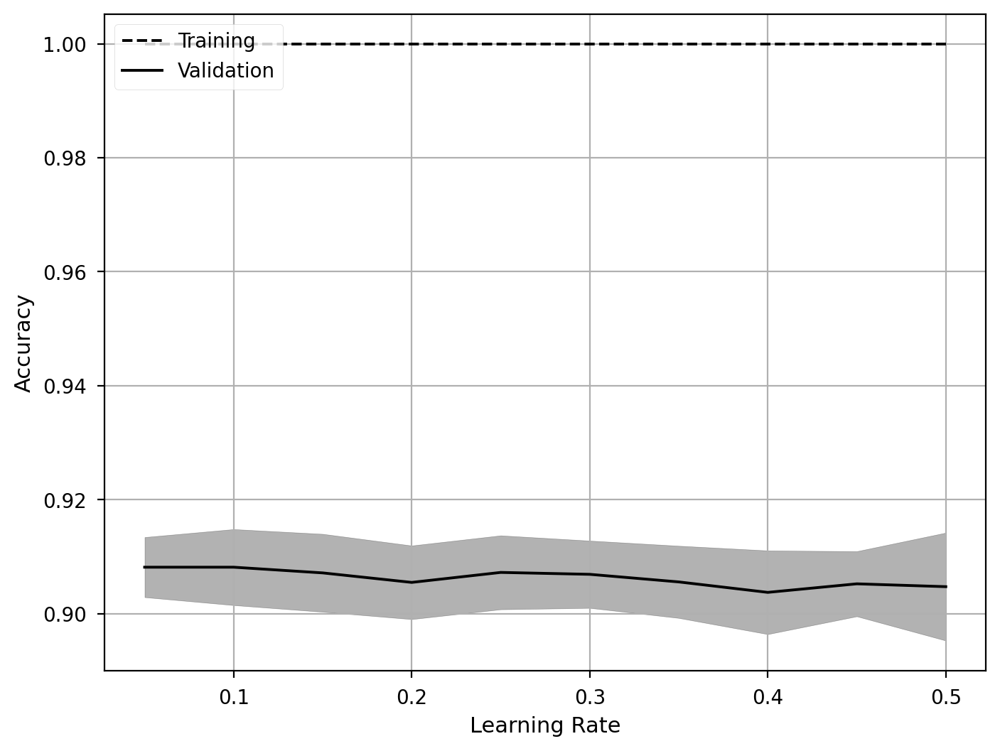

In [120]:
cv_df = pd.read_csv(current_path / "cv_results.csv")

fig, ax = plt.subplots()
plot_validation_curve(cv_df, ax=ax)

ax.set_xlabel("Learning Rate")
ax.set_ylabel("Accuracy")
ax.grid()
ax.legend(loc="upper left")

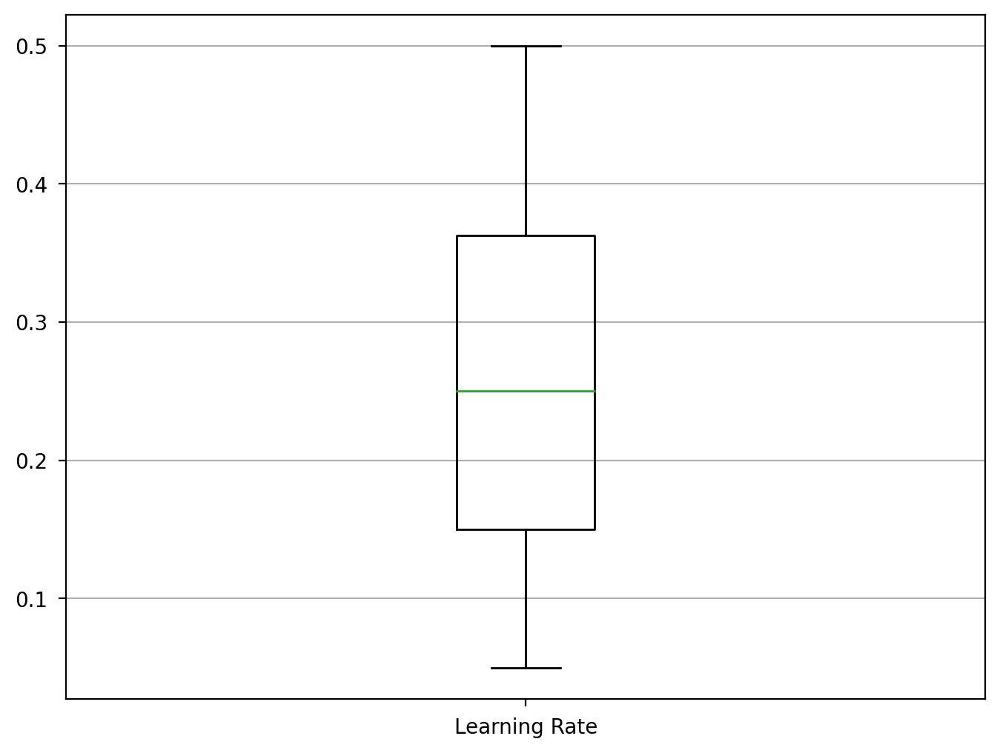

In [121]:
param_df = pd.read_csv(current_path / "param_results.csv")

fig, ax = plt.subplots()
param_df.boxplot(ax=ax, grid=False, boxprops={"color":"k"}, whiskerprops={"color":"k"})
ax.set_xticklabels(["Learning Rate"])
ax.ticklabel_format(axis="y", style="scientific", scilimits=(-2, 2))
ax.grid(axis="y")

### Confidence scores by class

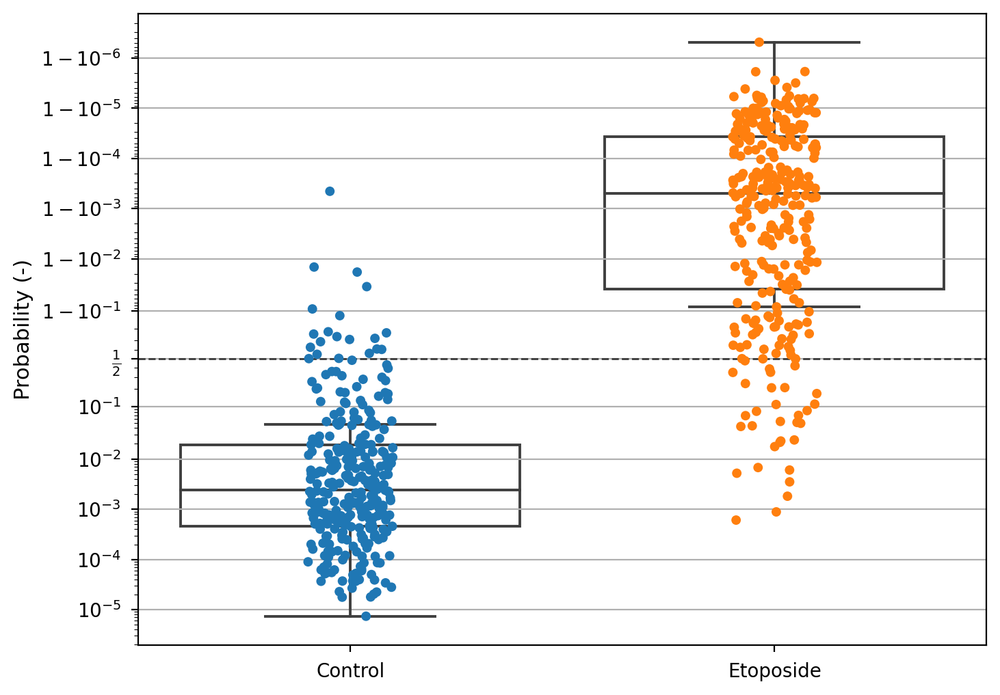

In [122]:
proba_df = pd.read_csv(current_path / "probabilities.csv", header=None)

fig, ax = plt.subplots()
plot_confidence_scores(proba_df, y_key[y], y_key, ax=ax)
ax.axhline(0.5, color="k", linestyle="--", linewidth=1, alpha=0.7)
ax.set_yscale("logit")
ax.set_ylabel("Probability (-)")
ax.grid(axis="y")

### Confusion Matrix

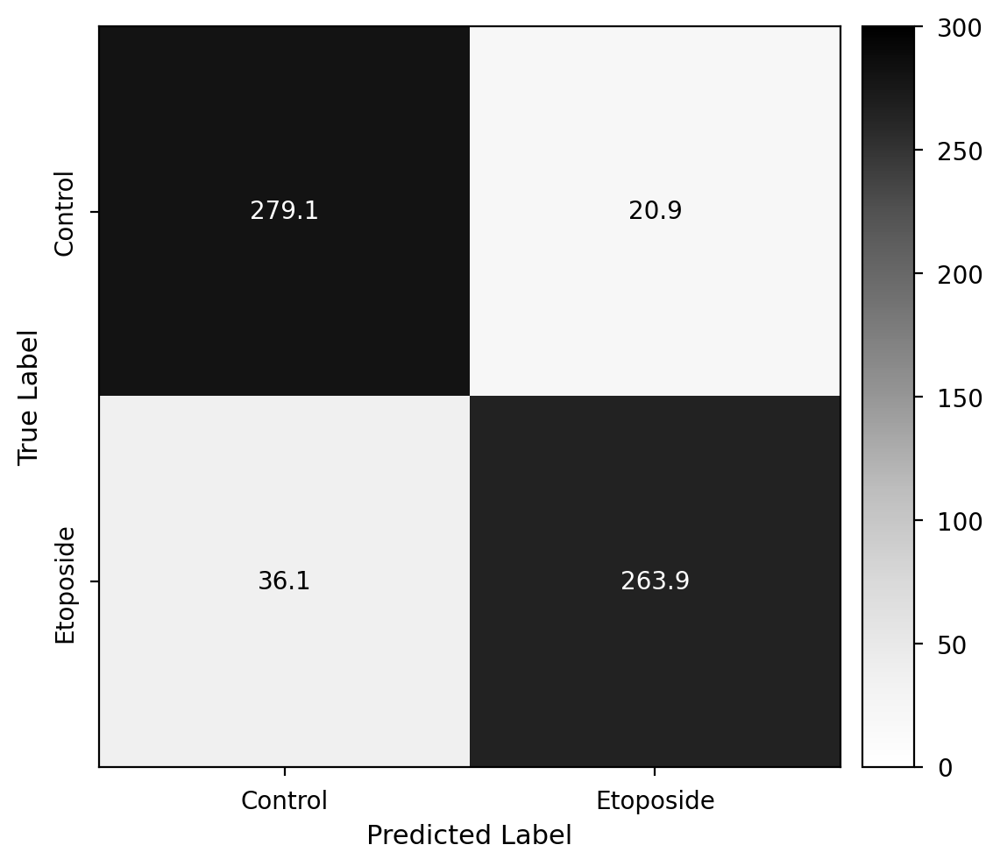

In [123]:
pred_df = pd.read_csv(current_path / "predictions.csv", header=None)

fig, ax = plt.subplots(figsize=(6,6))
plot_confusion_matrix(pred_df, y, labels=y_key, ax=ax, cmap="Greys", colorbar=True)

### ROC Curve

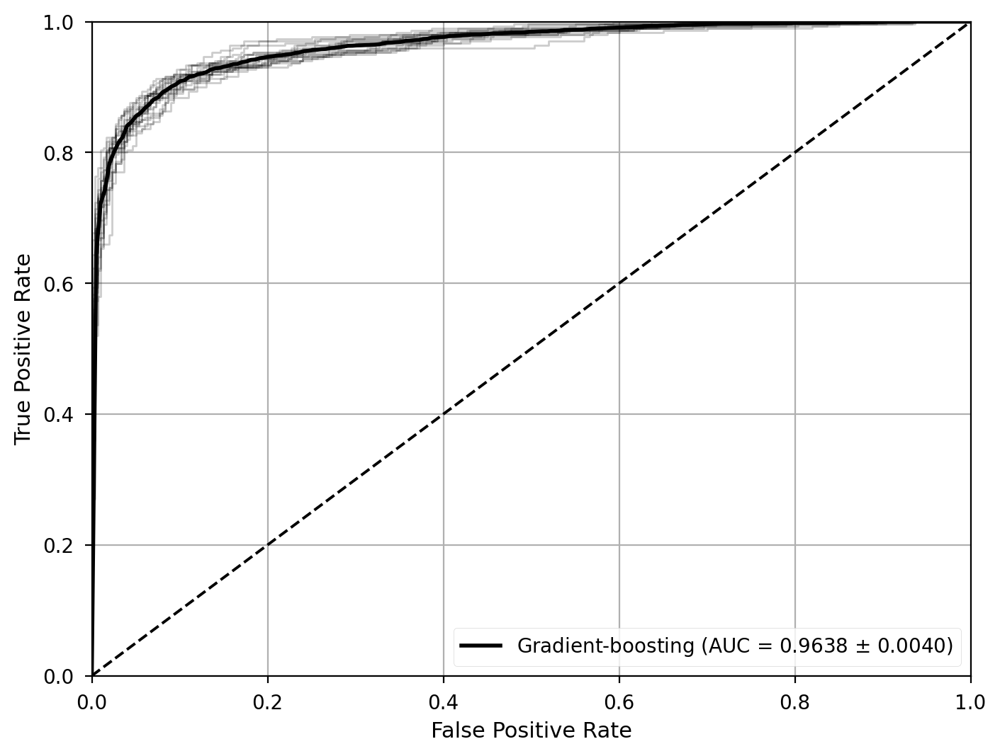

In [124]:
fig, ax = plt.subplots()
roc, auc = plot_roc_curve(proba_df, y, name, ax=ax)

ax.set_xlabel(f"False Positive Rate")
ax.set_ylabel(f"True Positive Rate")
ax.legend(loc="lower right")
ax.grid()

rocs[name] = roc
aucs[name] = auc

### Explainable AI - SHAP

In [125]:
shap_base_vals = np.genfromtxt(current_path / "shap/base_values.csv")
shap_vals = np.genfromtxt(current_path / "shap/values.csv", delimiter=",")
shap_data = np.genfromtxt(current_path / "shap/data.csv", delimiter=",")
shap_features = np.genfromtxt(current_path / "shap/feature_names.csv")
explanation = shap.Explanation(values=shap_vals, base_values=shap_base_vals, data=shap_data)

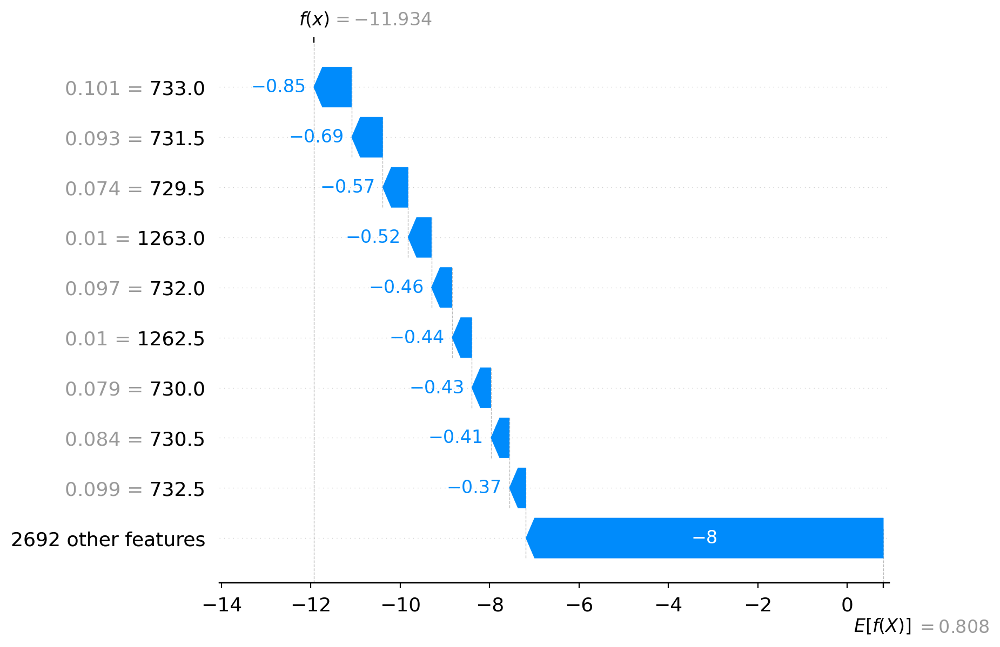

In [126]:
fig, ax = plt.subplots()
first_expl = explanation[0]
first_expl.feature_names = shap_features.astype(str)
shap.waterfall_plot(first_expl)

fig.savefig(img_path / "gbdt_shap_waterfall.png", format="png", bbox_inches="tight")

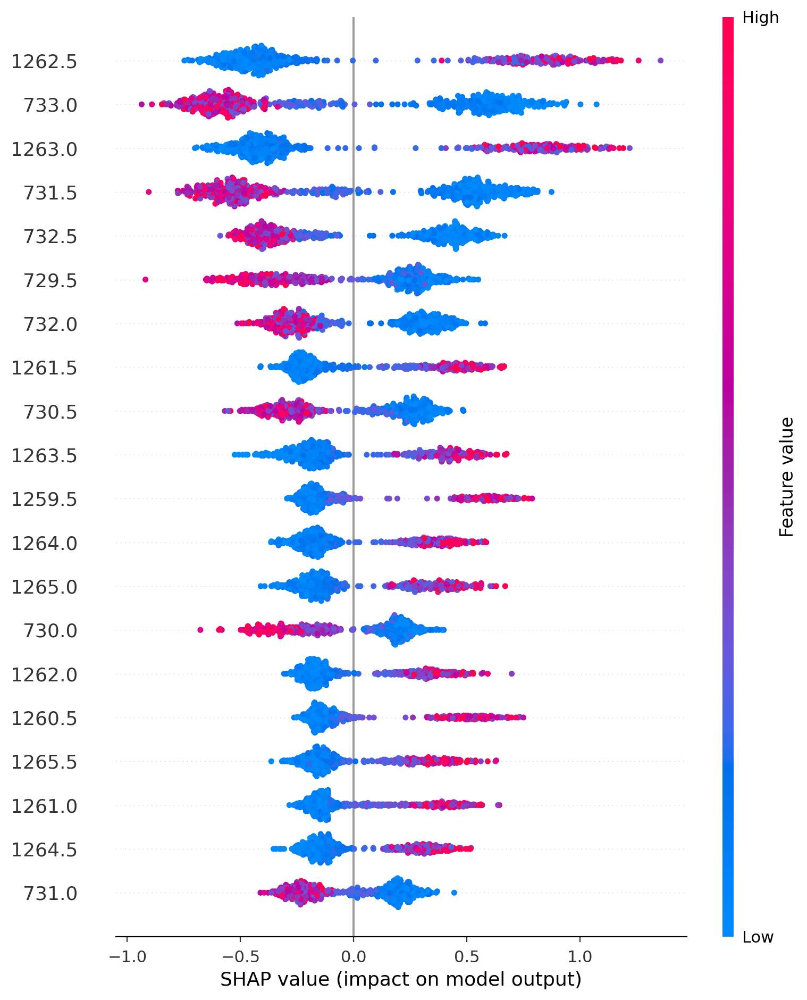

In [127]:
fig, ax = plt.subplots(figsize=(8, 12))
shap.summary_plot(explanation, feature_names=shap_features)

fig.savefig(img_path / "gbdt_shap.png", format="png", bbox_inches="tight")

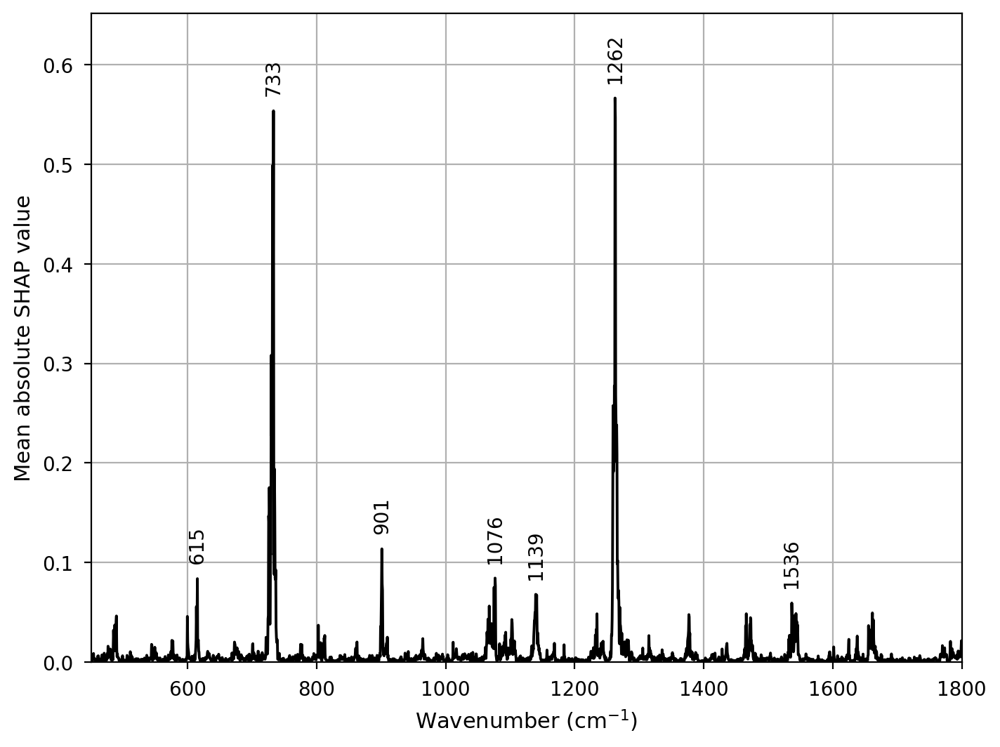

In [128]:
shap_val_df = pd.Series(data=np.mean(np.absolute(shap_vals), axis=0), index=shap_features)

fig, ax = plt.subplots()
plot_coefs(shap_val_df, ax=ax, col=False, annotate=True, annot_kw={"min_height": 0.05, 
                                                                   "min_dist": 50,
                                                                   "offset": 10})

ax.set_xlabel("Wavenumber ($\mathregular{cm^{-1}}$)")
ax.set_ylabel("Mean absolute SHAP value")
ax.margins(x=0, y=0.15)
ax.set_ylim(0, None)
ax.grid()

## Comparison of Tree-based Models

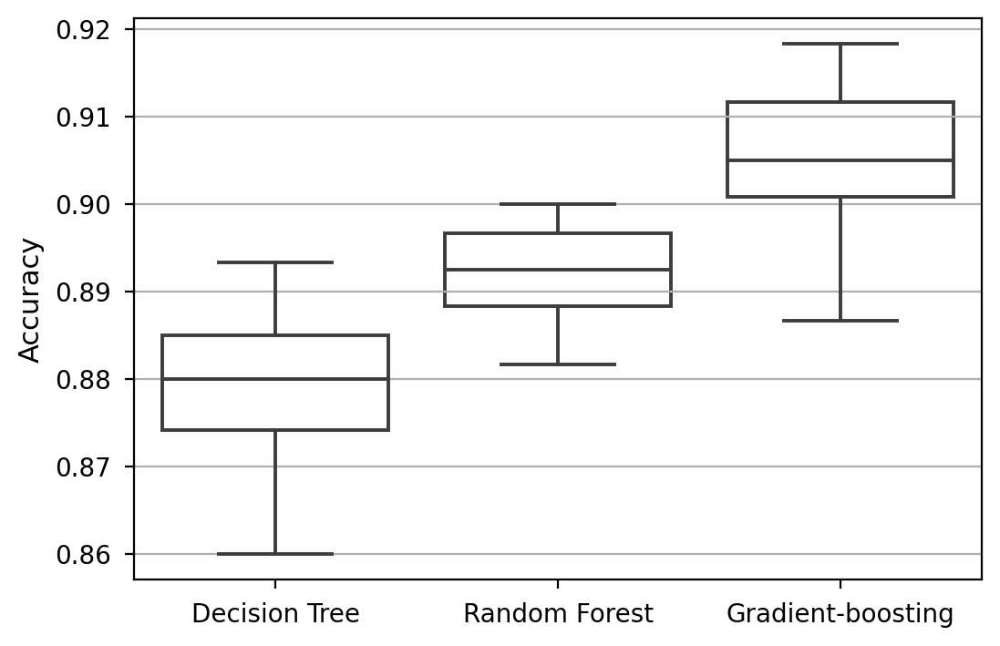

In [131]:
fig, ax = plt.subplots(figsize=(6,4))
boxplot_comparison(accs, regex="Tree|Forest|Gradient")

ax.grid(axis="y")
ax.set_ylabel("Accuracy")

fig.savefig(img_path / "tree_accuracy.png", format="png", bbox_inches="tight")

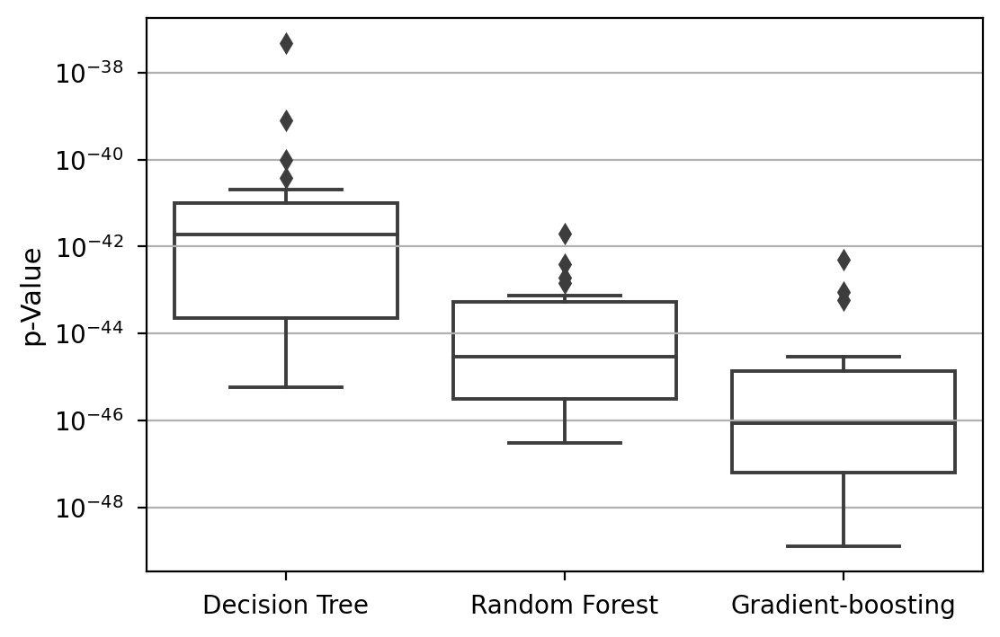

In [132]:
fig, ax = plt.subplots(figsize=(6,4))
boxplot_comparison(p_vals, regex="Tree|Forest|Gradient")

ax.set_yscale("log")
ax.grid(axis="y")
ax.set_ylabel("p-Value")

fig.savefig(img_path / "tree_pval.png", format="png", bbox_inches="tight")

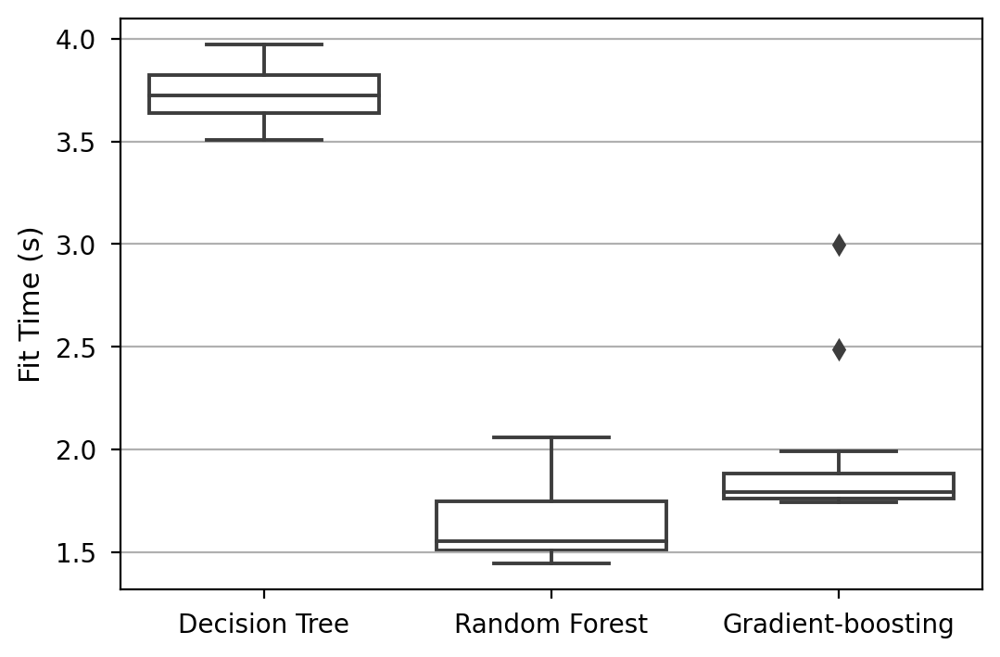

In [133]:
fig, ax = plt.subplots(figsize=(6,4))
boxplot_comparison(fit_times, regex="Tree|Forest|Gradient")

ax.grid(axis="y")
ax.set_ylabel("Fit Time (s)")

fig.savefig(img_path / "tree_fittime.png", format="png", bbox_inches="tight")

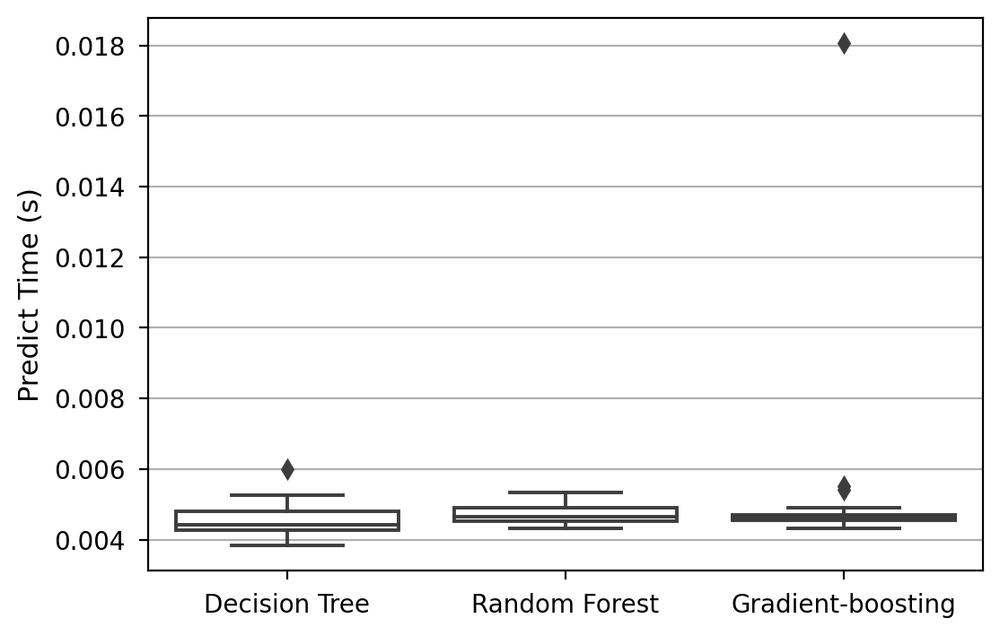

In [134]:
fig, ax = plt.subplots(figsize=(6,4))
boxplot_comparison(predict_times, regex="Tree|Forest|Gradient")

ax.grid(axis="y")
ax.set_ylabel("Predict Time (s)")

fig.savefig(img_path / "tree_predicttime.png", format="png", bbox_inches="tight")

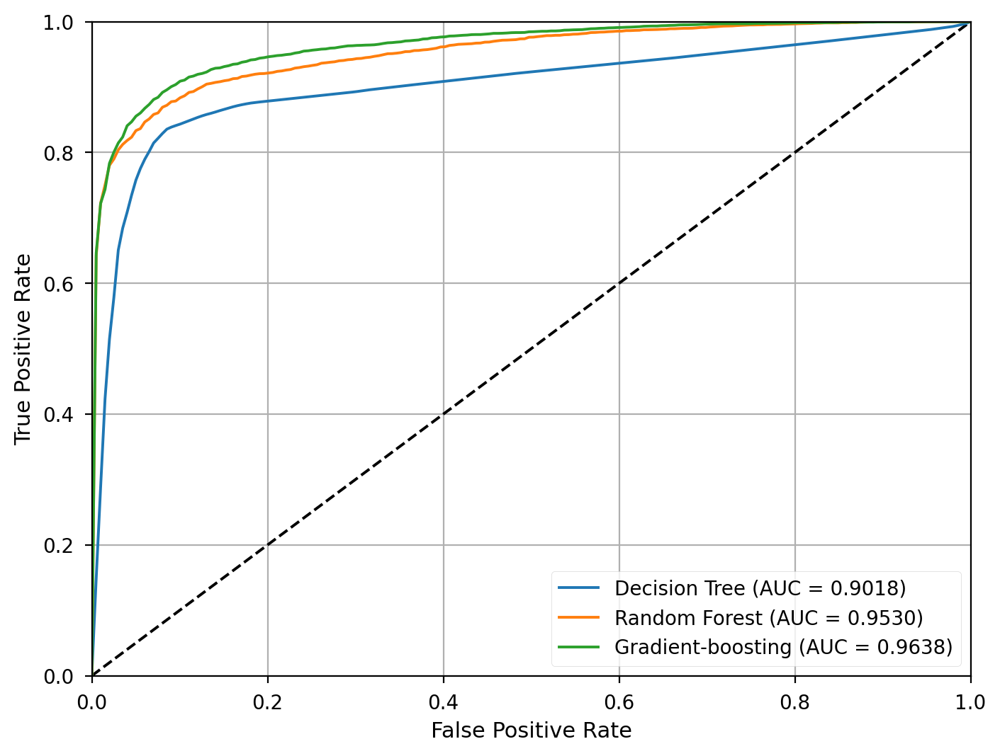

In [135]:
fig, ax = plt.subplots()
plot_roc_comparison(rocs, aucs, ax=ax, regex="Tree|Forest|Gradient")

ax.grid()
ax.set_xlabel(f"False Positive Rate")
ax.set_ylabel(f"True Positive Rate")
ax.legend(loc="lower right")

fig.savefig(img_path / "tree_roc.png", format="png", bbox_inches="tight")

## Overall Comparison

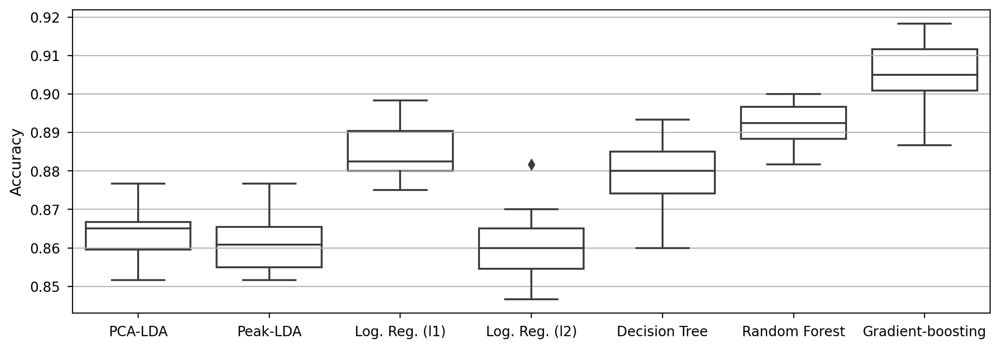

In [136]:
fig, ax = plt.subplots(figsize=(12,4))
boxplot_comparison(accs, regex="PCA|Peak|Log. Reg|Tree|Forest|Gradient")

ax.grid(axis="y")
ax.set_ylabel("Accuracy")

fig.savefig(img_path / "all_accuracy.png", format="png", bbox_inches="tight")

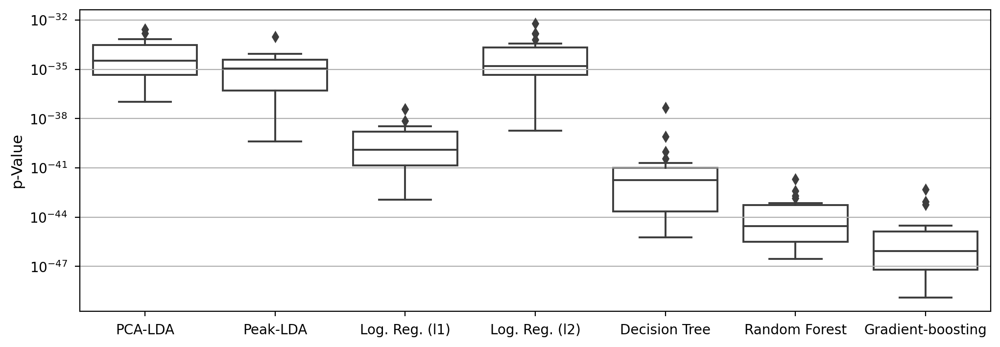

In [137]:
fig, ax = plt.subplots(figsize=(12,4))
boxplot_comparison(p_vals, regex="PCA|Peak|Log. Reg|Tree|Forest|Gradient")

ax.set_yscale("log")
ax.grid(axis="y")
ax.set_ylabel("p-Value")

fig.savefig(img_path / "all_pval.png", format="png", bbox_inches="tight")

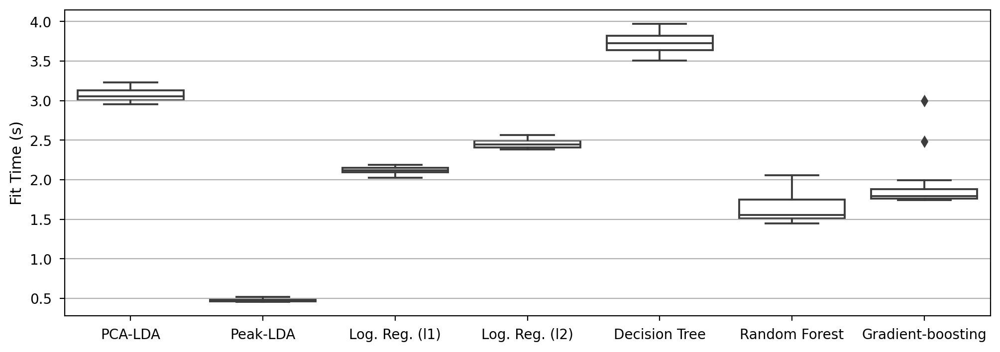

In [138]:
fig, ax = plt.subplots(figsize=(12,4))
boxplot_comparison(fit_times, regex="PCA|Peak|Log. Reg|Tree|Forest|Gradient")

ax.grid(axis="y")
ax.set_ylabel("Fit Time (s)")

fig.savefig(img_path / "all_fittime.png", format="png", bbox_inches="tight")

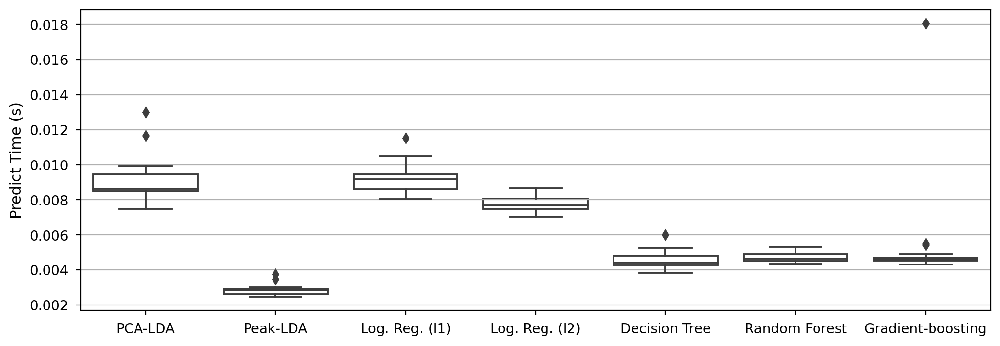

In [139]:
fig, ax = plt.subplots(figsize=(12,4))
boxplot_comparison(predict_times, regex="PCA|Peak|Log. Reg|Tree|Forest|Gradient")

ax.grid(axis="y")
ax.set_ylabel("Predict Time (s)")

fig.savefig(img_path / "all_predicttime.png", format="png", bbox_inches="tight")

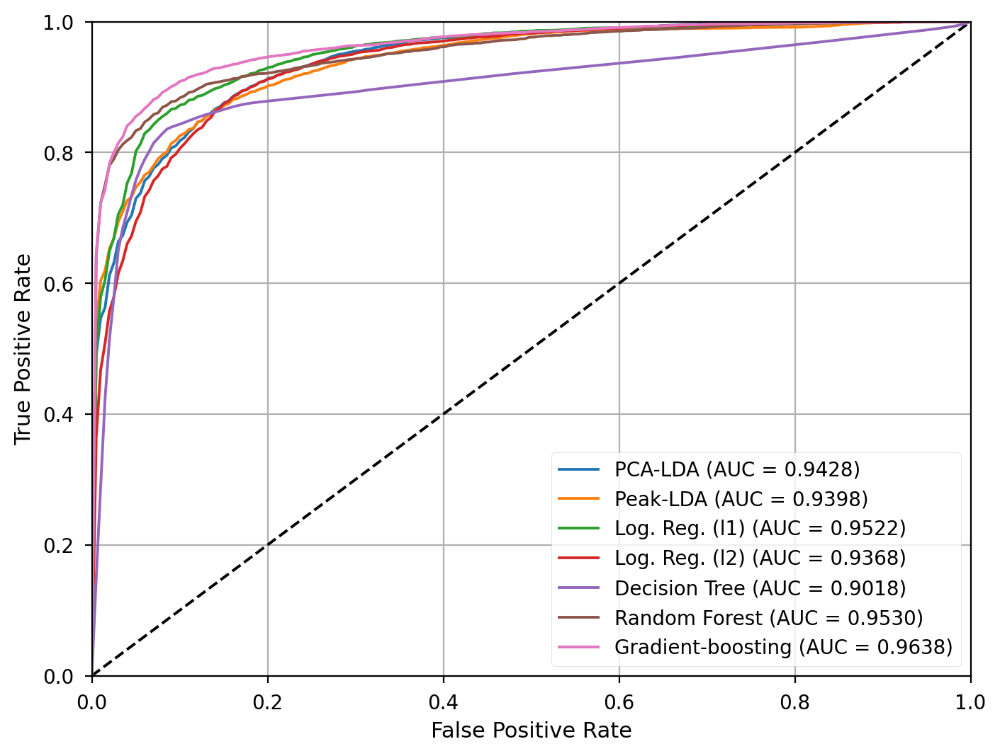

In [140]:
fig, ax = plt.subplots()
plot_roc_comparison(rocs, aucs, ax=ax, regex="PCA|Peak|Log. Reg|Tree|Forest|Gradient")

ax.grid()
ax.set_xlabel(f"False Positive Rate")
ax.set_ylabel(f"True Positive Rate")
ax.legend(loc="lower right")

fig.savefig(img_path / "all_roc.png", format="png", bbox_inches="tight")